$$\bf{\text{Kaggle Project of Predicting Housing Prices}}$$

**Author: Ray Sun**

**Date: 28/11 2021**

**Github: [rayhezack](https://github.com/rayhezack)**
___

**Background Info**

Ask a home buyer to describe their dream house, and they probably won't begin with the height of the basement ceiling or the proximity to an east-west railroad. But this playground competition's dataset proves that much more influences price negotiations than the number of bedrooms or a white-picket fence.

With 79 explanatory variables describing (almost) every aspect of residential homes in Ames, Iowa, this competition challenges you to predict the final price of each home.

**Framework:**

- Data Loading
- Exploratory Data Analysis
- Data Cleaning
- Feature Engineering
- Model Seleciton
- Model Evaluation
- Prediction

# Data Loading

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
import os
warnings.simplefilter(action='ignore') # suppres all warnings
%matplotlib inline

pd.set_option('display.float_format', lambda x: '{:.6f}'.format(x))
sns.set_style("darkgrid")

In [2]:
train_da = pd.read_csv("train.csv")
test_da = pd.read_csv("test.csv")
display(train_da.head())

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.000000,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.000000,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.000000,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.000000,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.000000,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
# look at the data structure
display(train_da.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

None

**Insights:**

- There are total 81 variables and 1460 rows of observations.
- Obviously, there are several variables including missing values.
- Variables can be divided into three classes, object, float and int. We can write functions to extract columns with different categories so as to perform distinct transformations on these variables.

In [4]:
def get_columns(data):
    # extract cat columns
    s = data.dtypes == "object"
    object_cols = data.columns[s].tolist()

    # extract num columns
    n = (data.dtypes == "int64") | (data.dtypes == "float64")
    numerical_cols = data.columns[n].tolist()
    # drop target variable from numerical cols

    # find out discrete cols from numerical cols
    discrete_cols = [num_col for num_col in numerical_cols if data[num_col].nunique()<=20]
    
    # get continuous cols
    mark = pd.Series(numerical_cols).isin(discrete_cols)
    continuous_cols = pd.Series(numerical_cols)[~mark].tolist()
    
    return object_cols,numerical_cols,discrete_cols,continuous_cols

# drop ID 
train_da.drop("Id",axis=1,inplace=True)
test_da.drop("Id",axis=1,inplace=True)
object_cols,numerical_cols,discrete_cols,continuous_cols = get_columns(train_da)

In [5]:
# check the summary stats of numerical cols
train_da[numerical_cols].describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


Through a quick look at the descriptive results, we can summarize some findings:

- When checking the minimal values and maximal values of each variable, we can easily find that for some variables, such as `LotArea` and `BsmtFinSF1`, values can span several orders of magnitude. The spanning suggests that we might need to perform some transformation on these variables to get rid of **the heavy-tail distribution.**
- Then the scale across variables are obviously different, with some variables being very small and others being very large. The different orders of magnitude can wreak havoc in leanring methods, so feature scaling might need to be implemented.

# Exploratory Data Analysis

When exploring the dataset, we always need to ask ourselves two questions:

- What type of variation occurs within my variables?
- What type of covariation occurs between my variables?

Variation within variables indicate that we need to inspect the magnitude, scale, and distribution of variables by histogram or boxplot, etc, while covariation between variables mean **whether variables are correlated with each other? Whether the impact of one predictor on target variable is influenced by other variables?(interaction) and so on.**



## Variation within Variables

In this section, I will first explore the target variable first and then all other predictor variables.8

### Target Variable

For target variable, I will examined the distribution of it by histogram and QQ-plot(quantile-quantile plot).

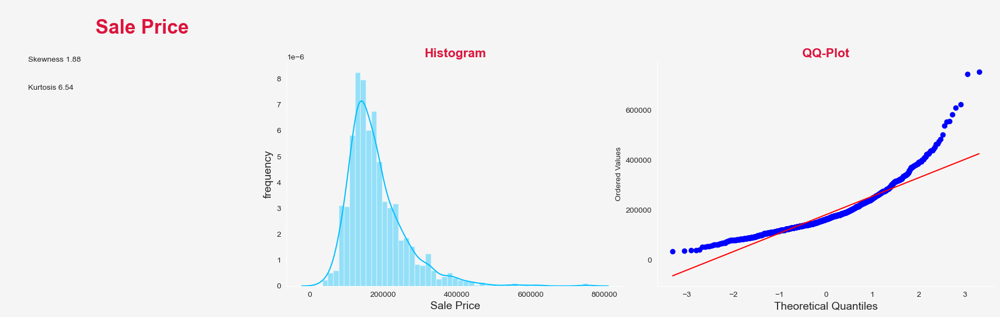

In [6]:
from scipy.stats import probplot

def check_normality(data,col,label_txt,conclusion=None,color="deepskyblue"):
    fig = plt.figure(facecolor='whitesmoke',figsize=(20,5),dpi=100)

    ax_left = fig.add_axes([0,0,.2,1], facecolor='whitesmoke')
    ax_left.axis("off")
    ax_left.text(.4,.9,label_txt,color="crimson",weight="bold",size=25)
    ax_left.text(.1,.8,"Skewness {:.2f}".format(stats.skew(data[col],bias=False),size=30))
    ax_left.text(.1,.7,"Kurtosis {:.2f}".format(stats.kurtosis(data[col],bias=False),size=30))
    #ax_left.text(.1,.4,"Conclusion:\n{}".format(conclusion),size=15)
    
    # histogram
    ax1 = fig.add_axes([0.25,0,0.3,0.8],facecolor="whitesmoke")
    sns.distplot(data[col],color=color,kde=True,ax=ax1)
    ax1.set_xlabel(label_txt,fontsize=14)
    ax1.set_ylabel("frequency",fontsize=14)
    ax1.set_title("Histogram",color="crimson",fontsize=16,weight="bold")
    ax1.tick_params(labelsize=10)
    for spine in ["top","right"]:
        ax1.spines[spine].set_visible(False)
    ax1.grid(False)

    # qq plot
    ax2 = fig.add_axes([0.58,0,0.3,0.8],facecolor="whitesmoke")
    probplot(data[col],plot=ax2)
    ax2.set_xlabel("Theoretical Quantiles",fontsize=14)
    ax2.tick_params(labelsize=10)
    ax2.set_title("QQ-Plot",color="crimson",fontsize=16,weight="bold")
    for spine in ["top","right"]:
        ax2.spines[spine].set_visible(False)
    ax2.grid(False)

    plt.show()
    
conclusion_txt = "Sale Price has slight Positive \nSkewness and greater kurtosis \nthan that of normial distribution"
check_normality(train_da,"SalePrice","Sale Price",conclusion_txt)

**Interpretation:**

- Skewness: A standard normal distribition has skewness of zero, but the skewness of tagret variable is 1.88. Also, histogram and qq plot can tell us the target variable is not normally distributed with slight positive skewness because the histogram has longer tail in the right side of the distribution and data points at both tails of QQ plot lie off the straight line.
- Kurtosis: The kurtosis of normal distribution is 3 while that of the target variable is 6.54, suggesting heavier tails than tails of normal distribution. The heavier tails mean that values in both tails are **much more extreme** than those of normal distribution.

**Summary:**

The distribution of target variable is a typical patten of heavy-tailed distribution: most of sale prices are small values but a few sale prices are extremely large. We can perform *log transformation* or *boxcox transformation* on the target variable to compress the long tail in the high end of the distribution into shorter tail.

In [7]:
# perform log trasnformation on the target variable
train_da["lg_SalePrice"] = np.log(train_da["SalePrice"])

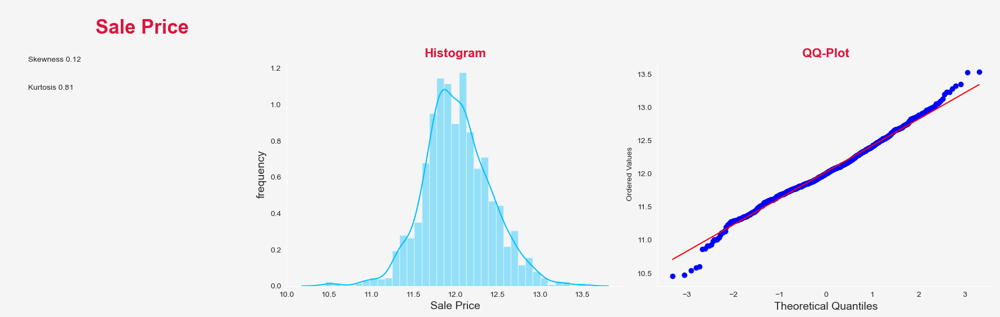

In [8]:
check_normality(train_da,"lg_SalePrice","Sale Price","Quasi-Normal Distribution")

As expected, the distritbuion of SalePrice is basically normal now.

### Predictor Variables

In the section, we split the predictors into categorical variables and continuous variables and discrete variables. Then, we inspect the distribution of variables of the three classes.

#### Continuous Variables

Let's make histograms for continuous variables to examine the distribution of features. If many features are not normally distributed, we might can transform them to be more Gaussian so that some linear models perform better when using these features.

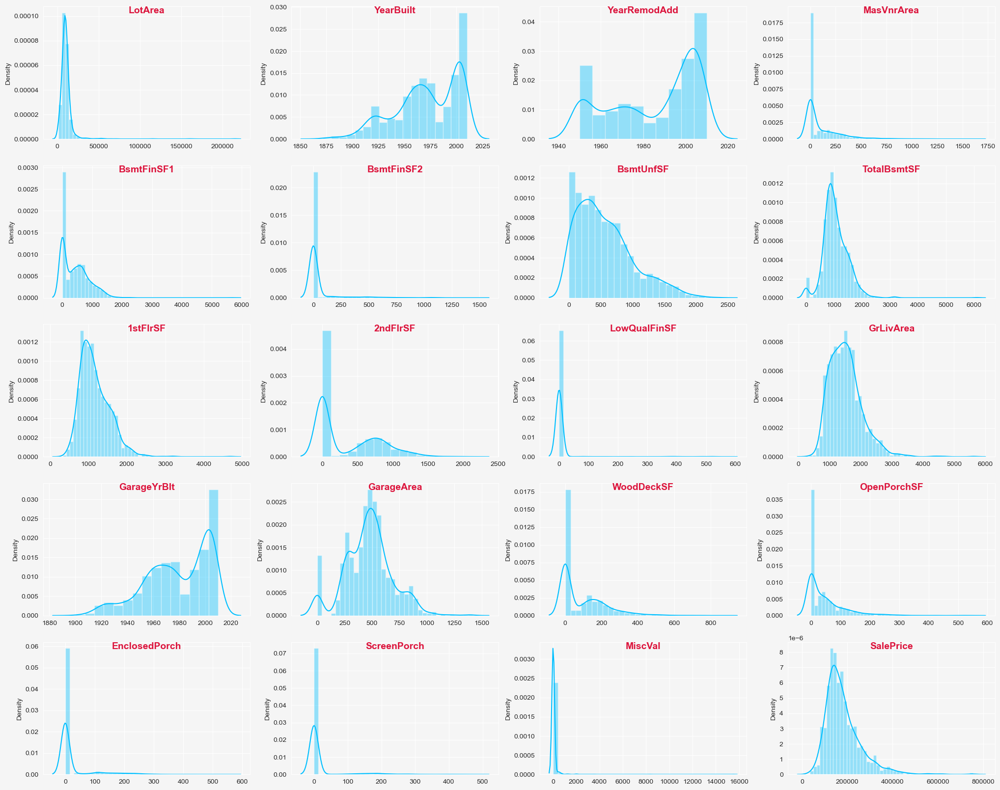

In [9]:
# write function to visualize the distribution of variables
def check_dist(row,col,data,cols,color,isbox=True,figsize=25):
    fig,axes = plt.subplots(row,col,figsize=(25,25),dpi=100,facecolor="whitesmoke")
    i = 0
    if isbox:
        for r in range(row):
            for c in range(col):
                try:
                    sns.boxplot(y=data[cols[i]],ax=axes[r,c],color=color)
                    text_title = cols[i]
                    i += 1
                    axes[r,c].set_facecolor("whitesmoke")
                    axes[r,c].set_title(text_title,fontsize=10,weight="bold")
                    axes[r,c].set_xlabel("")
                except IndexError:
                    pass
    else:
         for r in range(row):
            for c in range(col):
                try:
                    sns.distplot(data[cols[i]],ax=axes[r,c],color=color)
                    text_title = cols[i]
                    i += 1
                    axes[r,c].set_facecolor("whitesmoke")
                    axes[r,c].set_title(text_title,y=1,pad=-10,fontsize=14,fontweight="bold",color="crimson")
                    axes[r,c].set_xlabel("")
                except IndexError:
                    pass       
        
    # delete all surplus subplots that do not include any graphs
    if row*col > len(cols):
        total_plot_num = row*col
        plot_num = total_plot_num-len(cols)
        for i in reversed(list(range(plot_num))):
            axes[row-1,col-i-1].set_visible(False)
            
    plt.show()
    
check_dist(6,4,train_da,pd.Series(continuous_cols).drop(labels=0).tolist(),"deepskyblue",False)

**Interpretation:**

- A range of variables show binmodal or multimodel distributions, such as `YearBuilt`, `YearRemodAdd`, `2ndFirSF`, and `GarageYrBit`, and the distribution violates the assumption of linear models. I decided to perform Gaussian Mixture Modeling to transform these varaibles.
- There are also some variables, such as `LotArea` and `MasVnrArea`, that are positively skewed distributed. The heavy-tailed distribution can be transformed by log transform.

#### Categorical Variables

Through viewing the distribution of categorical variables, I try to discover insights into which categorical variable has logical ordering so that we can conduct *ordinal encoding* on such variables. As for categorical variables without logical sequence, I will just perform *one-hot* encoding on them.

In [10]:
nunique_num = [train_da[obj_col].nunique() for obj_col in object_cols]
print("The Number of Categories for each Categorical Variable")
print("___________________________________________")
res = pd.DataFrame({"Feature name":object_cols,"Unique Categories":nunique_num})
cm = sns.light_palette("deepskyblue", as_cmap=True)
res.sort_values(by="Unique Categories",ascending=False).style.background_gradient(cm)

The Number of Categories for each Categorical Variable
___________________________________________


,Feature name,Unique Categories
8,Neighborhood,25
16,Exterior2nd,16
15,Exterior1st,15
41,SaleType,9
9,Condition1,9
10,Condition2,8
12,HouseStyle,8
14,RoofMatl,8
31,Functional,7
25,BsmtFinType2,6


In [11]:
def plot_cat_dist(df,cat_cols,row,col,color,IsCat,unique_res=None):
    """Plot the distribution of categorical variables or discrete variables"""
    
    # create figure and multiple axes based on the number of variables
    fig,axes = plt.subplots(row,col,figsize=(25,25),dpi=100,facecolor="whitesmoke")
    
    # judge whether we make bar chars for categorical variables or discrete variables
    if IsCat:
        # filter out car with less than 15 categories
        mark = (res["Unique Categories"]<=15) & (res["Unique Categories"]!=1)
        # extract columns
        cat_cols = res[mark]["Feature name"].tolist()

        i = 0
        for r in range(row):
            for c in range(col):
                try:
                    temp = df[cat_cols[i]].value_counts().reset_index().rename(columns={"index":cat_cols[i],cat_cols[i]:"Frequency"})
                    sns.barplot(data=temp,x=cat_cols[i],y="Frequency",color=color,ax=axes[r,c])
                    text_title = cat_cols[i]
                    i += 1
                    axes[r,c].set_facecolor("whitesmoke")
                    axes[r,c].set_title(text_title,fontsize=10,weight="bold",pad=-12,y=1)
                    axes[r,c].set_xlabel("")
                    for spine in ["right","top"]:
                        axes[r,c].spines[spine].set_visible(False)
                    axes[r,c].tick_params(labelsize=10,rotation=45)
                except IndexError:
                    pass
    else:
        i = 0
        for r in range(row):
            for c in range(col):
                try:
                    temp = df[cat_cols[i]].value_counts().reset_index().rename(columns={"index":cat_cols[i],cat_cols[i]:"Frequency"})
                    sns.barplot(data=temp,x=cat_cols[i],y="Frequency",color=color,ax=axes[r,c])
                    text_title = cat_cols[i]
                    i += 1
                    axes[r,c].set_facecolor("whitesmoke")
                    axes[r,c].set_title(text_title,fontsize=10,weight="bold",pad=-12,y=1)
                    axes[r,c].set_xlabel("")
                    for spine in ["right","top"]:
                        axes[r,c].spines[spine].set_visible(False)
                    axes[r,c].tick_params(labelsize=10,rotation=45)
                except IndexError:
                    pass
                
    # delete all surplus subplots that do not include any graphs
    if row*col > len(cat_cols):
        total_plot_num = row*col
        plot_num = total_plot_num-len(cat_cols)
        for i in reversed(list(range(plot_num))):
            axes[row-1,col-i-1].set_visible(False)
            

    plt.show()

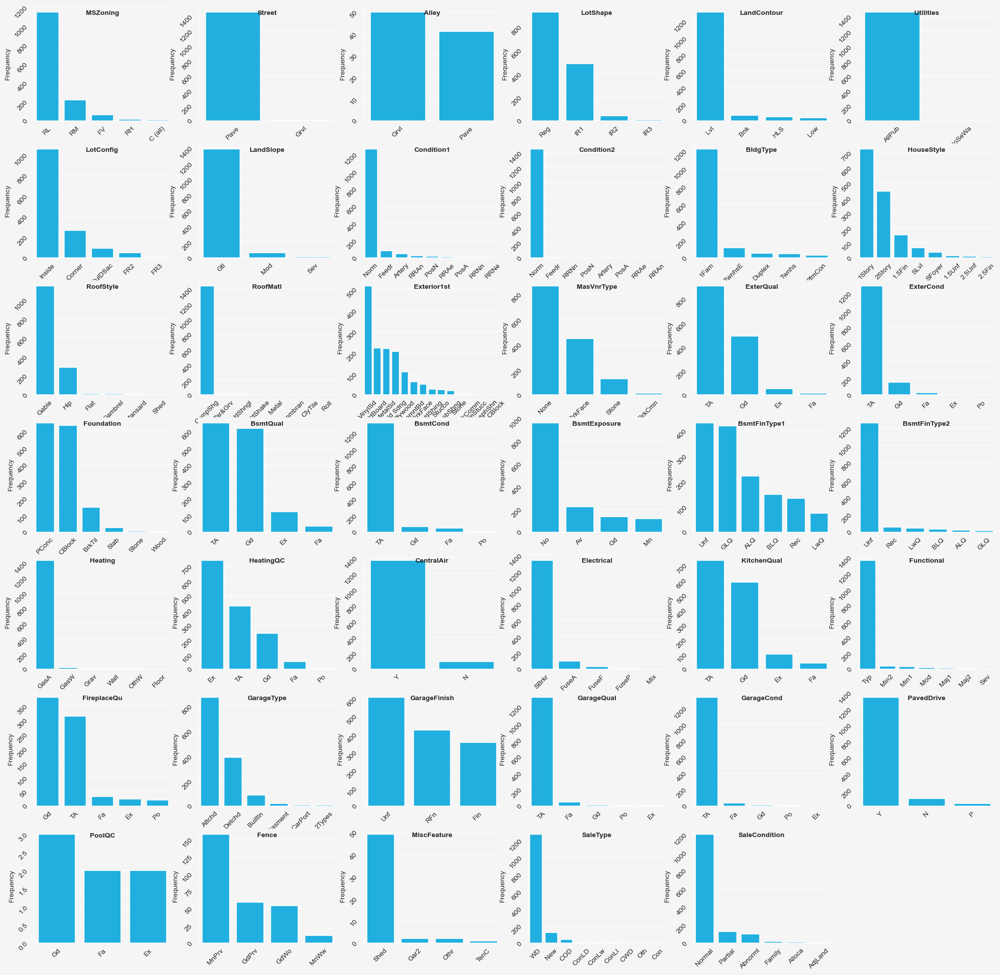

In [12]:
plot_cat_dist(train_da,object_cols,7,6,"deepskyblue",True,res)

**Intrepretation:**

- MSZoning. Based on a research, which states that housing in higher-density zones is expected to be lower priced than housing in low-density zones because of lower land costs, I think it's reasonable to assign unique number of ordering to these categories.
- LotShap. LotShape is categorized as regular, slightly irreugular, moderately irregular, and irregular. It is easily found that there is a logical ordering. So I decided to encode them as ordinal numbers.
- LandSlope. LandSlope has three categories, Gentle Slope, Moderate slope, and Severe Slope. There is an obvious ordering involved in the variable. So we can encoder it as ordinal categorical variable.
- ExternalQual & ExterCond. The variable evaluates the quality of exterior material from poor to excellent. So this is also an ordinal categorical variable.
- BsmtQual. Ex(excellent 100+inches) > Gd(Good 90-99inches) > TA(Typical 80-89inches) > FA(Fair 70-79inches) > Po(Poor <70inches)
- BsmCond. The variable means the condition of basement. The ordering of basement condition is Gd > Ta > Fa > Po.
- BsmtExposure. BsmtExposure refers to walkout or garden level walls and there is a logical sequence in these categories.
- BsmtFinType1 refers to rating of basement finished area. GLQ > ALQ > BLQ > Rec > LWQ > Unf > NA.
- HeatingQC. Excellent > Good > Average > Fair > Good.
- KitchenQual. The kitchen quality. Ex > Gd > Ta > Fa > Po.
- Functional. Home functionality and the ordering is Typ >  Min1 > Min2 > Mod > Maj1 > Maj2 > Sev > Sal.
- FireplaceQu. Fireplace Quality and the ordering is Ex > Gd > TA > Fa > Po > NA.
- GarageQual and GarageCond have the same logical sequence.
- PoolQC. Pool quality and the logical sequence is Ex > Gd > TA > Fa > Po > NA.
- Fence. Fence quality is mainly correlated with the degree of privacy. Fence with higher quality has good privacy. So the logical order is GdPrv (Good Privacy)>  MnPrv(Minimum Privacy) > GdWo > MnWw > NA.

**Summary:**

I will conduct ordinal encoding on all of these variables, and I also notice that some categorical variables have severely skewed distribution, meaning that there are some rare categories that can cause noises. They need to be specialy treated.

#### Discrete Variables.

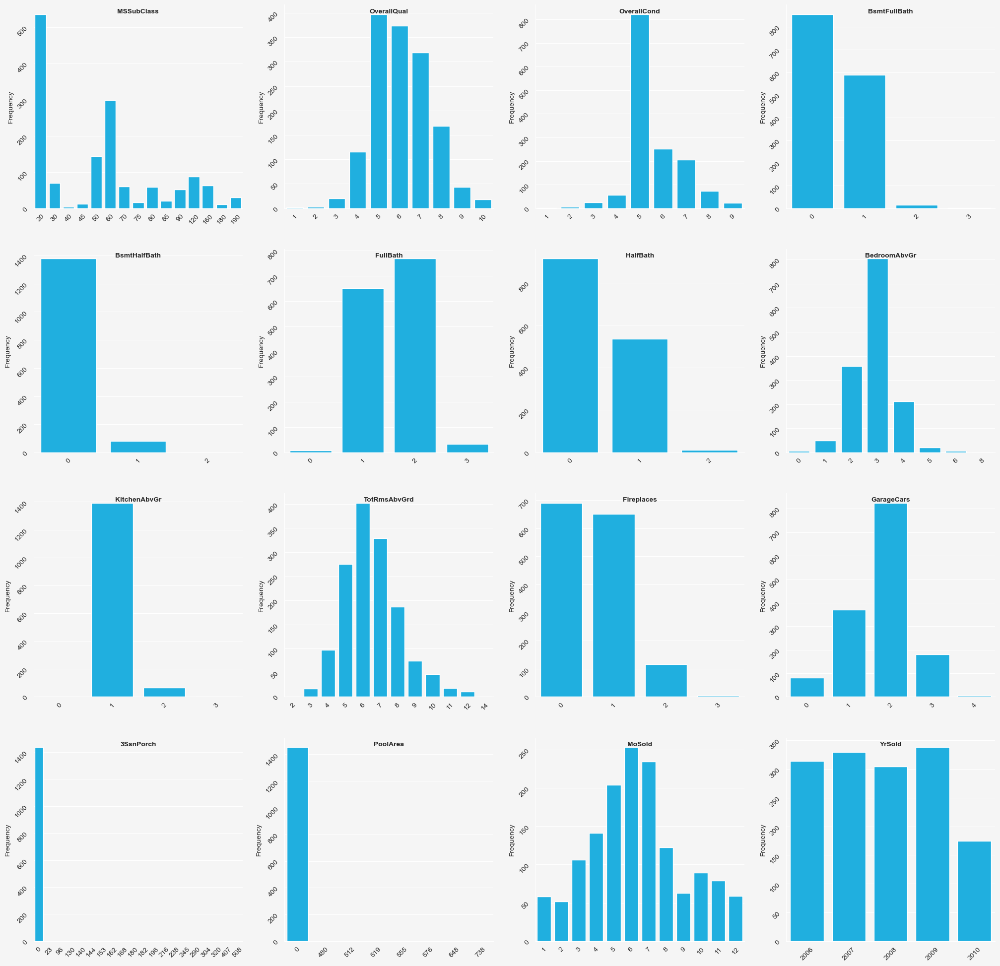

In [13]:
plot_cat_dist(train_da,discrete_cols,4,4,"deepskyblue",False)

**Interpretation:**

`3SsnPorch`, which is three season porch area in square feet, has majority of values centering aound 0 but just very few observations scattering over the other categories. The same pattern can be viewed in `PoolArea`. These categories are called rare categories. One way to deal with this is through *back-off method*, a simple technique that accumulates the counts of all rare categories in a special bin. If the count is greater than a certain threshold, then the category gets its own count statistics. Otherwise, we use the statistics from the back-off bin.

## Covariation between Variables

Now, I begin to inspect the relationships between variables so as to find out useful variables highly correlated with target variable. And my examination mainly focuses on two aspects:

- covariation between predictor and the target variable
- covariation between predictor variables

First, let's get a big picture of the relationships of continuous predictors with target variable.

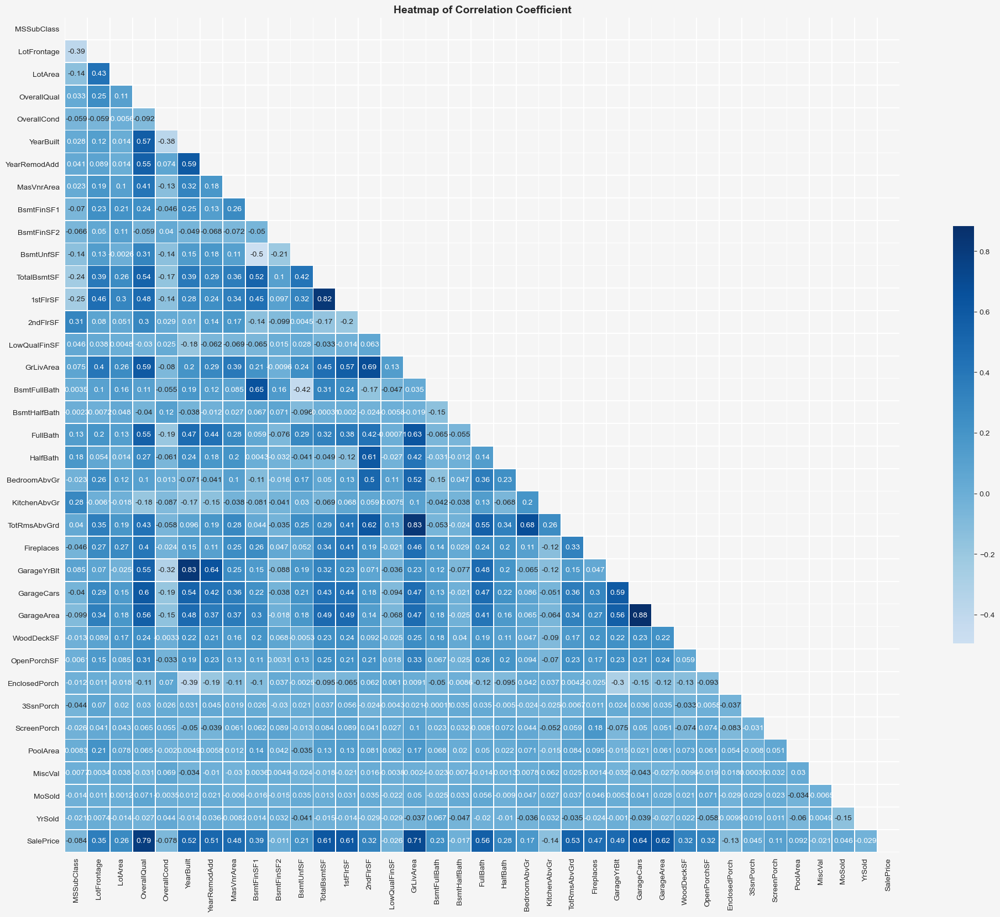

In [14]:
def corr_plot(data,cols):
    """plot the heatmap of correlation coefficients of variables"""
    # take a quick look at the relationship between variables
    corr_matrix = data[cols].corr()
    # Set up the matplotlib figure
    # Generate a mask for the upper triangle
    mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
    fig, ax = plt.subplots(figsize=(25, 20),dpi=100,facecolor="whitesmoke")
    sns.heatmap(corr_matrix,cmap="Blues",annot=True,mask=mask,ax=ax,center=0,square=True,linewidths=.5,cbar_kws={"shrink": .5})
    ax.set_facecolor("whitesmoke")
    ax.set_title("Heatmap of Correlation Coefficient",weight="bold",fontsize=14)
    plt.show()
    
    

corr_plot(train_da,numerical_cols)

**Interpretation:**

- The saleprice of houses is strongly correlated with the size of house. For example, total square feet of basement area and First Floor square feet have the same correlation coefficient, 0.61. Similarly, the Above grade (ground) living area square feet has 0.71 corrleaiton coefficient with the sale price of houses. 
- Also, `YearBuilt` and `YearRemodAdd` is also relatively, strongly correlated with sale price of houses. The fact that critical parts of the house, like plumbing, electrical, the roof, and appliances are recently remodeled and therefore less likely to break down, can generate savings for a buyer.
- The quality of houses, `OverallQual`, is also a good indicator for housing prices.
- There is collinearity between predictors.

$\color{crimson}{\bf{\text{Summary:}}}$

OverallQual, Living Area, GarageArea, and YearBuilt are strong determinants of housing price.

### Covariation between Continuous Predictors and Target Variable

Since the correlation matrix has revealed the strongl correlated variables, I first examine the relationship between these variables and sale price of houses.

#### Year variables

Year variables include `YearBuilt`, `YearSold`, and `YearRemodAdd`. The three variables determine the age of house. The remodelling year equals to the construction year for houses without any renovation, so the two variables are highly correlated. Also, we can know whether the house experienced any renovation in the past based on the equi-condition of the two variables. 

##### YearBuilt

First, I inspect the association between construction year and sale price and spot any outliers.

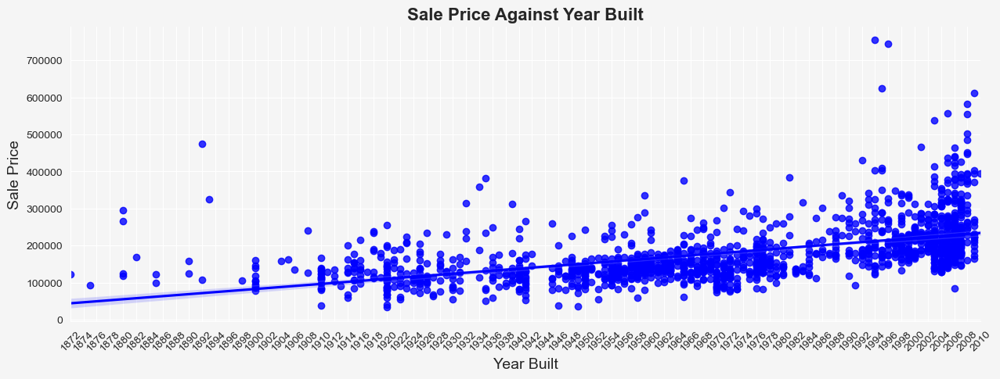

In [15]:
# Visualize the distribution of target variable
fig,ax = plt.subplots(1,1,figsize=(15,5),dpi=100,facecolor="whitesmoke")
sns.regplot(data=train_da,x="YearBuilt",y="SalePrice",color='blue',ax=ax)
ax.set_xlabel("Year Built",fontsize=14)
ax.set_ylabel("Sale Price",fontsize=14)
ax.set_title("Sale Price Against Year Built",fontsize=16,weight="bold")
ax.set_facecolor('whitesmoke')
ax.set_xticks(np.arange(train_da["YearBuilt"].min(),train_da["YearBuilt"].max()+1,2))
for spine in ["top","right"]:
    ax.spines[spine].set_visible(False)
plt.xticks(rotation=45)
plt.show()

**Interpretation:**

There is a strong, positive **non-linear** relationship between the construction Year of houses and sale price. From the figure, this is more like a three-degree of polynomial association. I did not notice any obvious outlier. The point built around 1891 and valued at almost $500K may be an outlier, but maybe the price is impacted by other attributes of the house and lead to the high price. 

In [16]:
# filter out built around 1892 and with higher than prie of 400000
attributes = ['OverallQual',"SalePrice","GrLivArea","GarageArea","TotalBsmtSF","HalfBath"]
train_da.query("YearBuilt==1892")[attributes]

,OverallQual,SalePrice,GrLivArea,GarageArea,TotalBsmtSF,HalfBath
185,10,475000,3608,840,1107,1
1292,5,107500,2372,432,994,0


There are only two houses build in 1892 and I list some important attributes associated with high sale price. By comparing the attributes, the extremely high price of house with index 185 is seemingly reasonable because of excellent quality and large area. So I will not drop the record.

***Note: it is dangerous to rashly delete any outlier we suspect***

Now, I decided to perform polynomial transformation to examine whether the transformation can better fit the data.

In [17]:
def plot_scatter(data,x,xlab,):
    """inspect the relationship between specified variable
        and sales price"""
    fig,ax = plt.subplots(1,1,figsize=(15,5),dpi=100,facecolor="whitesmoke")
    sns.regplot(data=data,x=x,y="SalePrice",color='blue',ax=ax)
    ax.set_xlabel(xlab,fontsize=14)
    ax.set_ylabel("Sale Price",fontsize=14)
    ax.set_facecolor('whitesmoke')
    for spine in ["top","right"]:
        ax.spines[spine].set_visible(False)

In [18]:
from sklearn.preprocessing import PolynomialFeatures

def RSS(f,x,y):
    """compute the residuals sum of squares"""
    return np.sum((f(x)-y)**2)


def poly_plot(data,specified_var,target_var,plot_x,degree,x_label):
    """perform poly transformation on the specified variable,
        compare RSS with RSS for the transformed variables,
        and plot the specified variable against target variable"""
    
    x = data[specified_var]
    y = data[target_var]
    # get the rss for non-poly transformation
    poly_coefs = np.polyfit(x,y,1)
    poly_func = np.poly1d(poly_coefs)
    rss1 = RSS(poly_func,x,y)
    print(f"RSS before Poly Transformation:{rss1}")
    # get the results of degree-3 polynomial transformation
    poly_coefs = np.polyfit(x,y,degree) # get the coefficients of degree-3 poly function
    poly_func = np.poly1d(poly_coefs)
    rss2 = RSS(poly_func,x,y)
    print(f"RSS after Poly Transformation:{rss2}")

    # compute the result of polynomial function
    poly_func = np.poly1d(poly_coefs)
    fig,ax = plt.subplots(1,1,figsize=(15,5),dpi=100,facecolor="whitesmoke")
    sns.scatterplot(x,y,alpha=0.5,color="blueviolet",ax=ax)
    sns.lineplot(plot_x,poly_func(plot_x),color="blue",linewidth=3)
    ax.set_facecolor("whitesmoke")
    ax.set_xlabel(x_label,fontsize=14)
    ax.set_ylabel("Sale Price",fontsize=14)
    for i in ["right","top"]:
        ax.spines[i].set_visible(False)
    plt.show()

RSS before Poly Transformation:6690269293939.837
RSS after Poly Transformation:5986710022611.861


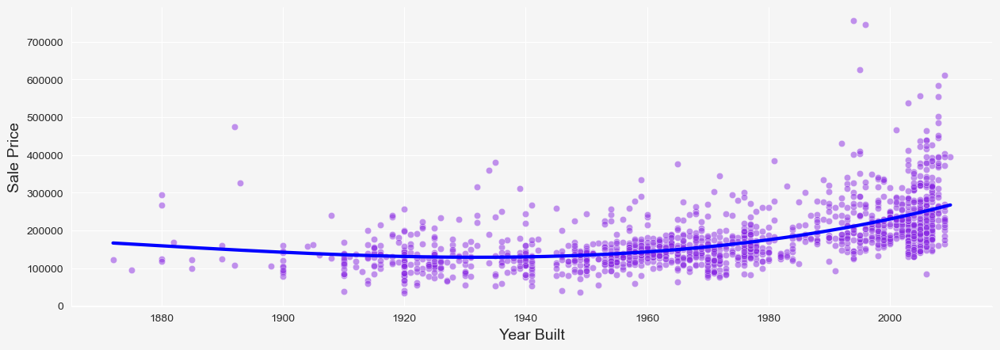

In [19]:
poly_plot(train_da,"YearBuilt","SalePrice",np.arange(1872,2011,1),
         3,"Year Built")

**Conclusion:**

The polynomial transformation indeed provides a better fit based on the smaller RSS and the fitted line that follows data points closer than before.

##### GarageYrBlt

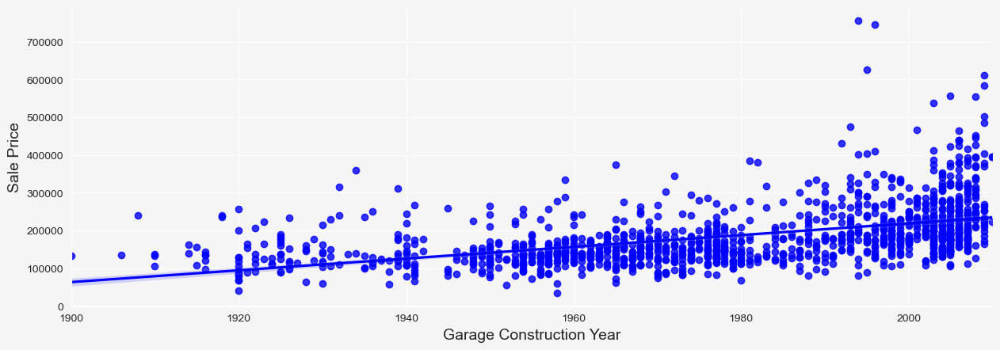

In [20]:
plot_scatter(train_da,"GarageYrBlt","Garage Construction Year")

##### YearRemodAdd

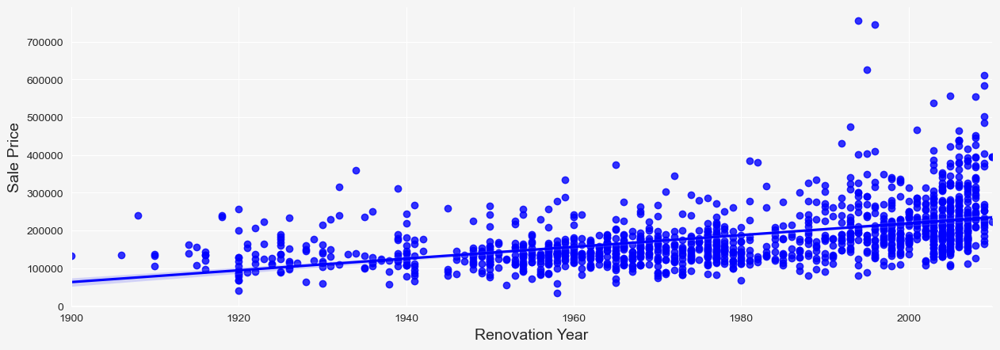

In [21]:
plot_scatter(train_da,"GarageYrBlt","Renovation Year")

**Interpretation:**

- No remarkable outliers can be found
- As expected, a house that is more valuable that is renovated more recently

##### Selling Variables

Although the correlation matrix shows insignificant correlation coefficient of YrSold, our common sense tells us that the house prices vary from year to year, meaning that the **prices might be impacted by the economic environment.** 

Also, I assume that the **housing price is also impacted by seasonability.** The two assumptions are reasonable in real world. Now let me verify the validity of the two assumptions.

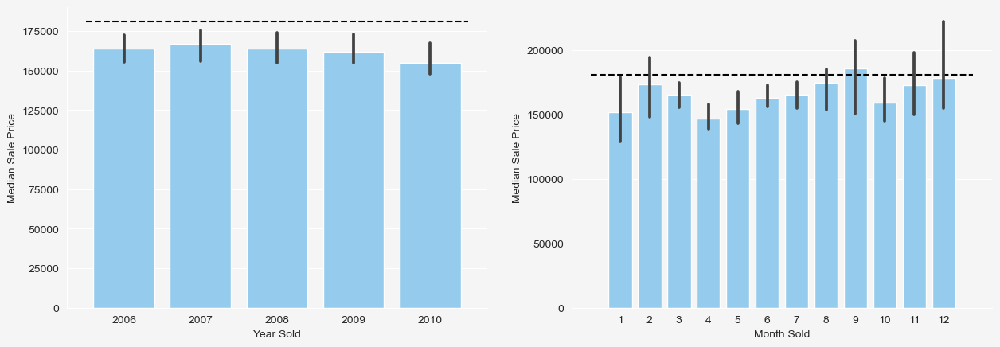

In [22]:
# compare median housing price across year
sns.set_style('darkgrid')
mean_house_price = train_da.SalePrice.mean()
fig,ax = plt.subplots(1,2,figsize=(15,5),dpi=100,facecolor="whitesmoke")
sns.barplot(data=train_da,x='YrSold',y="SalePrice",color='lightskyblue',estimator=np.median,ax=ax[0])
ax[0].hlines(y=mean_house_price,xmin=-0.5,xmax=4.5,colors="black",linewidth=1.5,linestyles="dashed")
ax[0].set_xlabel("Year Sold")
ax[0].set_ylabel("Median Sale Price")
ax[0].set_facecolor("whitesmoke")
for spine in ["top","right"]:
        ax[0].spines[spine].set_visible(False)


# draw bar plot for median housing prices across months
sns.barplot(data=train_da,x='MoSold',y="SalePrice",color='lightskyblue',estimator=np.median,ax=ax[1])
ax[1].hlines(y=mean_house_price,xmin=-1,xmax=12,colors="black",linewidth=1.5,linestyles="dashed")
ax[1].set_xlabel("Month Sold")
ax[1].set_ylabel("Median Sale Price")
ax[1].set_facecolor("whitesmoke")
for spine in ["top","right"]:
        ax[1].spines[spine].set_visible(False)

plt.show()

**Interpretation:**

The median housing price shows no significant difference in different years, but the seasonality can be observed in the right-hand bar chart. The housing price is higher in the period between February and March or in the period between July and September. I will keep it in mind that YrSold is not a good indicator of Housing price.

Another thing I notice is that the housing price does not show a monotomically incresing trend, so the number 12, which corresponds to December, will receive a higher weight than the number 9, which refers to September and has a higher median price. The higher weight does not make sense here. **So dummy variables should be a more robust representation of  these months.**

#### Quality Variables

- Total Quality of Houses
- Quality of Basement
- Kitchen Quality
- Fireplace Quality
- Fence Quality

##### Over Quality of House

The rating of overall quality ranges from 1 to 10, with 1 being the wrost and 10 being very excellent.

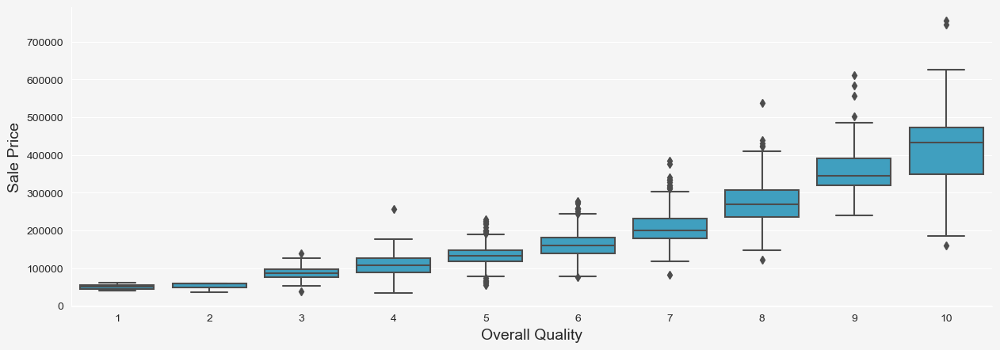

In [23]:
# Visualize the distribution of target variable
fig,ax = plt.subplots(1,1,figsize=(15,5),dpi=100,facecolor="whitesmoke")
sns.boxplot(data=train_da,x="OverallQual",y="SalePrice",color='deepskyblue',ax=ax,saturation=0.5)
ax.set_xlabel("Overall Quality",fontsize=14)
ax.set_ylabel("Sale Price",fontsize=14)
ax.set_facecolor('whitesmoke')
for spine in ["top","right"]:
    ax.spines[spine].set_visible(False)
plt.show()

**Interpretation:**

- A strong, positive curve can be easily identified in the plot, houses of higher quality has higher prices.
- One single point, which is rated at 4, may be an outlier. 

In [24]:
# filter out the hosue with quality of 4 and price higher than 200K
train_da.query("OverallQual==4 and SalePrice>200000")[attributes]

,OverallQual,SalePrice,GrLivArea,GarageArea,TotalBsmtSF,HalfBath
457,4,256000,1663,529,1364,0


When checking the other attributes of the house, the remarkable high price, compared with that of similar houses of overqual 4, seems to be not reasonable. I decided to remove the observation in data cleaning section.

#### Size Variables
- Total basement square footage
- First floor square footage
- Second floor square footage
- Above grade living area
- Garage area
- Pool area
- Porch area
- WoodDeckSF

The size variables mainly describe the area of a house, such as the kitchen area, garage area, and living area. The value of a home is roughly estimated in price per square foot — the sales price divided by the square footage of the home. So the bigger house should be more valuable.

##### Total Basement Square Frontage

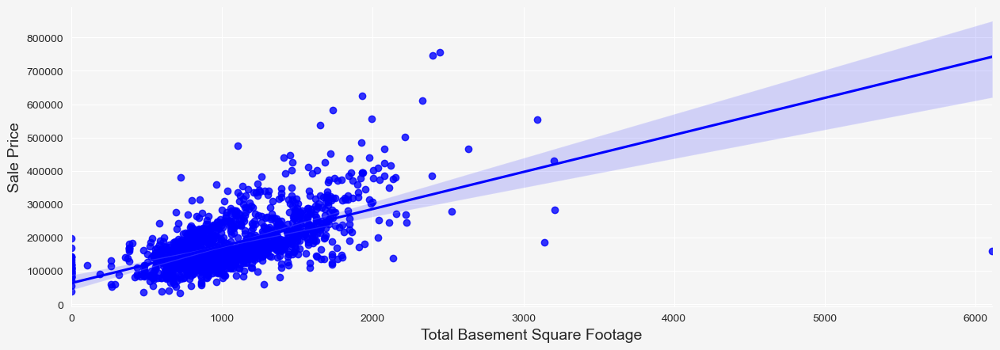

In [25]:
def plot_scatter(data,x,xlab):
    # Visualize the distribution of target variable
    fig,ax = plt.subplots(1,1,figsize=(15,5),dpi=100,facecolor="whitesmoke")
    sns.regplot(data=data,x=x,y="SalePrice",color='blue',ax=ax)
    ax.set_xlabel(xlab,fontsize=14)
    ax.set_ylabel("Sale Price",fontsize=14)
    ax.set_facecolor('whitesmoke')
    for spine in ["top","right"]:
        ax.spines[spine].set_visible(False)
    plt.show()
    
plot_scatter(train_da,"TotalBsmtSF","Total Basement Square Footage")

**Interpretation:**

TotalBsmtSF is obviously positively correlated with the sale price of houses, and so it can be a good indicator of housing price. The seeming outlier is probably the single point with higher than 6000 square footage but only priced less than 200000. We examine other attributes of the house to determine whether it is an anomaly.

In [26]:
train_da.query("TotalBsmtSF>6000")[attributes]

,OverallQual,SalePrice,GrLivArea,GarageArea,TotalBsmtSF,HalfBath
1298,10,160000,5642,1418,6110,1


These attributes strongly correlated with sale price all indicate that the house should be priced higher than the current price. I will consider the single point as an outlier.

##### First Floor Square Footage

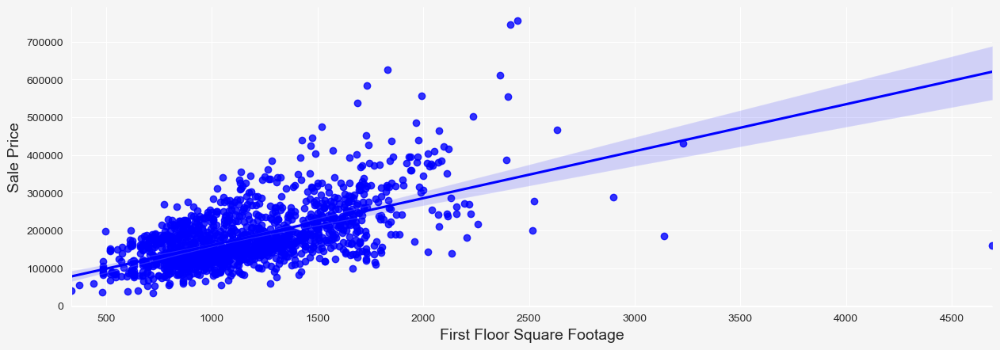

In [27]:
plot_scatter(train_da,"1stFlrSF","First Floor Square Footage")

**Interpretation:**

The same positive pattern can be discovered in the scatterplot, and I did not find any remarkable outlying observation here.

##### Above grade (ground) living area square feet

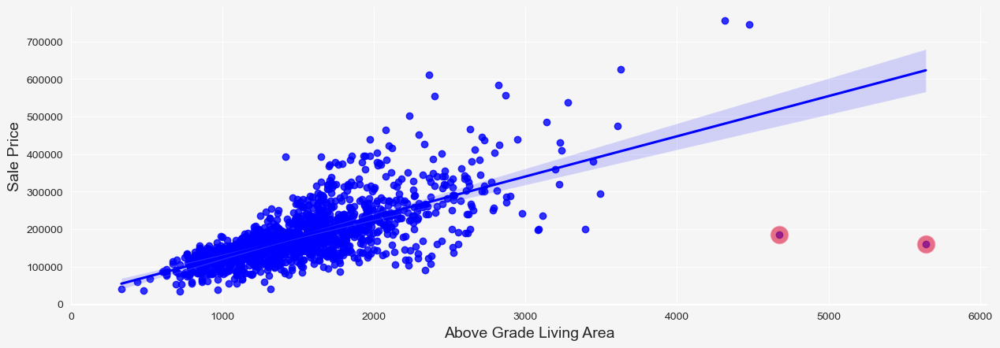

In [28]:
fig,ax = plt.subplots(1,1,figsize=(15,5),dpi=100,facecolor="whitesmoke")
outliers = train_da.query("GrLivArea>4000")[attributes].loc[[523,1298],:]
sns.regplot(data=train_da,x="GrLivArea",y="SalePrice",color='blue',ax=ax)
sns.scatterplot(data=outliers,x="GrLivArea",y="SalePrice",color='crimson',ax=ax,s=300,alpha=.6)
ax.set_xlabel("Above Grade Living Area",fontsize=14)
ax.set_ylabel("Sale Price",fontsize=14)
ax.set_facecolor('whitesmoke')
ax.set_xlim([0,6050])
for spine in ["top","right"]:
    ax.spines[spine].set_visible(False)
plt.show()

**Interpretation:**

The fitted line fits the data pretty well because the assciation between living area and Sale Price seems to be a strong, positive, and linear one, although there might be some remarkable outliers that can severly impact the fit.

Let's filter these outlying records out and examine whether the low price make sense.

In [29]:
train_da.query("GrLivArea>4000 and SalePrice<=200000")[attributes]

,OverallQual,SalePrice,GrLivArea,GarageArea,TotalBsmtSF,HalfBath
523,10,184750,4676,884,3138,1
1298,10,160000,5642,1418,6110,1


**Conclusion:**

These important determinants semmingly all indicate that the price does not make sense for $\color{crimson}{{\text{index 1299 and index 524.}}}$ **I will delete the two observations in Data Cleaning Section.**

##### Garage Area

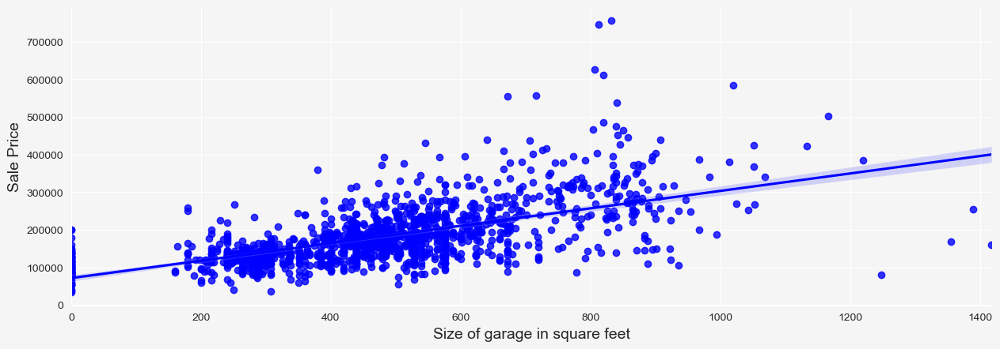

In [30]:
plot_scatter(train_da,"GarageArea","Size of garage in square feet")

**Conclusion:**

Greater size of garage enjoys higer price, and this makes sense in real life. I also did not find conspicuous outlying observations for the variable.

In [31]:
train_da.query("GarageArea>1200")[attributes]

,OverallQual,SalePrice,GrLivArea,GarageArea,TotalBsmtSF,HalfBath
581,8,253293,2042,1390,2042,1
825,10,385000,2084,1220,2078,0
1061,3,81000,894,1248,894,0
1190,4,168000,1622,1356,1249,0
1298,10,160000,5642,1418,6110,1


The low quality and old age can explain the low price of these houses.

##### Second Floor Square Foot

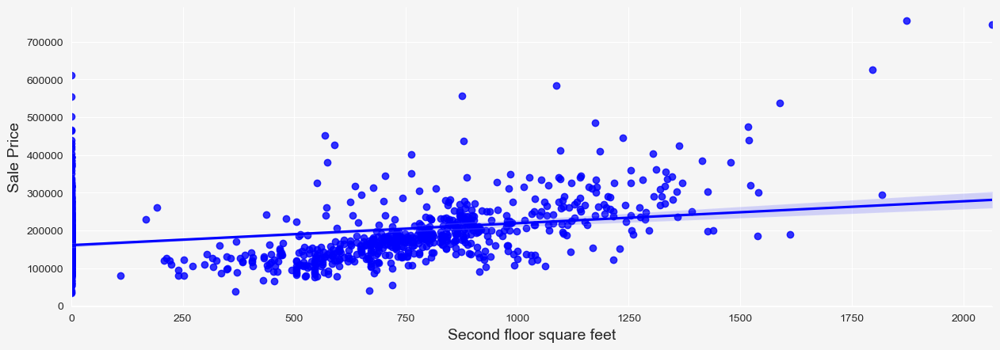

In [32]:
 plot_scatter(train_da,"2ndFlrSF","Second floor square feet")

**Interpretation:**

There are a number of hosues that does not have the second floor. Also the fitted line is not a good fit of the dataset, meaning that there is a non-linear relationship between `2ndFlrSF` and `SalePrice`.

Now, let raise the variable to a power of 2 and examine the decrease in RSS.

RSS before Poly Transformation:8268943069353.344
RSS after Poly Transformation:6905677798862.469


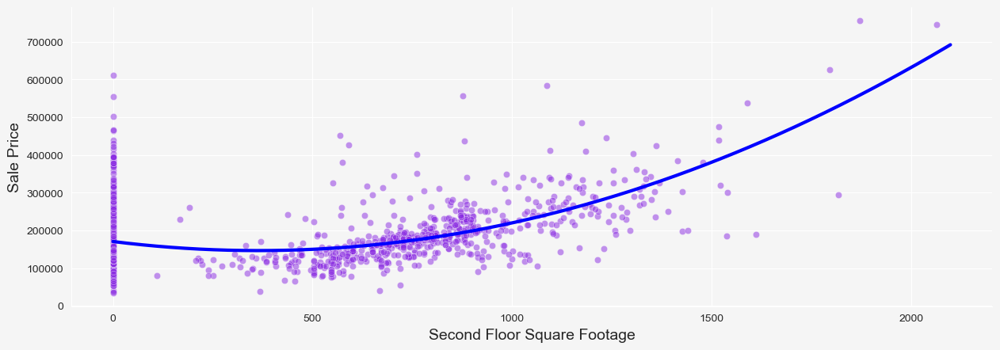

In [33]:
poly_plot(train_da,"2ndFlrSF","SalePrice",np.arange(0,2100,1),
         2,"Second Floor Square Footage")

The polynomial regression obviously fit the data points better than normal linear regression. Given that the degree-3 polynomial transformation does not lead to a remarkable reduction in RSS, so degree of 2 is a good choice.

##### Pool area

Not every house has pool, so I think just a small proportion of houses have pool. Let's first examine the association between poor area and sale price.

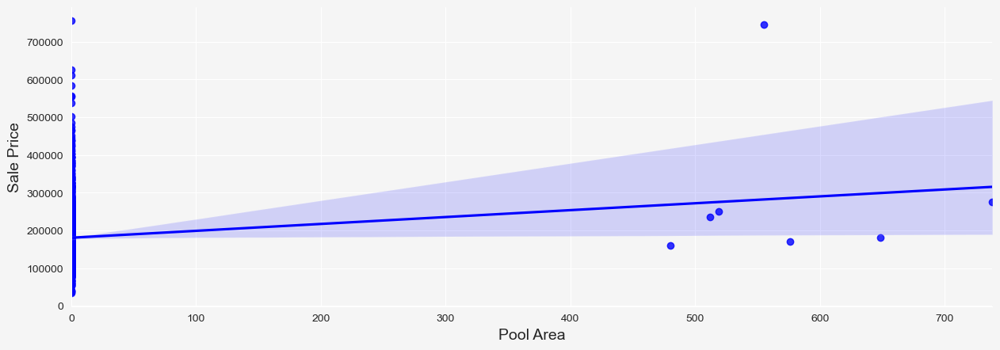

In [34]:
plot_scatter(train_da,'PoolArea',"Pool Area")

**Interpretation:**

Just to my expectation, only very few houses have pool. In the case, it is not reasonable to represent the variable in the form of being continuous. Instead, I will convert the variable to a binary variable to indicate whether the house has a pool.

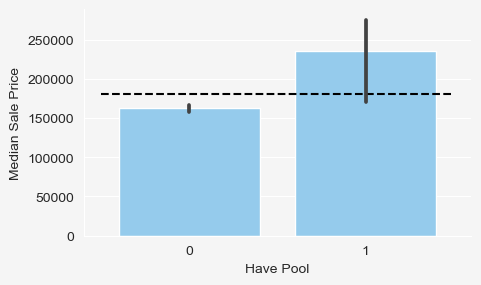

In [35]:
# create a variables HavePool
train_da["HavePool"] = (train_da.PoolArea>0).astype("int")
test_da["HavePool"] = (test_da.PoolArea>0).astype("int")

# visualize
sns.set_style('darkgrid')
fig,ax = plt.subplots(1,1,figsize=(5,3),dpi=100,facecolor="whitesmoke")
sns.barplot(data=train_da,x='HavePool',y="SalePrice",color='lightskyblue',estimator=np.median)
ax.hlines(y=mean_house_price,xmin=-0.5,xmax=1.5,colors="black",linewidth=1.5,linestyles="dashed")
ax.set_xlabel("Have Pool")
ax.set_ylabel("Median Sale Price")
ax.set_facecolor("whitesmoke")
#ax.set_xticklabels(["Not Completely New","Completely New"])
for spine in ["top","right"]:
        ax.spines[spine].set_visible(False)
plt.show()

Apparently, the house having a pool is much more valuable.

##### Porch Area

**What is a porch?**

A Porch is a structure extended from the main structure to form a shelter cover that is attached to the front entrance of the building or house. 

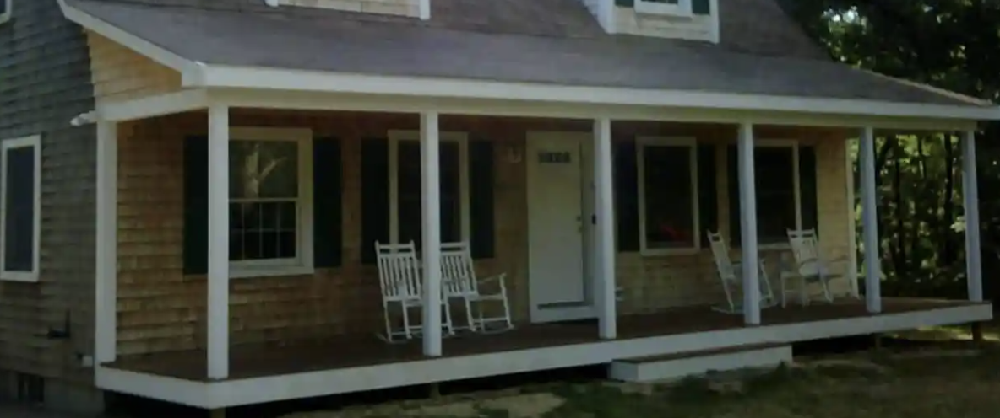

In [36]:
# have a look at the columns with Porch
porches = train_da.columns[train_da.columns.str.contains("Porch")].tolist()+["WoodDeckSF"]
train_da[porches].head(5)

,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,WoodDeckSF
0,61,0,0,0,0
1,0,0,0,0,298
2,42,0,0,0,0
3,35,272,0,0,0
4,84,0,0,0,192


Each house may  have only one or more than one of the four kinds of porch. Some houses have both the porch and deck, which is a type of porch outside the hosue. We can combine them together into one variable indicating the square footage of a house. **By doing this, I want to create a more powerful variable to indicate the area of porch.**

Correlation Coefficient:0.196


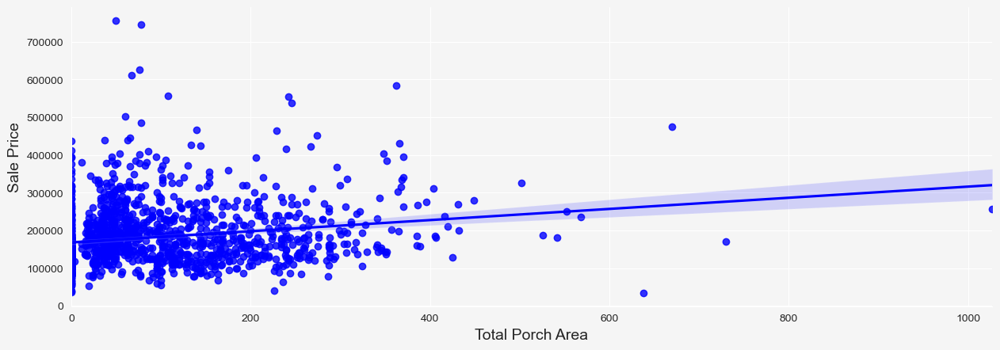

In [37]:
# create the variable Total Porch Area
train_da['TotalPorchSF'] = train_da.OpenPorchSF + train_da.EnclosedPorch + \
train_da["3SsnPorch"] + train_da.ScreenPorch
test_da['TotalPorchSF'] = test_da.OpenPorchSF + test_da.EnclosedPorch + \
test_da["3SsnPorch"] + test_da.ScreenPorch

# examine its association with sale price
coef = train_da["TotalPorchSF"].corr(train_da["SalePrice"])
print(f"Correlation Coefficient:{round(coef,3)}")
plot_scatter(train_da,"TotalPorchSF","Total Porch Area")

**Interpretation:**

The relationship between TotalPorchArea and SalePrice is not very strong, even if we combine them together.

**WoodenDeck**

Correlation Coefficient:0.324


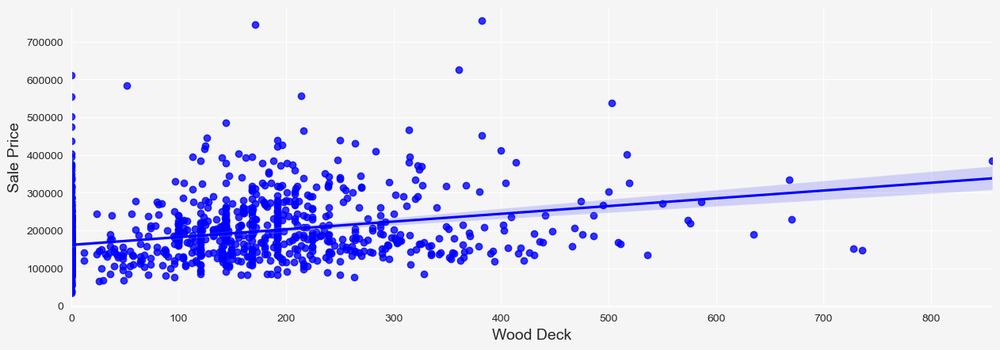

In [38]:
# examine its association with sale price
coef = train_da["WoodDeckSF"].corr(train_da["SalePrice"])
print(f"Correlation Coefficient:{round(coef,3)}")
plot_scatter(train_da,"WoodDeckSF","Wood Deck")

**Interpretation:**

There is positive, relatively strong relationshio between wooddeck and saleprice: larger area of wood deck can increase the housing price.

##### Lot Area

>To put it simply, a floor area is the size of the indoors area (inside the building walls) and the lot area is the whole size of the lot, i.e. including the yard up to the boundaries of the lot. 



Correlation Coefficient:0.264


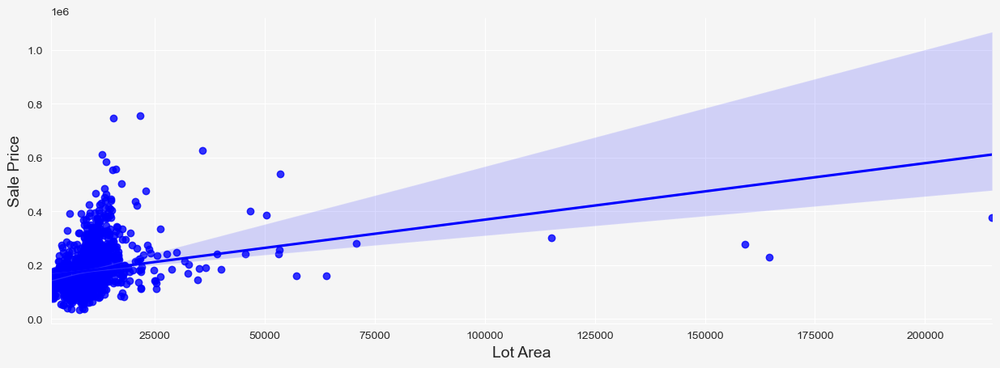

In [39]:
coef = train_da["LotArea"].corr(train_da["SalePrice"])
print(f"Correlation Coefficient:{round(coef,3)}")
plot_scatter(train_da,"LotArea","Lot Area")

**Interpretation:**

there is a weak positive association between Lot Area and SalePrice. The association is severly impacted by outliers with extremely huge size of lot.

Let's try log transformation on LotArea and inspect the association again.

Correlation Coefficient:0.389


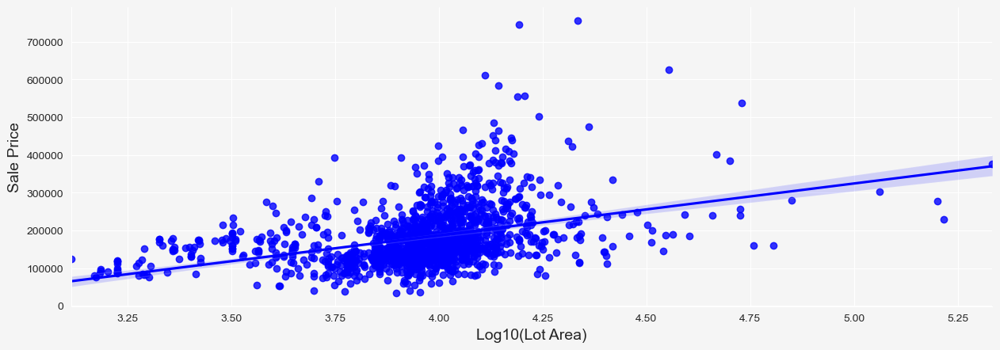

In [40]:
train_da['LogLotArea'] = np.log10(train_da["LotArea"])
coef = train_da["LogLotArea"].corr(train_da["SalePrice"])
print(f"Correlation Coefficient:{round(coef,3)}")
plot_scatter(train_da,"LogLotArea","Log10(Lot Area)")

Apparently, the fitted line is better than before because the log transformation expands the range of small values but compresses the range of large values. The larger x gets smaller increments of $\log{(x)}$.

#### MiscVal

Value of miscellaneous feature

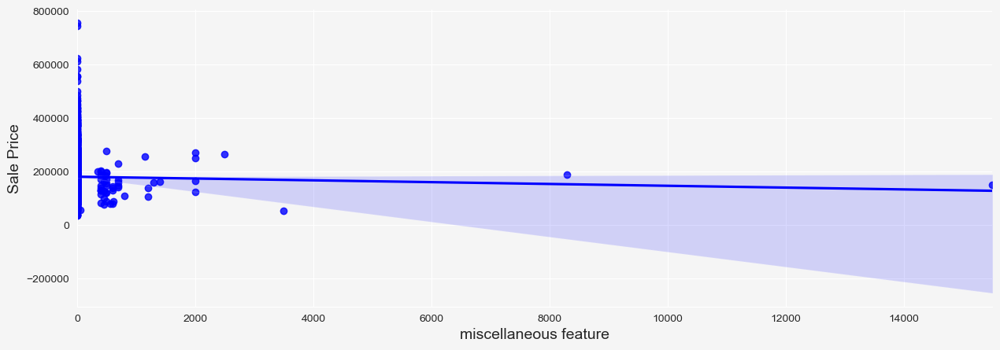

In [41]:
plot_scatter(train_da,"MiscVal","miscellaneous feature")

A considerbale number of observations do not have miscellaneous features. There is no obvious pattern, so I will just exclude the variable.

In [42]:
train_da.drop("MiscVal",axis=1,inplace=True)
test_da.drop("MiscVal",axis=1,inplace=True)

In [43]:
# drop the newly added variable because I will add it in feature engineering section
train_da.drop("LogLotArea",axis=1,inplace=True)

### Covariation between Categorical Predictors and Target Variable

Since there are a considerable number of categorical variables, I decided to first use Chi2sq to select the feaures with high chi-square, providing me with direction of analysis. I first examine these variables and then other similar ones.

In [44]:
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import SelectKBest,chi2

X = train_da[object_cols]
y = train_da.SalePrice
imputer = SimpleImputer(strategy="most_frequent")
X_imputed = imputer.fit_transform(X)
encoder = LabelEncoder()
X_encoded = pd.DataFrame(X_imputed,columns=X.columns).apply(lambda col:encoder.fit_transform(col))
selector = SelectKBest(chi2,20)
X_selected = selector.fit_transform(X_encoded,y)
X.columns[selector.get_support()]

Index(['Alley', 'LotShape', 'Utilities', 'LotConfig', 'LandSlope',
       'Neighborhood', 'BldgType', 'HouseStyle', 'RoofStyle', 'Exterior1st',
       'Exterior2nd', 'Foundation', 'BsmtQual', 'BsmtExposure', 'BsmtFinType1',
       'HeatingQC', 'KitchenQual', 'FireplaceQu', 'GarageType',
       'GarageFinish'],
      dtype='object')

**Interpretation:**

The top three important variables are all about quality, followed by Neighborhood. I decided to examine the top 20 categorical variables.

In [45]:
# write a function to check the relation between cat variable and target;
# then inspect the distribution of the cat variable
def plot_cat_relation_cnt(data,var,xlab,box=True,**kwargs):
    """plot the median housing price within each cat of categorical variales
        and compare it with median price across all houses"""
    
    # create one figure and two axes
    fig,ax = plt.subplots(1,2,figsize=(15,5),dpi=100,facecolor="whitesmoke")
    # calculate the maximum length for the horizontal line
    max_len = data[var].nunique()-0.5
    
    if box:
        # visualize
        sns.set_style('darkgrid')
    
        plots_x = sns.boxplot(data=data,x=var,y="SalePrice",color='deepskyblue',ax=ax[0],**kwargs)
        ax[0].hlines(y=mean_house_price,xmin=-0.5,xmax=max_len,colors="crimson",linewidth=1.5,linestyles="dashed")
        ax[0].set_xlabel(xlab)
        ax[0].set_ylabel("Median Sale Price")
        ax[0].set_facecolor("whitesmoke")
        #ax.set_xticklabels(["Not Completely New","Completely New"])
        for spine in ["top","right"]:
                ax[0].spines[spine].set_visible(False)
        if data[var].nunique()>=10:
            ax[0].set_xticklabels(plots_x.get_xticklabels(),rotation=45)
    else:
        sns.set_style('darkgrid')
        plots_x = sns.barplot(data=data,x=var,y="SalePrice",color='deepskyblue',estimator=np.median,ax=ax[0],**kwargs)
        ax[0].hlines(y=mean_house_price,xmin=-0.5,xmax=max_len,colors="crimson",linewidth=1.5,linestyles="dashed")
        ax[0].set_xlabel(xlab)
        ax[0].set_ylabel("Median Sale Price")
        ax[0].set_facecolor("whitesmoke")
        #ax.set_xticklabels(["Not Completely New","Completely New"])
        for spine in ["top","right"]:
                ax[0].spines[spine].set_visible(False)
        if data[var].nunique()>=10:
            ax[0].set_xticklabels(plots_x.get_xticklabels(),rotation=45)
    
    # examine the distribution of the variable
    temp = data[var].value_counts().reset_index().rename(columns={'index':var,var:"Frequency"})
    plots = sns.barplot(data=temp,x=var,y="Frequency",color='lightskyblue')
    # Iterrating over the bars one-by-one
    for bar in plots.patches:

      # Using Matplotlib's annotate function and
      # passing the coordinates where the annotation shall be done
      # x-coordinate: bar.get_x() + bar.get_width() / 2
      # y-coordinate: bar.get_height()
      # free space to be left to make graph pleasing: (0, 8)
      # ha and va stand for the horizontal and vertical alignment
        plots.annotate(format(bar.get_height(), '.0f'),
                       (bar.get_x() + bar.get_width() / 2,
                        bar.get_height()), ha='center', va='center',
                       size=12, xytext=(0, 8),
                       textcoords='offset points')

    ax[1].set_xlabel(xlab)
    ax[1].set_ylabel("Frequency")
    ax[1].set_facecolor("whitesmoke")
    ax[1].set_facecolor("whitesmoke")
    for spine in ["top","right"]:
        ax[1].spines[spine].set_visible(False)
    
    # rotate the x ticks labels when there are more than 10 categories
    if data[var].nunique()>=10:
            ax[1].set_xticklabels(plots.get_xticklabels(),rotation=45)
    plt.show()

#### Lot Variables

- LotShape
- LotCongfig


##### LotShape

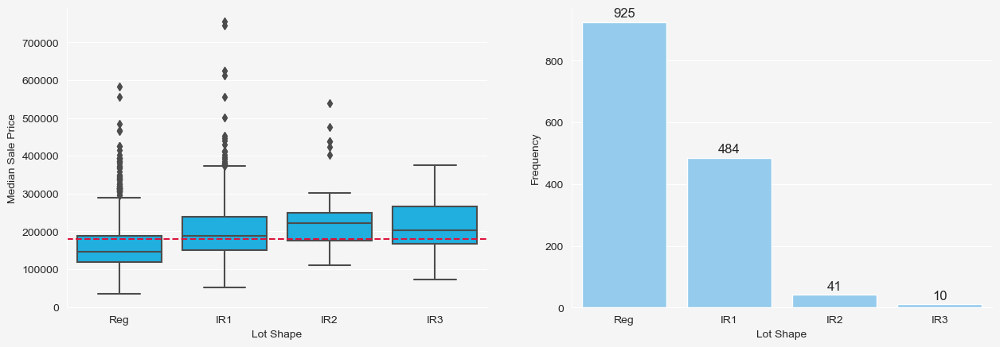

In [46]:
plot_cat_relation_cnt(train_da,"LotShape","Lot Shape",True)

**Interpretation:**

Basically, more irregular houses enjoy higher prices, indicating that there is a positive association between the degree of being irregular and sale prices.

##### Lot Configuration

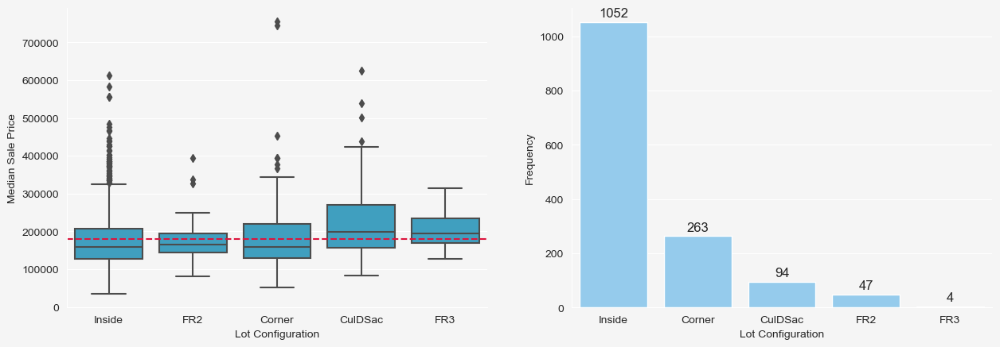

In [47]:
plot_cat_relation_cnt(train_da,"LotConfig","Lot Configuration",saturation=0.5)

**Intrepretation:**

The two types of configuration of `Cul-de-sac` and `frontage on 3 sides of property` have the above-median house prices, while the median price of other three types are very close to the median level of all houses. I will perform one-hot encoding on the the variable to include them in regression model.

In addition, FR3 does not have enough samples. It should be deleted.

#### Geographical Variables

- Alley
- Neighborhood
- Street
- PavedDrived
- Mszoning

##### Alley

- *Grvl* Gravel
- *Pave* Paved
- *NA* No alley access

The missing values in Alley variable means there is no alley access. 

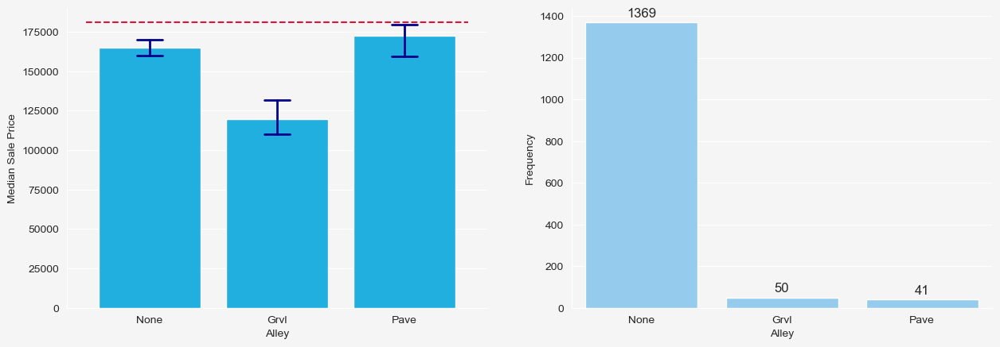

In [48]:
# convert the missing values into NA
train_da["Alley"] = np.where(train_da["Alley"].isnull(),"None",train_da["Alley"])
test_da["Alley"] = np.where(test_da["Alley"].isnull(),"None",test_da["Alley"])
# then examine the distribution of the alley vairable
plot_cat_relation_cnt(train_da,"Alley","Alley",False,errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

Paved road is more valuable than gravel road, but hosues without alley access are surprisingly more expensive than houses with gravel road. Since there is no ordinal ordering, I will not encode them as ordinal numbers.

##### Neighborhood

- Blmngtn	Bloomington Heights
- Blueste	Bluestem
- BrDale	Briardale
- BrkSide	Brookside
- ClearCr	Clear Creek
- CollgCr	College Creek
- Crawfor	Crawford
- Edwards	Edwards
- Gilbert	Gilbert
- IDOTRR	Iowa DOT and Rail Road
- MeadowV	Meadow Village
- Mitchel	Mitchell
- Names	North Ames
- NoRidge	Northridge
- NPkVill	Northpark Villa
- NridgHt	Northridge Heights
- NWAmes	Northwest Ames
- OldTown	Old Town
- SWISU	South & West of Iowa State University
- Sawyer	Sawyer
- SawyerW	Sawyer West
- Somerst	Somerset
- StoneBr	Stone Brook
- Timber	Timberland
- Veenker	Veenker

There are 25 categories of neighborhood, so we need to engineer the variable to compress the number of categories.

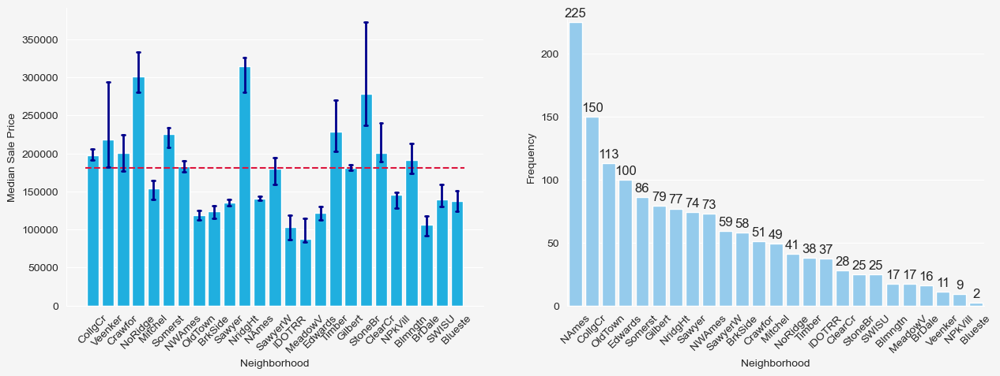

In [49]:
# first examine the difference of housing price in different neighborhoods
plot_cat_relation_cnt(train_da,"Neighborhood","Neighborhood",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Intrepretation:**

- No ordinality exists in the variable
- The housing price varies from neighborhood to neighborhood
- Non-overlapping error bars tell us that the difference is significant
- Juse a few houses correspond to the categories of last three categories, which are all below 15. I will **accumulates the counts of all rare categories in a special bin.**
- The majority of houses are the top three classes.

##### Street

**Type of road access to property:**
- Grvl: Gravel	
- Pave: Paved

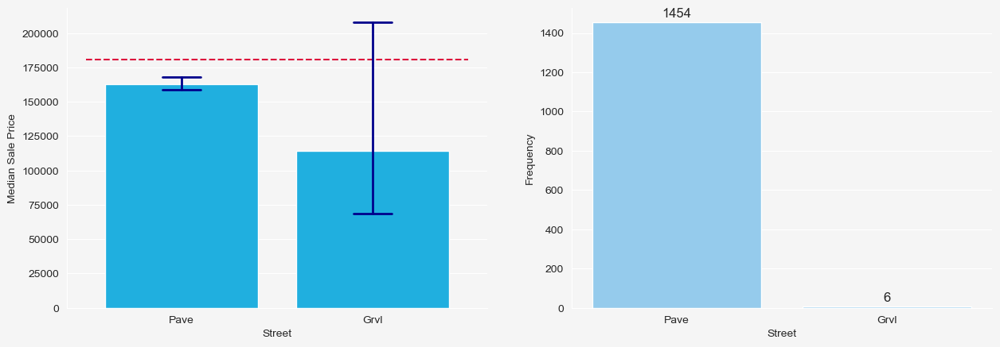

In [50]:
# first examine the difference of housing price in different neighborhoods
plot_cat_relation_cnt(train_da,"Street","Street",False,errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

A house with paved access road is more valuable than one with gravel road. This makes sense in real world. So I will ordinally encode the variable.

##### PavedDrive

**Paved Driveway:**
- Y	Paved 
- P 	Partial Pavement
- N	Dirt/Gravel

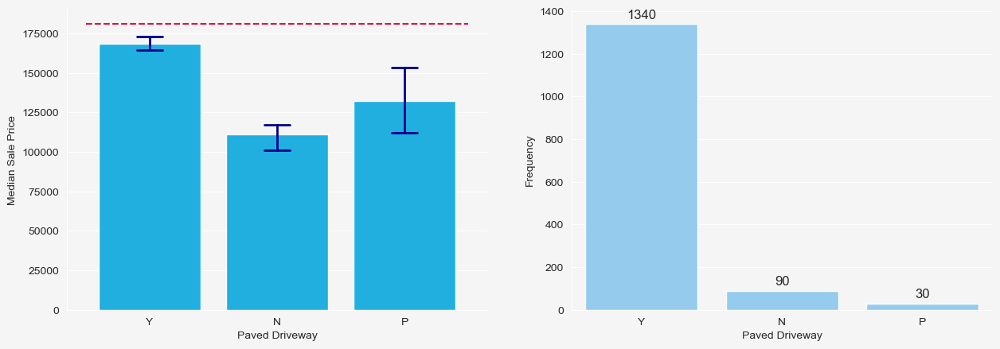

In [51]:
plot_cat_relation_cnt(train_da,"PavedDrive","Paved Driveway",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

Better paved road can increase the price of house. We should perform ordinal encoding on the variable.

##### Mszoning

**Identifies the general zoning classification of the sale:**
- A: Agriculture
- C: Commercial
- FV: Floating Village Residential
- I: Industrial
- RH: Residential High Density
- RL: Residential Low Density
- RP: Residential Low Density Park 
- RM: Residential Medium Density

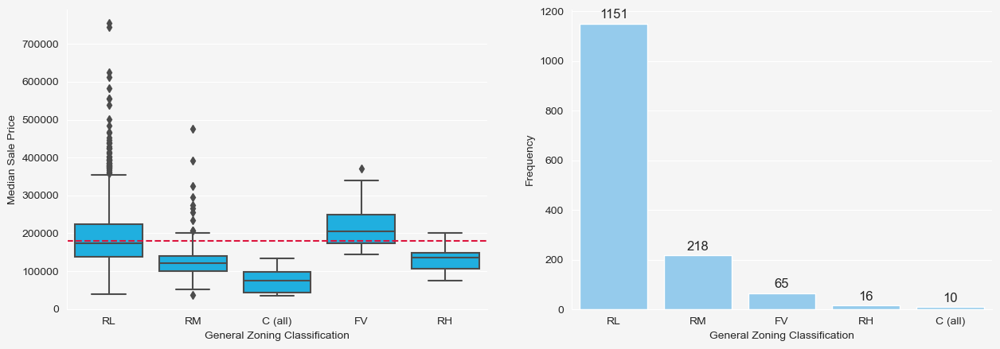

In [52]:
# first examine the difference of housing price in different neighborhoods
plot_cat_relation_cnt(train_da,"MSZoning","General Zoning Classification",True)

**Interpretation:**

No ordinality can be found in this variable, so just convert the variable into several dummy variables.

#### Housing Style Variables

- MSSubClass
- BldgType
- HouseStyle

##### MSSubClass

**Identifies the type of dwelling involved in the sale:**
- 20: 1-STORY 1946 & NEWER ALL STYLES
- 30: 1-STORY 1945 & OLDER
- 40: 1-STORY W/FINISHED ATTIC ALL AGES
- 45: 1-1/2 STORY - UNFINISHED ALL AGES
- 50: 1-1/2 STORY FINISHED ALL AGES
- 60: 2-STORY 1946 & NEWER
- 70: 2-STORY 1945 & OLDER
- 75: 2-1/2 STORY ALL AGES
- 80: SPLIT OR MULTI-LEVEL
- 85: SPLIT FOYER
- 90: DUPLEX - ALL STYLES AND AGES
- 120: 1-STORY PUD (Planned Unit Development) - 1946 & NEWER
- 150: 1-1/2 STORY PUD - ALL AGES
- 160: 2-STORY PUD - 1946 & NEWER
- 180: PUD - MULTILEVEL - INCL SPLIT LEV/FOYER
- 190: 2 FAMILY CONVERSION - ALL STYLES AND AGES

We should understand these numbers as **different categories**, although these types of dwelling are encoded as numerical values.

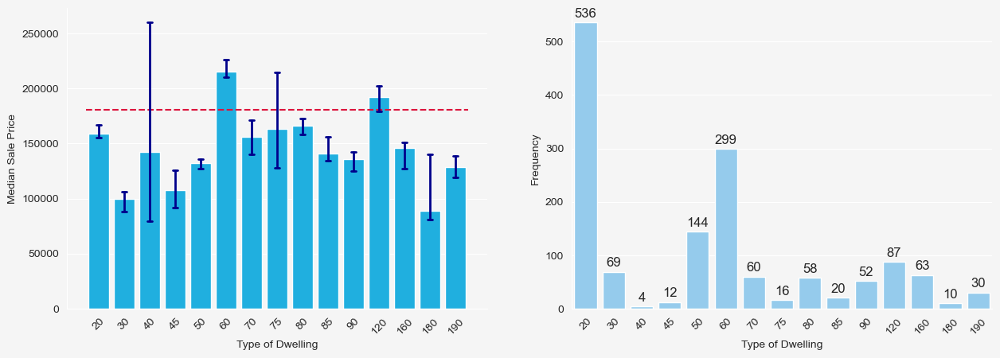

In [53]:
plot_cat_relation_cnt(train_da,'MSSubClass',"Type of Dwelling",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

There is no ordinality, and some categories have very small sample size, such as 40,45, and 180.

##### BldgType

- 1Fam	Single-family Detached	
- 2FmCon	Two-family Conversion; originally built as one-family dwelling
- Duplx	Duplex
- TwnhsE	Townhouse End Unit
- TwnhsI	Townhouse Inside Unit

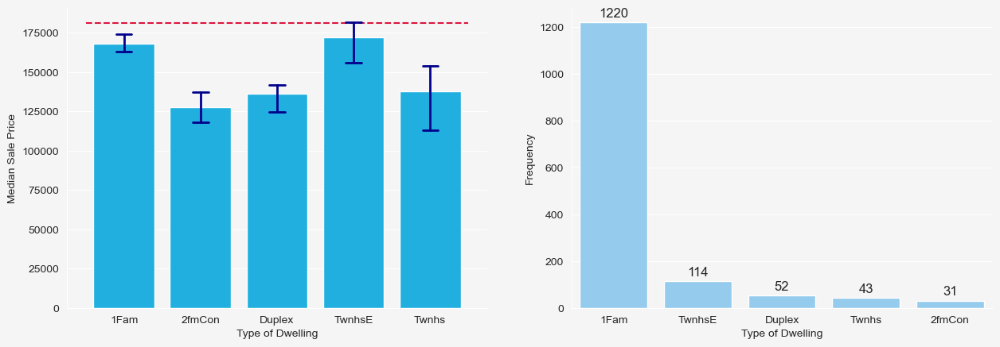

In [54]:
plot_cat_relation_cnt(train_da,"BldgType","Type of Dwelling",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Intrepretation:**

No ordinality exists in the variable, and housing price does differ significantly in some categories. I will add dummy variables for these categories.

##### HouseStyle

- 1Story	One story
- 1.5Fin	One and one-half story: 2nd level finished
- 1.5Unf	One and one-half story: 2nd level unfinished
- 2Story	Two story
- 2.5Fin	Two and one-half story: 2nd level finished
- 2.5Unf	Two and one-half story: 2nd level unfinished
- SFoyer	Split Foyer
- SLvl	Split Level

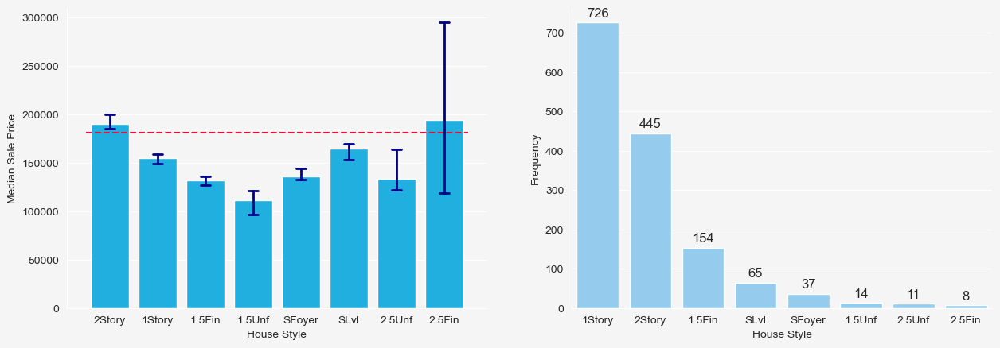

In [55]:
plot_cat_relation_cnt(train_da,"HouseStyle","House Style",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

- There is no logical sequence in the categories, so I will convert it into dummy variables.
- 2.5Unf and 2.5Fin will be collected in one category because of their small sample size.

#### Roof Variables

- RoofStyle
    - Flat
    - Gable
    - Gambrel	Gabrel (Barn)
    - Hip
    - Mansard
    - Shed
- RoofMat1
    - ClyTile	Clay or Tile
    - CompShg	Standard (Composite) Shingle
    - Membran
    - Metal
    - Roll
    - Tar&Grv	Gravel & Tar
    - WdShake	Wood Shakes
    - WdShngl	Wood Shingles

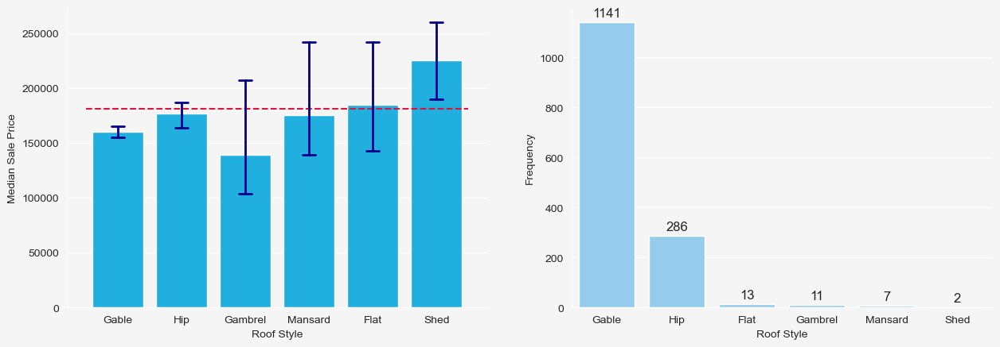

In [56]:
plot_cat_relation_cnt(train_da,'RoofStyle','Roof Style',False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Intrepretation:**

- No ordinality can be found in the variable
- There are four categories that have less than 15 observations. I will accummlate such categories in one special bin because the small sample size is not enough to reliable estimate the housing price for the particular category.

#### Exterior Variables

- ExterQual: Evaluates the quality of the material on the exterior 
- ExterCond: Evaluates the present condition of the material on the exterior
- Exterior1st: Exterior covering on house
- Exterior2nd: Exterior covering on house (if more than one material)

The covering categories are completely same for the two types of exterial covering.

##### ExterQual

- Ex	Excellent
- Gd	Good
- TA	Average/Typical
- Fa	Fair
- Po	Poor

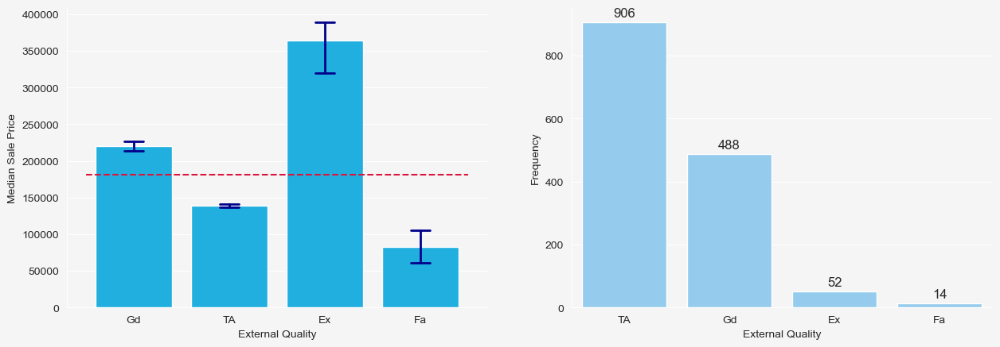

In [57]:
plot_cat_relation_cnt(train_da,"ExterQual","External Quality",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

This is an ordinal variable. So I need to ordinally encode it.

##### ExterCond

- Ex	Excellent
- Gd	Good
- TA	Average/Typical
- Fa	Fair
- Po	Poor

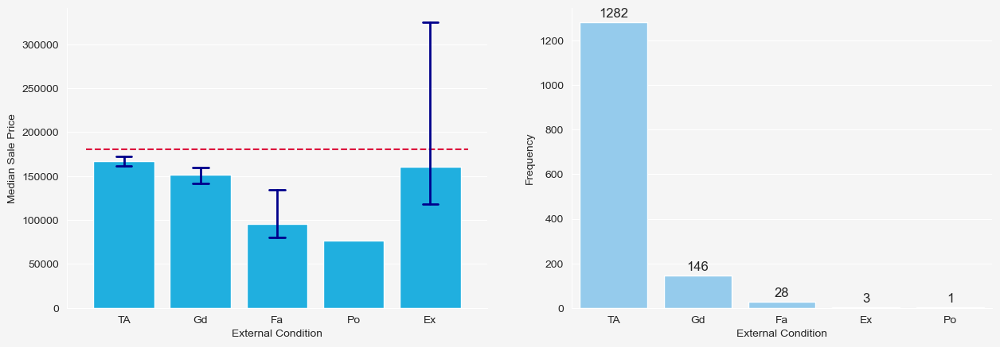

In [58]:
plot_cat_relation_cnt(train_da,"ExterCond","External Condition",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

The categories are ordinal. Given the small sample size of Ex, I will drop it.

##### Exterior1st & Exterior2nd

In [59]:
# look at the data
(train_da["Exterior1st"] == train_da['Exterior2nd']).head()

0     True
1     True
2     True
3    False
4     True
dtype: bool

It seems like that the first floor has the exactly same type as the second floor in terms of exterior covering.

In [60]:
(train_da["Exterior1st"] == train_da['Exterior2nd']).value_counts()

True     1245
False     215
dtype: int64

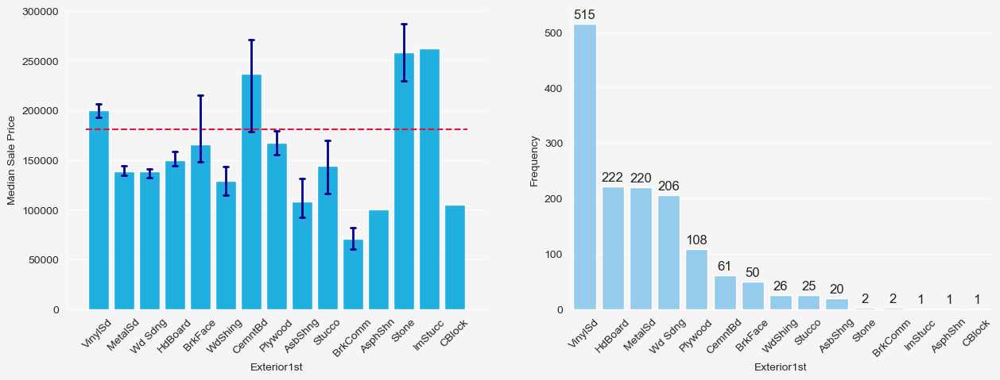

In [61]:
plot_cat_relation_cnt(train_da,'Exterior1st','Exterior1st',False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

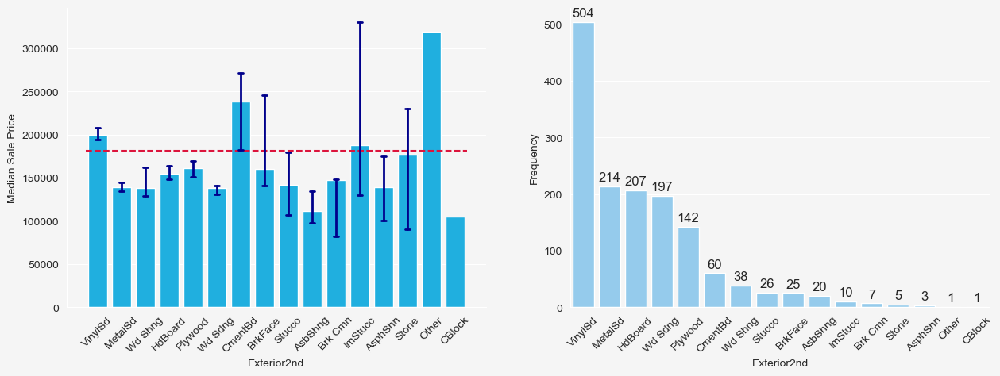

In [62]:
plot_cat_relation_cnt(train_da,'Exterior2nd','Exterior2nd',False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

- The housing price varies from covering to covering, so the variable can be a good indicator for sale price.
- In the right-hand table, there are only two or one observations in the last five classes. I will delete tehse categories.

#### Land Variables

- LandShape
- LandContour

##### Land Shape

- *Gtl* Gentle slope
- *Mod* Moderate Slope	
- *Sev* Severe Slope

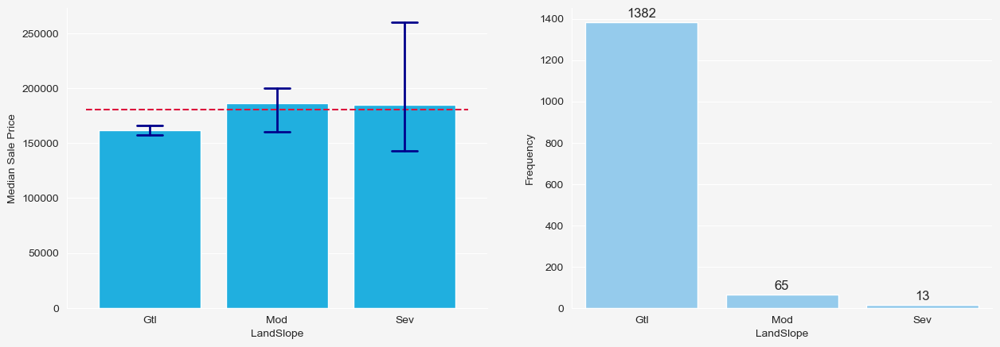

In [63]:
plot_cat_relation_cnt(train_da,'LandSlope','LandSlope',False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

The median housing price basically increases with the change in the level of slope of property. Also ordinality exists in the three categories, from gentle slope to severe slope. I will assign ordinal numbers to them.

##### LandContour

**Flatness of the property:**
- Lvl: Near Flat/Level	
- Bnk: Banked - Quick and significant rise from street grade to building
- HLS: Hillside - Significant slope from side to side
- Low: Depression

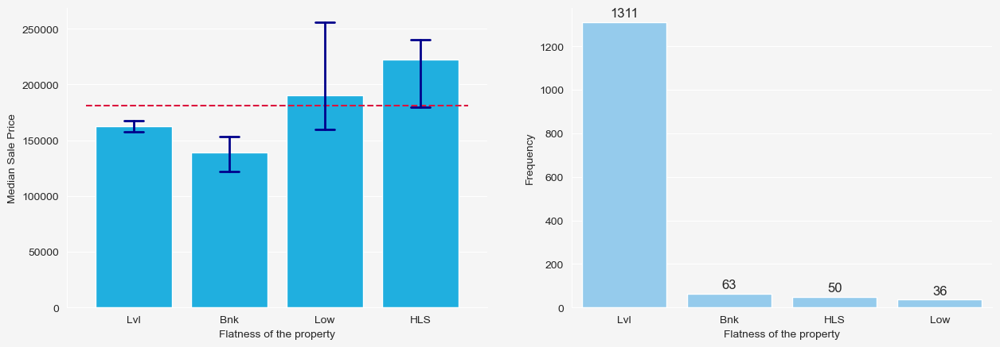

In [64]:
plot_cat_relation_cnt(train_da,'LandContour',"Flatness of the property",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

No ordinality. Just convert the variable to dummy variables.

#### Utilities

- AllPub: All public Utilities (E,G,W,& S)	
- NoSewr: Electricity, Gas, and Water (Septic Tank)
- NoSeWa: Electricity and Gas Only
- ELO: Electricity only

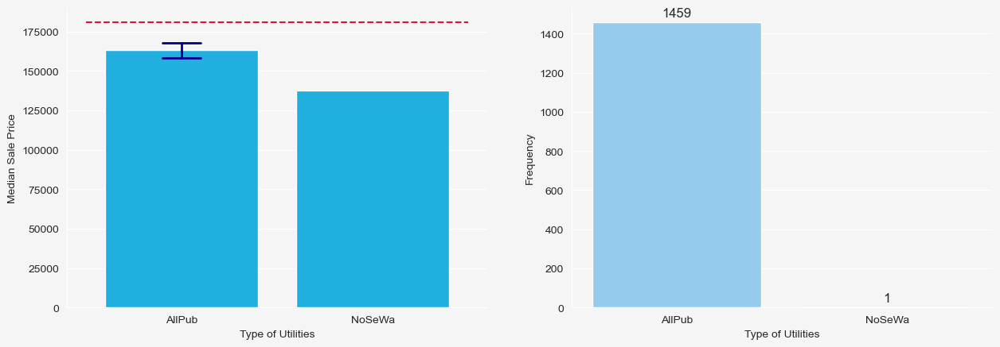

In [65]:
plot_cat_relation_cnt(train_da,"Utilities","Type of Utilities",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Intrepretation:**

In the right-hand table, a severely imbalanced distribution can be identified. Only one observation is in NoSewa, meaning that the categorical variable has basically zero variance. I will keep the variable in mind and delete it in data cleaning section.

#### Foundation

**Type of Foundation:**
- BrkTil: Brick & Tile
- CBlock: Cinder Block
- PConc: Poured Contrete	
- Slab: Slab
- Stone: Stone
- Wood: Wood

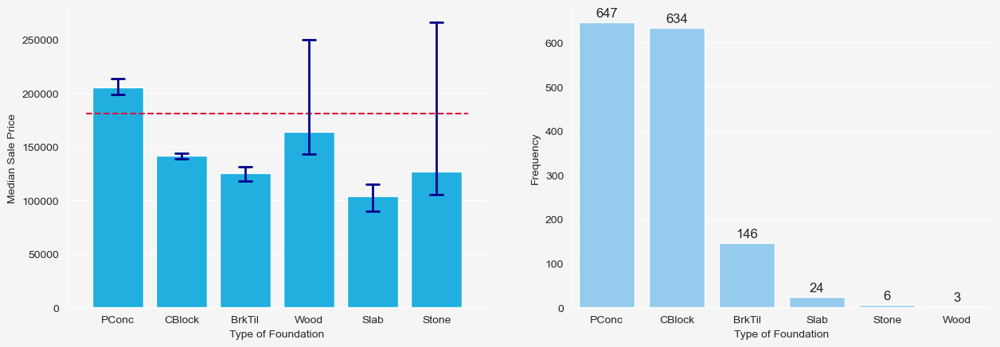

In [66]:
plot_cat_relation_cnt(train_da,"Foundation","Type of Foundation",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

- No ordinality can be discovered in the `Foundation`
- In right-hand table, the last two categories have fewer than 15 observations, meaning that they should be colleted together into one backoff bin.

#### Fence

- GdPrv	Good Privacy
- MnPrv	Minimum Privacy
- GdWo	Good Wood
- MnWw	Minimum Wood/Wire
- NA	No Fence

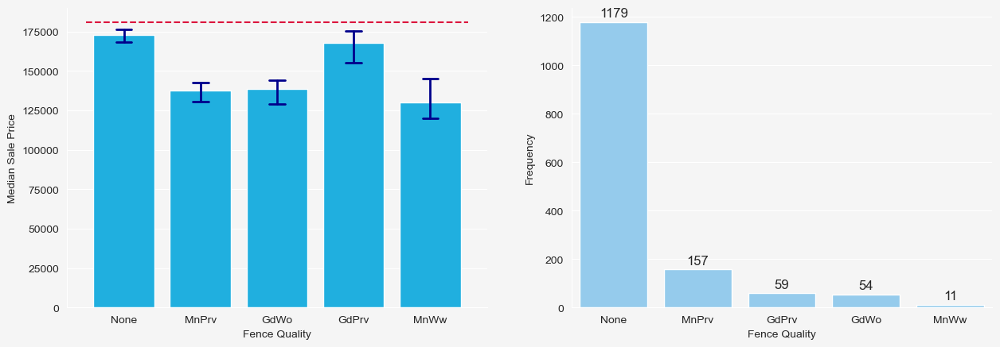

In [67]:
train_da["Fence"] = np.where(train_da["Fence"].isnull(),"None",train_da["Fence"])
test_da["Fence"] = np.where(test_da["Fence"].isnull(),"None",test_da["Fence"])
plot_cat_relation_cnt(train_da,"Fence","Fence Quality",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

I did not find ordinality here. So I will convert it to dummy variables.

#### Basement Variables

- BsmtQual: Evaluates the height of the basement 
- BsmtCond: Evaluates the general condition of the basement
- BsmtExposure: Refers to walkout or garden level walls
- BsmtFinType1: Rating of basement finished area
- BsmtFinType2: Rating of basement finished area (if multiple types)
- BsmtFullBath: Basement full bathrooms
- BsmtHalfBath: Basement half bathrooms

##### BsmtQual

- Ex: Excellent
- Gd: Good
- TA: Typical - slight dampness allowed
- Fa: Fair - dampness or some cracking or settling
- Po: Poor - Severe cracking, settling, or wetness
- NA: No Basement

The missing observations in `BsmtQual` means no basement. So I will replace the value of missing observaitons from NULL to "NA". 

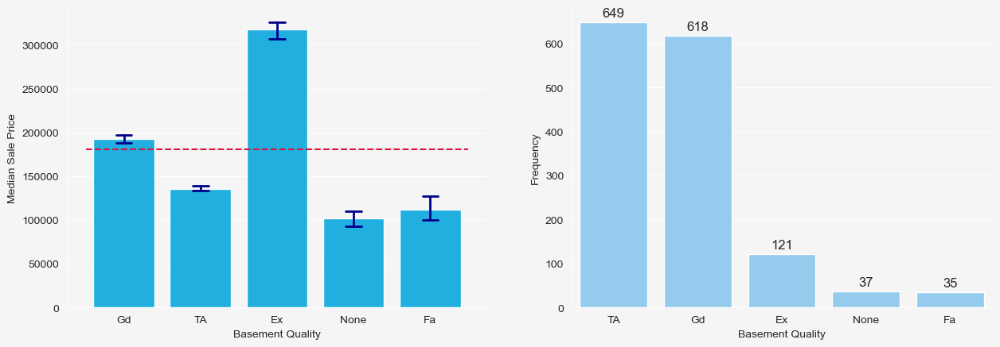

In [68]:
# replace NULL with specified string character
train_da["BsmtQual"] = np.where(train_da["BsmtQual"].isnull(),"None",train_da["BsmtQual"])
test_da["BsmtQual"] = np.where(test_da["BsmtQual"].isnull(),"None",test_da["BsmtQual"])
# inspect association with housing price and its distribution
plot_cat_relation_cnt(train_da,"BsmtQual","Basement Quality",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Intrepretation:**

As expected, houses with higher quality enjoy higher sale price. The positive relation, combined with ordinality, means that ordinal encoding should be conducted on the variable.

**Note: houses without basement have the lower median price. So None will be encoded as 0.**

##### BsmtCond

**Evaluates the general condition of the basement:**
- Ex: Excellent
- Gd: Good
- TA: Typical - slight dampness allowed
- Fa: Fair - dampness or some cracking or settling
- Po: Poor - Severe cracking, settling, or wetness
- NA: No Basement

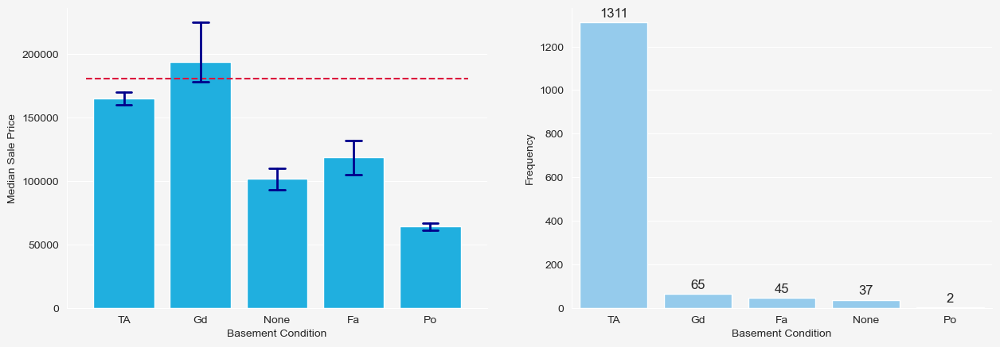

In [69]:
train_da["BsmtCond"] = np.where(train_da["BsmtCond"].isnull(),"None",train_da["BsmtCond"])
test_da["BsmtCond"] = np.where(test_da["BsmtCond"].isnull(),"None",test_da["BsmtCond"])
plot_cat_relation_cnt(train_da,"BsmtCond","Basement Condition",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

A house in a better condition is more valuable. Ordinal encoding should be performed on the varibale.

Also, `Po` has only two observations. **It should be deleted.**

###### BsmtExposure

- Gd: Good Exposure
- Av: Average Exposure (split levels or foyers typically score average or above)	
- Mn: Mimimum Exposure
- No: No Exposure
- NA: No Basement

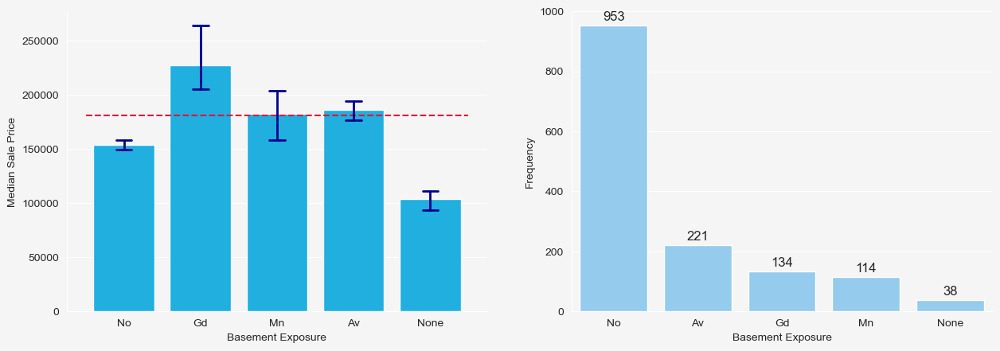

In [70]:
# replace NULL with specified string character
train_da["BsmtExposure"] = np.where(train_da["BsmtExposure"].isnull(),"None",train_da["BsmtExposure"])
test_da["BsmtExposure"] = np.where(test_da["BsmtExposure"].isnull(),"None",test_da["BsmtExposure"])
plot_cat_relation_cnt(train_da,"BsmtExposure","Basement Exposure",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

The house that gets more exposure is more valuable, and the logical sequence ranging from no exposure to good exposure indicates ordinality. So I will assign ordinal numbers to these categories.

##### BsmtFinType1

**Rating of basement finished area:**
- GLQ: Good Living Quarters
- ALQ: Average Living Quarters
- BLQ: Below Average Living Quarters	
- Rec: Average Rec Room
- LwQ: Low Quality
- Unf: Unfinshed
- NA: No Basement

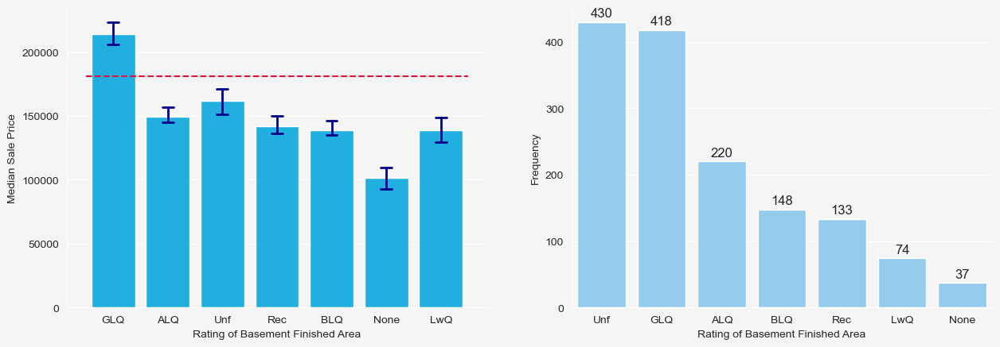

In [71]:
# replace NULL with specified string character
train_da["BsmtFinType1"] = np.where(train_da["BsmtFinType1"].isnull(),"None",train_da["BsmtFinType1"])
test_da["BsmtFinType1"] = np.where(test_da["BsmtFinType1"].isnull(),"None",test_da["BsmtFinType1"])
# inspect association with housing price and its distribution
plot_cat_relation_cnt(train_da,"BsmtFinType1","Rating of Basement Finished Area",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

I did not find ordinality here. So I will convert it into dummy variables.

##### BsmtFinType2

**Rating of basement finished area (if multiple types):**
- GLQ: Good Living Quarters
- ALQ: Average Living Quarters
- BLQ: Below Average Living Quarters	
- Rec: Average Rec Room
- LwQ: Low Quality
- Unf: Unfinshed
- NA: No Basement

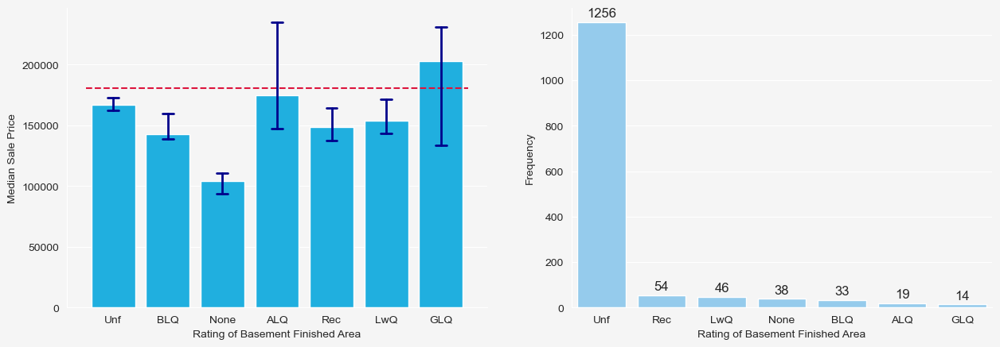

In [72]:
# replace NULL with specified string character
train_da["BsmtFinType2"] = np.where(train_da["BsmtFinType2"].isnull(),"None",train_da["BsmtFinType2"])
test_da["BsmtFinType2"] = np.where(test_da["BsmtFinType2"].isnull(),"None",test_da["BsmtFinType2"])
# inspect association with housing price and its distribution
plot_cat_relation_cnt(train_da,"BsmtFinType2","Rating of Basement Finished Area",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

I did not find ordinality here. So I will convert it into dummy variables.

##### BsmtFullBath

Basement full bathrooms

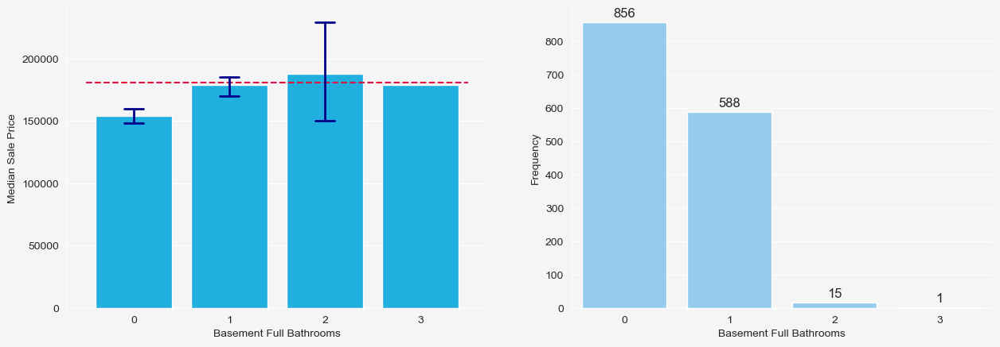

In [73]:
plot_cat_relation_cnt(train_da,"BsmtFullBath","Basement Full Bathrooms",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

The greater number of bathrooms can make the house more expensive. But we need to notice that there is only one observation in the category of 3 bathrooms. **I will delete the observation because of its small size.**

##### BsmtHalfBath

Basement half bathrooms. Just as the case of full bathrooms, the variable should be positively correlated with the sale price.

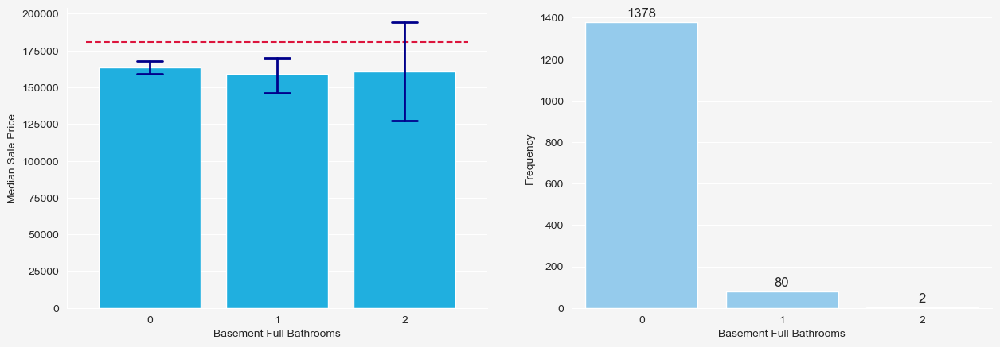

In [74]:
plot_cat_relation_cnt(train_da,"BsmtHalfBath","Basement Full Bathrooms",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

0 bathroom seems not to be significantly different from one half bathroom in terms of sale price. Also, the sample size of 2 half bathroom is too small to be reliably estimated. **I will not include the variable in model.**

#### House Heating & Air

- HeatingQC
- Heating
- CentralAir

##### HearingQC

- Ex: Excellent
- Gd: Good
- TA: Average/Typical
- Fa: Fair
- Po: Poor

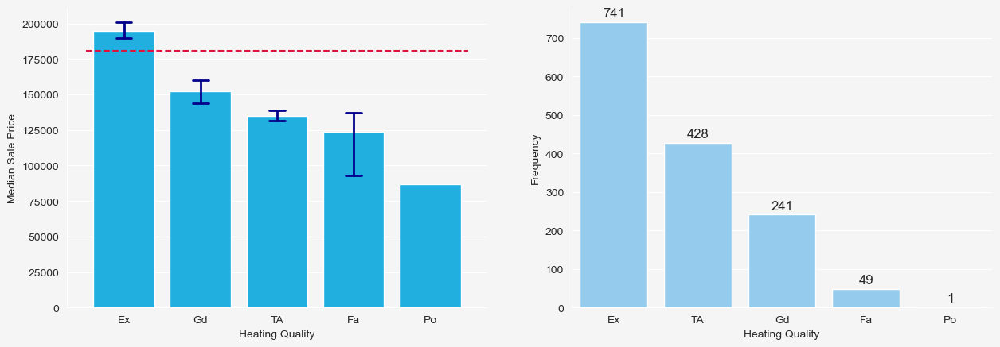

In [75]:
plot_cat_relation_cnt(train_da,"HeatingQC","Heating Quality",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

Ordinality exists in the variable.

##### Heating

- Floor: Floor Furnace
- GasA: Gas forced warm air furnace
- GasW: Gas hot water or steam heat
- Grav: Gravity furnace	
- OthW: Hot water or steam heat other than gas
- Wall: Wall furnace

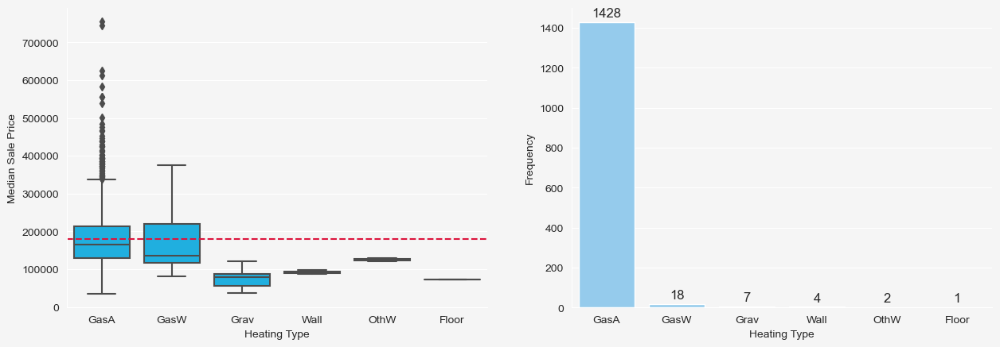

In [76]:
plot_cat_relation_cnt(train_da,"Heating","Heating Type",True)

**Interpretation:**

- No ordinality can be found in the variable
- The last four categories in right-hand table do not have enough sample size, which is way lower than the threshold 15, so I will accummlate them in backoff bin

In [77]:
def backoff_bin(data,col,threshold=15):
    """combine rare categories into one bin"""
    dist_ser = data[col].value_counts()
    mark = dist_ser<=threshold
    target_index = dist_ser[mark].index
    col_backoff = data[col].apply(lambda x:"rare_cat_bin" if x in target_index else x)
    return col_backoff

##### CentralAir

**Central air conditioning:**
- N	No
- Y	Yes

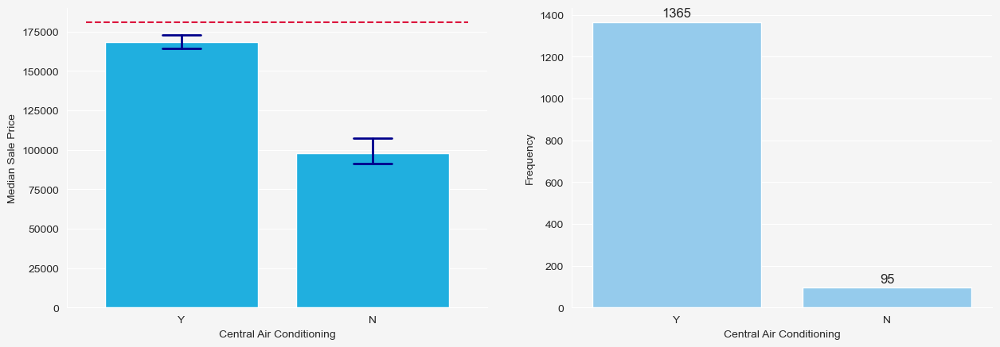

In [78]:
# inspect association with housing price and its distribution
plot_cat_relation_cnt(train_da,"CentralAir","Central Air Conditioning",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

- There is an obvious logical sequence, from no to yes
- A positive correlation can be identified: a house with good air conditioning is more valuable

#### Garage Variables

- GarageType
- GarageFinish
- GarageQual
- GarageCond
- Garagecars

##### GarageType

- 2Types: More than one type of garage
- Attchd: Attached to home
- Basment: Basement Garage
- BuiltIn: Built-In (Garage part of house - typically has room above garage)
- CarPort: Car Port
- Detchd: Detached from home
- NA: No Garage

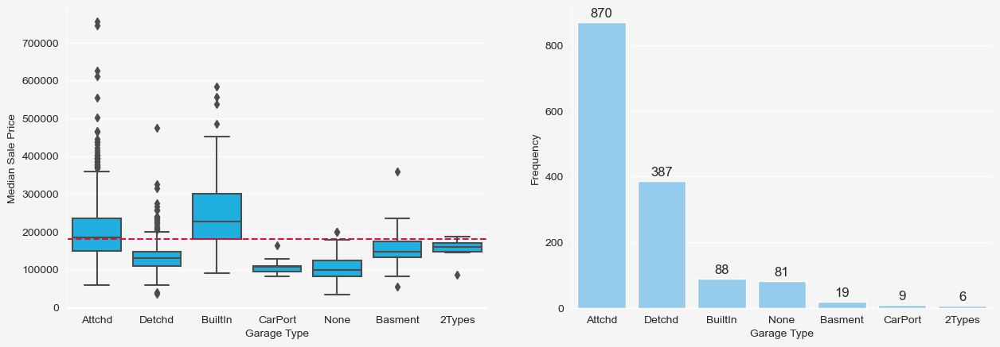

In [79]:
# replace NULL with specified string character
train_da["GarageType"] = np.where(train_da["GarageType"].isnull(),"None",train_da["GarageType"])
test_da["GarageType"] = np.where(test_da["GarageType"].isnull(),"None",test_da["GarageType"])
# inspect association with housing price and its distribution
plot_cat_relation_cnt(train_da,"GarageType","Garage Type")

**Interpretation:**

- No ordinality can be identified
- `2Types` and `CarPort` have fewer than 15 observations, so they will be collected in backoff bin.

##### GarageFinish

**Interior finish of the garage:**
- Fin: Finished
- RFn: Rough Finished	
- Unf: Unfinished
- NA: No Garage

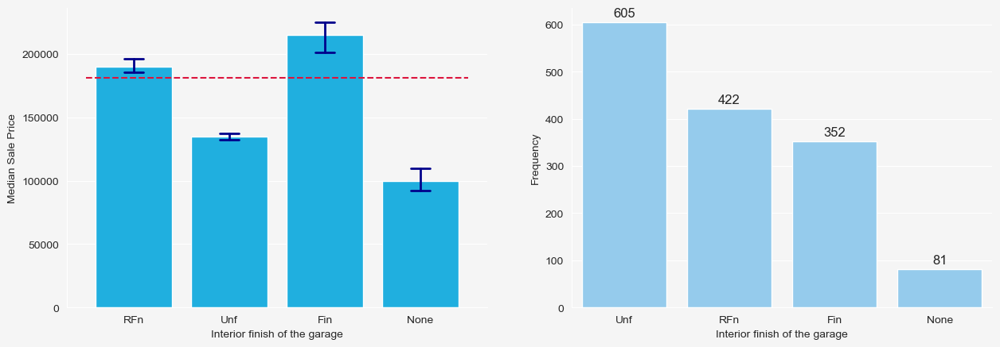

In [80]:
# replace NULL with specified string character
train_da["GarageFinish"] = np.where(train_da["GarageFinish"].isnull(),"None",train_da["GarageFinish"])
test_da["GarageFinish"] = np.where(test_da["GarageFinish"].isnull(),"None",test_da["GarageFinish"])
# inspect association with housing price and its distribution
plot_cat_relation_cnt(train_da,"GarageFinish","Interior finish of the garage",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

A perfect ordinality can be seen in the variable.

##### GarageQual

- Ex: Excellent
- Gd: Good
- TA: Typical/Average
- Fa: Fair
- Po: Poor
- NA: No Garage

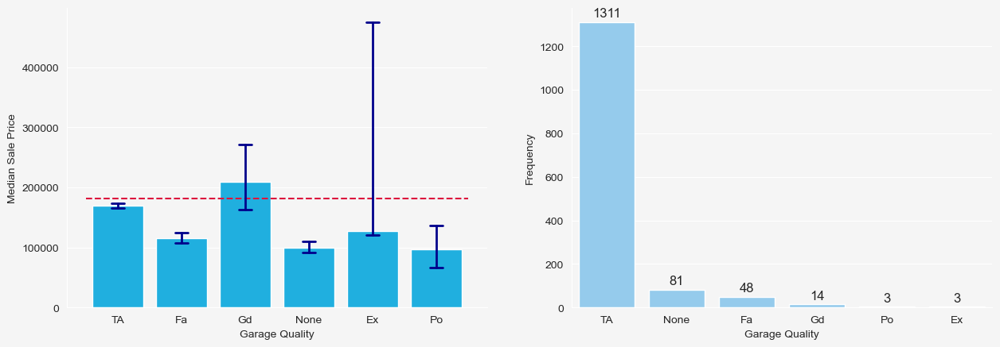

In [81]:
# replace NULL with specified string character
train_da["GarageQual"] = np.where(train_da["GarageQual"].isnull(),"None",train_da["GarageQual"])
test_da["GarageQual"] = np.where(test_da["GarageQual"].isnull(),"None",test_da["GarageQual"])
# inspect association with housing price and its distribution
plot_cat_relation_cnt(train_da,"GarageQual","Garage Quality",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

##### GarageCond

- Ex: Excellent
- Gd: Good
- TA: Typical/Average
- Fa: Fair
- Po: Poor
- NA: No Garage

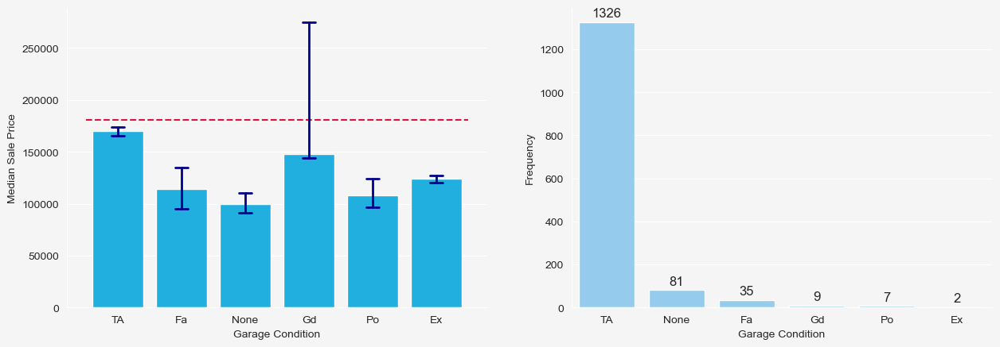

In [82]:
# replace NULL with specified string character
train_da["GarageCond"] = np.where(train_da["GarageCond"].isnull(),"None",train_da["GarageCond"])
test_da["GarageCond"] = np.where(test_da["GarageCond"].isnull(),"None",test_da["GarageCond"])
# inspect association with housing price and its distribution
plot_cat_relation_cnt(train_da,"GarageCond","Garage Condition",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

##### GarageCars

Size of garage in car capacity

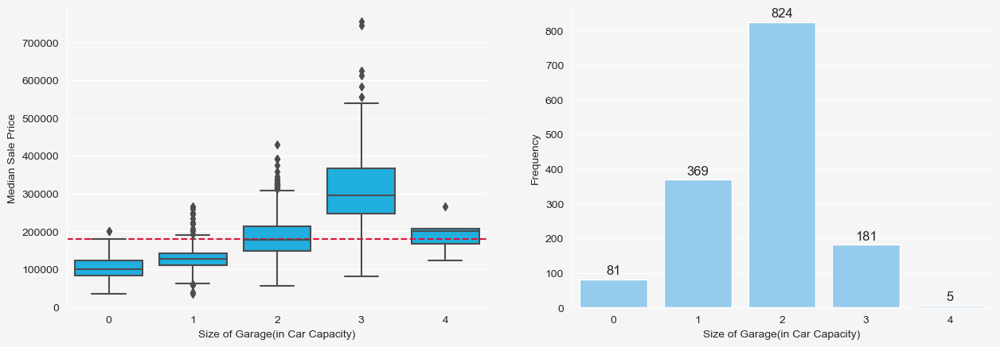

In [83]:
plot_cat_relation_cnt(train_da,"GarageCars","Size of Garage(in Car Capacity)",True)

**Interpretation:**

- A positive association can be found here: if a garage can accommdate more cars, it will be more valuable.
- The low price makes sense for a small garage that cannot accommdate any car.
- Garage size of 4 should be deleted because of its small size.

#### Kitchen Variables

- KitchenAbvGr
- KitchenQual

##### Kitchen Above Grade


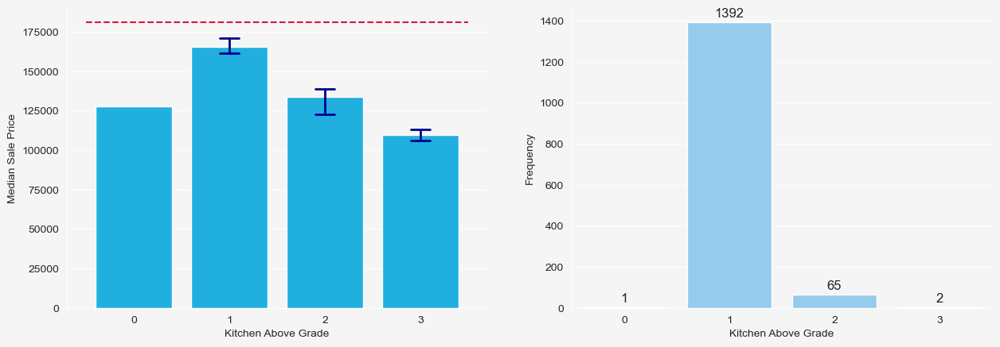

In [84]:
plot_cat_relation_cnt(train_da,"KitchenAbvGr","Kitchen Above Grade",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

The error bars of the bars indicate that The housing price of class 1 differs significantly from that of class 2. Furthermore, class 0 and class 3 do not have sufficiently large enough sample, so they should be deleted.

##### Kitchen Quality

- Ex: Excellent
- Gd: Good
- TA: Typical/Average
- Fa: Fair
- Po: Poor

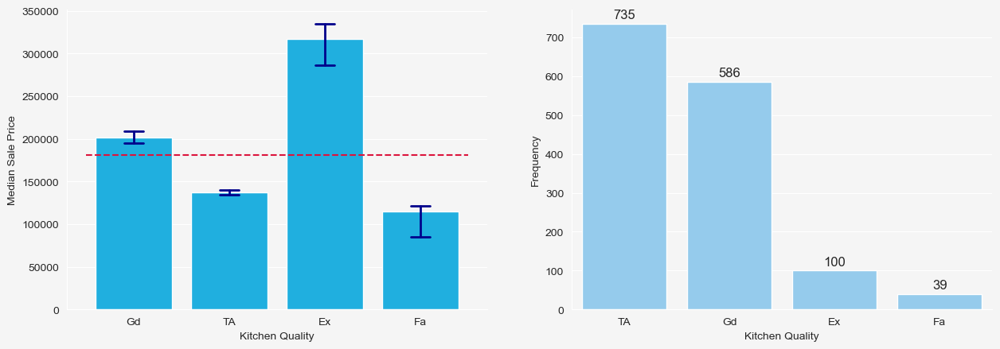

In [85]:
plot_cat_relation_cnt(train_da,"KitchenQual","Kitchen Quality",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Intrepretation:**

- Kitchen quality shows a logical sequence
- The higher Kitchen quality results in a more valuable house
- Ordinal encoding should be used

#### Fireplace Variables

- FireplaceQU
- Fireplaces

##### FireplaceQu

**Fireplace Quality:**

- Ex: Excellent - Exceptional Masonry Fireplace
- Gd: Good - Masonry Fireplace in main level
- TA: Average - Prefabricated Fireplace in main living area or Masonry Fireplace in basement
- Fa: Fair - Prefabricated Fireplace in basement
- Po: Poor - Ben Franklin Stove
- NA: No Fireplace

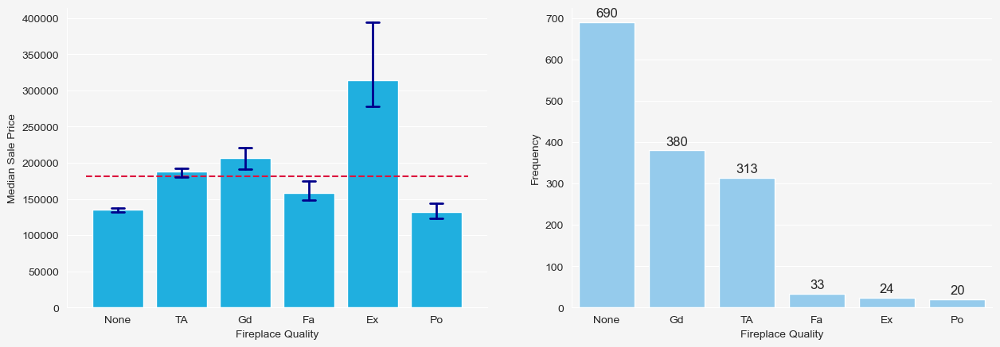

In [86]:
# replace NULL with specified string character
train_da["FireplaceQu"] = np.where(train_da["FireplaceQu"].isnull(),"None",train_da["FireplaceQu"])
test_da["FireplaceQu"] = np.where(test_da["FireplaceQu"].isnull(),"None",test_da["FireplaceQu"])
plot_cat_relation_cnt(train_da,"FireplaceQu","Fireplace Quality",False,
                     errwidth=2,errcolor="darkblue",capsize=.2)

**Intrepretation:**

To my expectation, a house will be more valuable if it has a good fireplace. The sample size for each category is also higher than the specified threshold. So I will directly ordinally encod the variable.

##### Fireplaces

Number of fireplaces

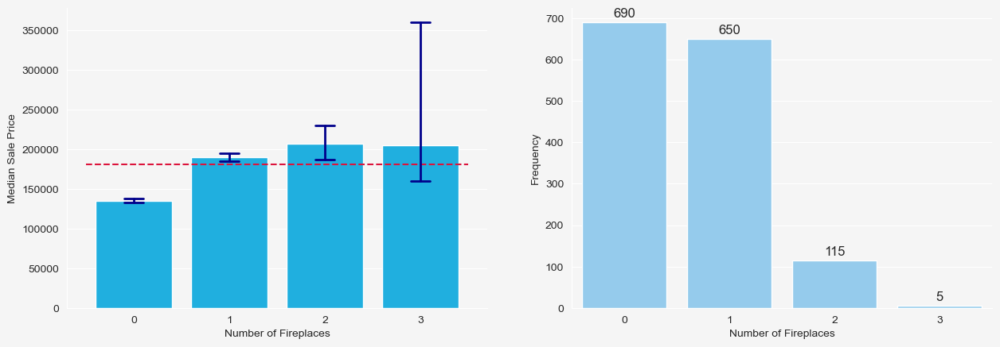

In [87]:
plot_cat_relation_cnt(train_da,"Fireplaces","Number of Fireplaces",False,
                      errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

As expected, the number of fireplaces positively impacts the housing price. 

#### Electrical System

- SBrkr: Standard Circuit Breakers & Romex
- FuseA: Fuse Box over 60 AMP and all Romex wiring (Average)	
- FuseF: 60 AMP Fuse Box and mostly Romex wiring (Fair)
- FuseP: 60 AMP Fuse Box and mostly knob & tube wiring (poor)
- Mix: Mixed

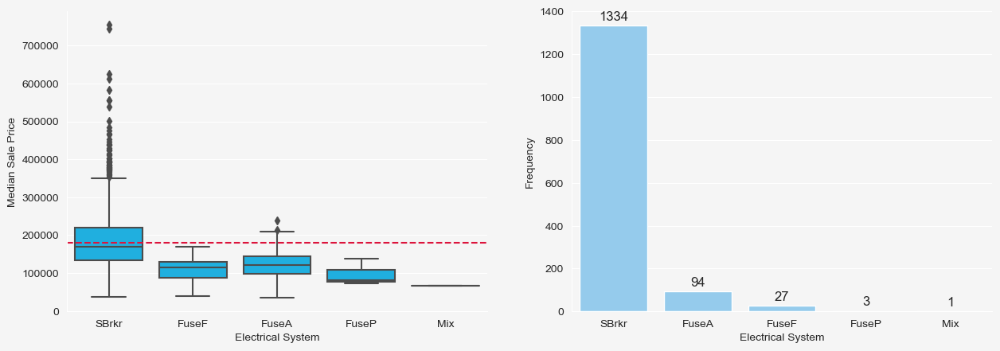

In [88]:
plot_cat_relation_cnt(train_da,"Electrical","Electrical System",True)

**Intrepretation:**

The last two classes in the right-hand table have very few observations. The rare categories should be treated specially, so I will either collect them in backoff bin or drop them.

#### MiscFeature

**Miscellaneous feature not covered in other categories:**
- Elev: Elevator
- Gar2: 2nd Garage (if not described in garage section)
- Othr: Other
- Shed: Shed (over 100 SF)
- TenC: Tennis Court
- NA: None

Missing values mean that the variable does not have these miscelleneous features, so I will convert these missing values into None.

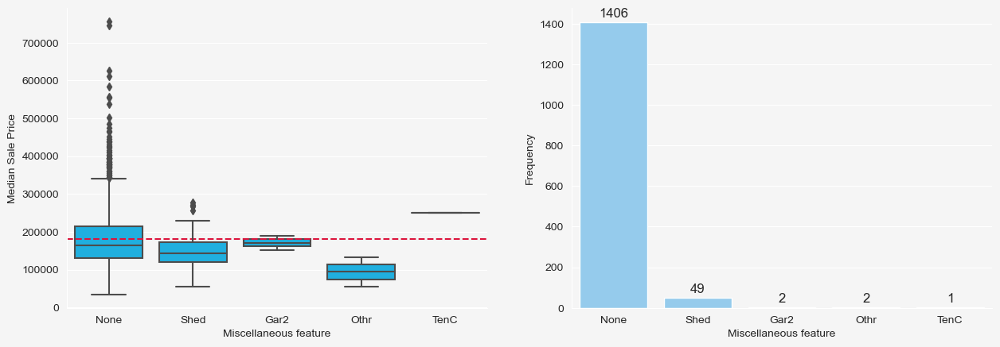

In [89]:
train_da["MiscFeature"] = np.where(train_da["MiscFeature"].isnull(),"None",train_da["MiscFeature"])
test_da["MiscFeature"] = np.where(test_da["MiscFeature"].isnull(),"None",test_da["MiscFeature"])
plot_cat_relation_cnt(train_da,"MiscFeature","Miscellaneous feature",True)

**Interpretation:**

House with a tennis court is most expensive. There is no ordinality, so I just convert the variable into  five dummy variables.

In addition, the last three classes in the histogram are too small to be reliably estimated. Even if I collect the three categories into one special bin, it still has only 5 observations. So **I will drop the three categories.**

#### Housing Conditions

- OverallCond
- BedroomAbvGr
- TotRmsAbvGrd
- Home functionality
- Condition1
- Condition2

##### OverallCond

**Rates the overall condition of the house:**
- 10: Very Excellent
- 9: Excellent
- 8: Very Good
- 7: Good
- 6: Above Average	
- 5: Average
- 4: Below Average	
- 3: Fair
- 2: Poor
- 1: Very Poor

**Hunch: Higher rating should result in more valuable houses.**

Let me prove the assumption

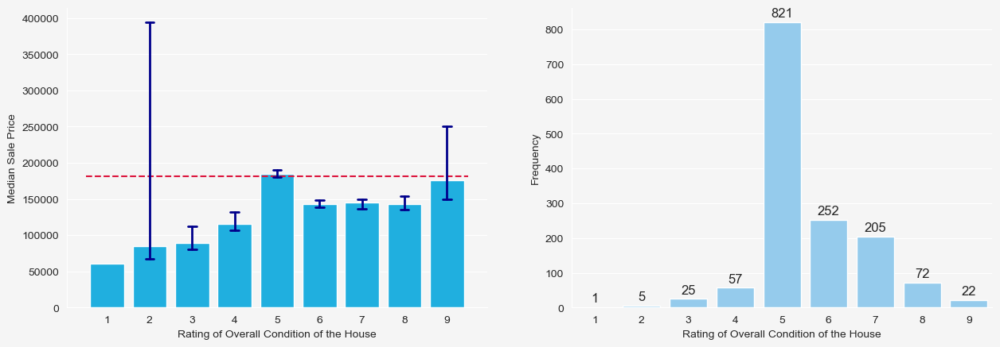

In [90]:
plot_cat_relation_cnt(train_da,"OverallCond","Rating of Overall Condition of the House",False,
                      errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

- As expected, the median housing price increases with rising rating of house condition. So the current ordinal encoding works well.
- The second category of rating, which is poor, has an extremely large confidence interval, meaning huge variability. Probabily this is because the very small sample size cannot reliably estimate the housing price.  Since they are ordinal numbers instead of categories, I just leave as what they are.

##### BedroomAbvGr

Bedrooms above grade (does NOT include basement bedrooms)

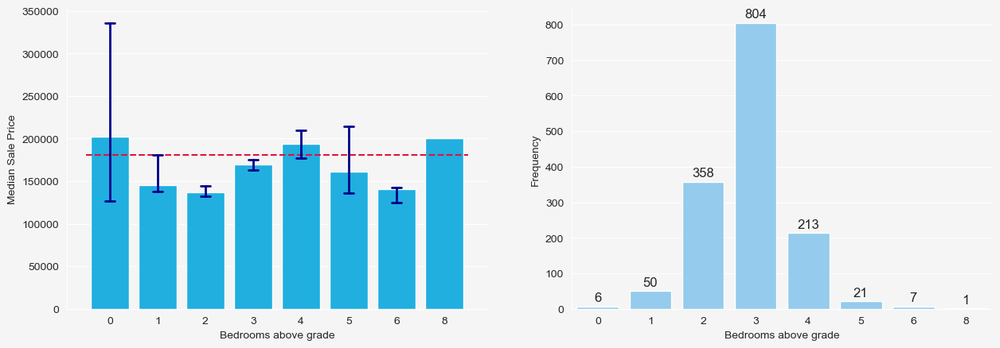

In [91]:
plot_cat_relation_cnt(train_da,'BedroomAbvGr',"Bedrooms above grade",False,
                      errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

It seems like that the housing price does not increase monotomically or decrease monotomically with the rise of number of above-grade bedrooms. Therefore, the ordinal encoding does not make sense here. **I will encode them as dummy variables.**

Also, some categories have very small sample size. I will collect these categoreis in backoff bin.

##### TotRmsAbvGrd

Total rooms above grade (does not include bathrooms)

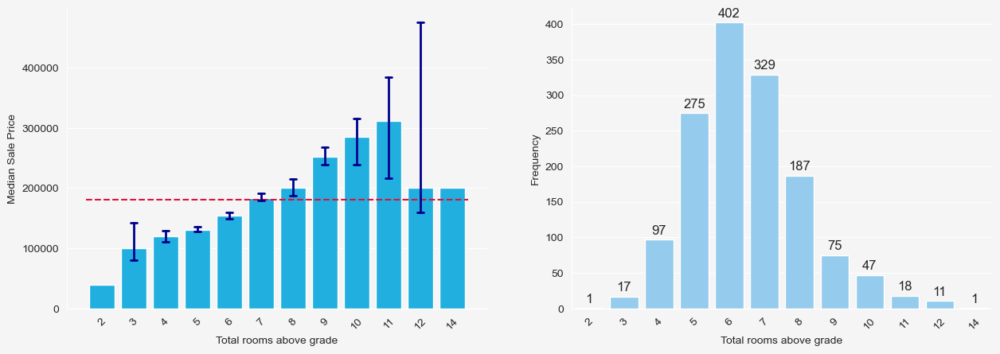

In [92]:
plot_cat_relation_cnt(train_da,"TotRmsAbvGrd","Total rooms above grade",False,
                      errwidth=2,errcolor="darkblue",capsize=.2)

**Interpretation:**

There is a monotomically increasing trend of housing price with the increase in total rooms, althrough the housing price suddenly reduces after 11.

So the current ordinal numbers are reasonable here.

##### House Functionality

- Typ: Typical Functionality
- Min1: Minor Deductions 1
- Min2: Minor Deductions 2
- Mod: Moderate Deductions
- Maj1: Major Deductions 1
- Maj2: Major Deductions 2
- Sev: Severely Damaged
- Sal: Salvage only

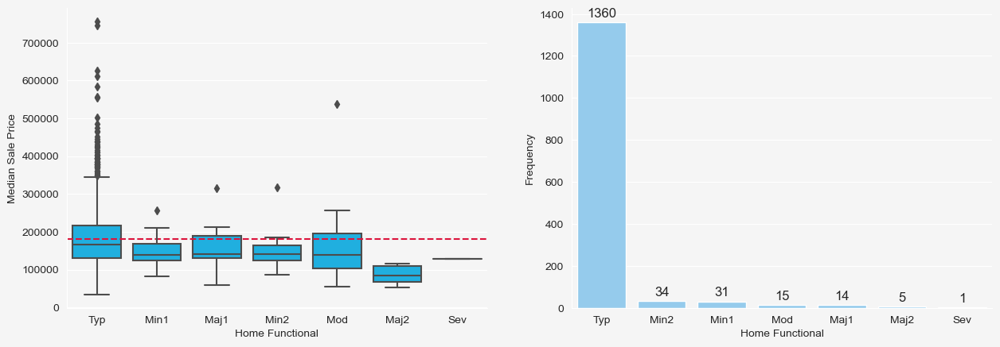

In [93]:
plot_cat_relation_cnt(train_da,"Functional","Home Functional",True)

**Interpretation:**

We can find ordinality here, and I will delete the last two categories.

##### Condition1

Proximity to various conditions

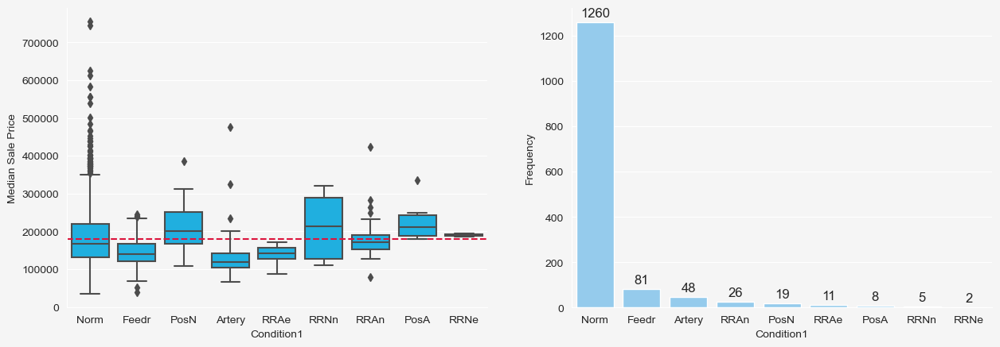

In [94]:
plot_cat_relation_cnt(train_da,"Condition1","Condition1",True)

#### Sale Variables

- SaleType
- SaleCondition

##### SaleType

- WD: Warranty Deed - Conventional
- CWD: Warranty Deed - Cash
- VWD: Warranty Deed - VA Loan
- New: Home just constructed and sold
- COD: Court Officer Deed/Estate
- Con: Contract 15% Down payment regular terms
- ConLw: Contract Low Down payment and low interest
- ConLI: Contract Low Interest
- ConLD: Contract Low Down
- Oth: Other

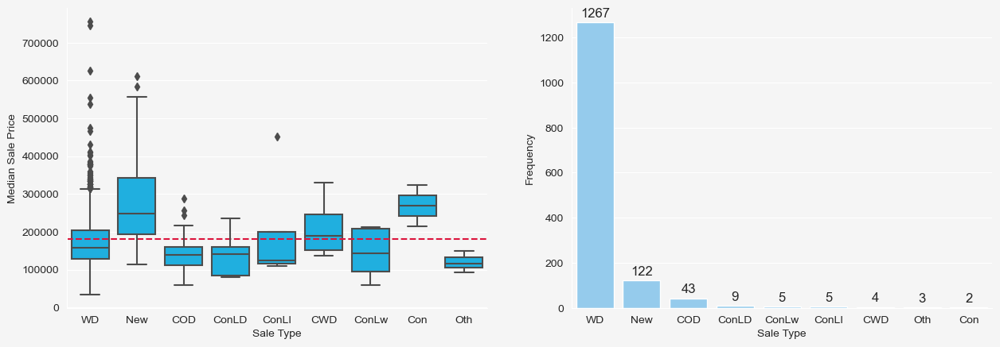

In [95]:
plot_cat_relation_cnt(train_da,"SaleType","Sale Type",True)

**Interpretation:**

This is categorical variable, so I just need to convert it to dummy variables.

##### SaleCondition

- Normal	Normal Sale
- Abnorml	Abnormal Sale -  trade, foreclosure, short sale
- AdjLand	Adjoining Land Purchase
- Alloca	Allocation - two linked properties with separate deeds, typically condo with a garage unit	
- Family	Sale between family members
- Partial	Home was not completed when last assessed (associated with New Homes)

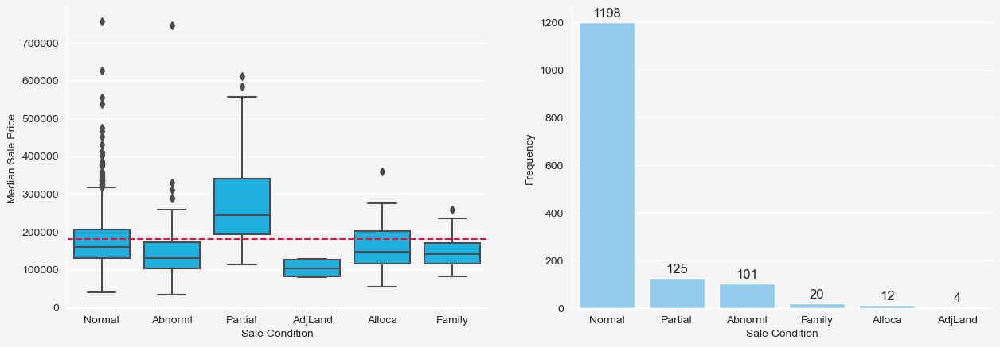

In [96]:
plot_cat_relation_cnt(train_da,"SaleCondition","Sale Condition",True)

# Prepare Data for Machine Learning

- Data Cleaning
- Handling Text and Categorical Variables
- 

In [97]:
# Here I convert two boolean values into integers
train_da["HavePool"] = train_da.HavePool.astype("int")

In the section, I will clean the dataset based on the insighst gained from EDA.


- Missing values of variables
- Duplication of variables
- Outliers in variables


## Outliers in Variables

Outliers are observations that are remarkably different from other observations and in most of cases are caused by logging error. If we predicted the the result of target variable using these extremly large values, the model would be pulled off course. **So we need to perform some transformations on the variables, such as quantization or binning. Sometimes, if we know the outliers are caused by logging error, we can directly delete them.**

Based on insights gained from EDA, I will directly drop the outlying observations I found in EDA. Let's filter them out.

In [98]:
train_da.query("GrLivArea>4000 and SalePrice<=200000")[attributes]

,OverallQual,SalePrice,GrLivArea,GarageArea,TotalBsmtSF,HalfBath
523,10,184750,4676,884,3138,1
1298,10,160000,5642,1418,6110,1


In [99]:
# drop the three outliers
train_da.drop(labels=[523,1298],inplace=True)

## Impute Missing values of Variables

In [100]:
def get_missing_pct(df):
    """compute the percentage for missing val"""
    missing_df = df.apply(lambda col:col.isnull().sum()).to_frame().reset_index().rename(columns={"index":"column",0:"missing_cnt"})
    IsMissing = missing_df["missing_cnt"]>0
    missing_df_ = missing_df[IsMissing]
    missing_df_["missing_pct"] = missing_df["missing_cnt"] / df.shape[0]
    return missing_df_

In [101]:
# compute the missing count and missing percent for train data and test data
train_missing_df = get_missing_pct(train_da)
test_missing_df = get_missing_pct(test_da)

In [102]:
cm = sns.light_palette("deepskyblue", as_cmap=True)
display(train_missing_df.sort_values(by="missing_pct",ascending=False).style.background_gradient(cm))
display(test_missing_df.sort_values(by="missing_pct",ascending=False).style.background_gradient(cm))

,column,missing_cnt,missing_pct
71,PoolQC,1452,0.995885
2,LotFrontage,259,0.177641
58,GarageYrBlt,81,0.055556
24,MasVnrType,8,0.005487
25,MasVnrArea,8,0.005487
41,Electrical,1,0.000686


,column,missing_cnt,missing_pct
71,PoolQC,1456,0.997944
2,LotFrontage,227,0.155586
58,GarageYrBlt,78,0.053461
24,MasVnrType,16,0.010966
25,MasVnrArea,15,0.010281
1,MSZoning,4,0.002742
8,Utilities,2,0.001371
54,Functional,2,0.001371
46,BsmtFullBath,2,0.001371
47,BsmtHalfBath,2,0.001371


**Interpretation:**

PoolQC has as much as 99 percent of observations being missing from the dataset. Therefore, I will first impute the missing values of it.

- **Pool Quality**

Based on the insight gained from EDA, we know that just a small proportion of hosues have pool. Therefore, the extremely high missing percentage makses senese here. I just need to impute these missing values with None, which means no pool.

In [103]:
# examine the observations that are not missing from both train set and test set
train_da.query("PoolArea>0")[['PoolArea','PoolQC']]

,PoolArea,PoolQC
197,512,Ex
810,648,Fa
1170,576,Gd
1182,555,Ex
1386,519,Fa
1423,738,Gd


In [104]:
# check houses with pool in test set
test_da.query("PoolArea>0")[['PoolArea','PoolQC']]

,PoolArea,PoolQC
514,144,Ex
960,368,NaN
1043,444,NaN
1113,228,Ex
1139,561,NaN
1250,800,Gd


Some houses with a pool do not have the quality records. I think we can impute the three values based on other relevant attributes. Let's examine other attributes of these houses that are correlated with quality.

In [105]:
# let's gain insights into train set
train_da.query("PoolArea>0")[['OverallQual','PoolArea','PoolQC']]

,OverallQual,PoolArea,PoolQC
197,8,512,Ex
810,6,648,Fa
1170,6,576,Gd
1182,10,555,Ex
1386,7,519,Fa
1423,6,738,Gd


**Interpretation:**

Basically, the pool quality will be very high if the overall quality gets a high value. For instance, the pool quality is Excellent for houses that get rating between 8 and 10. So I personally assume the following mapping relation:

- Pool quality will be excellent, if rating of overall quality ranges from 8 to 10
- Pool quality will be good, if rating of overall quality ranges from 6 to 7
- Pool quality will be average, if rating of overall quality ranges from 4 to 6
- Pool qualitu will be 1 to 3, if rating of overall quality ranges from 1 to 3

In [106]:
display(test_da.query("PoolArea>0")[['OverallQual','PoolArea','PoolQC']])

,OverallQual,PoolArea,PoolQC
514,10,144,Ex
960,4,368,NaN
1043,6,444,NaN
1113,8,228,Ex
1139,3,561,NaN
1250,7,800,Gd


In [107]:
# impute the missing values of test data
test_da.loc[960,'PoolQC'] = "TA"
test_da.loc[1043,'PoolQC'] = "Gd"
test_da.loc[1139,'PoolQC'] = "Fa"

Now I just impute the remaining missing values with None

In [108]:
train_da['PoolQC'] = np.where(train_da["PoolQC"].isnull(),"None",train_da["PoolQC"])
test_da['PoolQC'] = np.where(test_da["PoolQC"].isnull(),"None",test_da["PoolQC"])

In [109]:
# examine the imputation
print(f"Missing Value Count:{train_da['PoolQC'].isnull().sum()}")
print(f"Missing Value Count:{test_da['PoolQC'].isnull().sum()}")

Missing Value Count:0
Missing Value Count:0


- **Fence**

In [110]:
# directly impute missing values with None
train_da['Fence'] = np.where(train_da["Fence"].isnull(),"None",train_da["Fence"])
test_da['Fence'] = np.where(test_da["Fence"].isnull(),"None",test_da["Fence"])

- **LotFrontage**

For the variable, I decided to use the median/mean lot frontage of relevant lot categorical variables to impute the missing values.

First, let's see the distribution of missing values across the two lot variables.

In [111]:
temp = train_da[train_da.LotFrontage.isnull()][["LotFrontage","LotArea","1stFlrSF","LotShape","LotConfig"]]
print(f"Distribution of Missing Values across Lot Shape:\n{temp.LotShape.value_counts()}")
print("_________________________________________________________________________")
print(f"Distribution of Missing Values across Lot Config:\n{temp.LotConfig.value_counts()}")

Distribution of Missing Values across Lot Shape:
IR1    167
Reg     74
IR2     15
IR3      3
Name: LotShape, dtype: int64
_________________________________________________________________________
Distribution of Missing Values across Lot Config:
Inside     134
Corner      62
CulDSac     49
FR2         14
Name: LotConfig, dtype: int64


In [112]:
display(train_da.groupby("LotConfig").agg({"LotFrontage":"mean"}))
display(train_da.groupby("LotShape").agg({"LotFrontage":"mean"}))
display(f"Mean Lot Frontage across all houses:{train_da.LotFrontage.mean()}")

,LotFrontage
LotConfig,
Corner,82.895000
CulDSac,59.911111
FR2,63.515152
FR3,70.750000
Inside,67.647764


,LotFrontage
LotShape,
IR1,75.924051
IR2,76.500000
IR3,109.333333
Reg,67.038778


'Mean Lot Frontage across all houses:69.79733110925771'

I decided to impute the missing observations with values of corresponding category of lotconfig.

In [113]:
def impute_lotfrontage(x):
    """Impute Missing Values with values Corresponding category of Config"""
    import math
    
    if math.isnan(x.loc["LotFrontage"]) and x.loc["LotConfig"] == "Corner":
        x.loc["LotFrontage"] = 82.895
    elif math.isnan(x.loc["LotFrontage"]) and x.loc["LotConfig"] == "CulDSac":
        x.loc["LotFrontage"] = 59.911
    elif math.isnan(x.loc["LotFrontage"]) and x.loc["LotConfig"] == "FR2":
        x.loc["LotFrontage"] = 63.515
    elif math.isnan(x.loc["LotFrontage"]) and x.loc["LotConfig"] == "FR3":
        x.loc["LotFrontage"] = 70.75
    elif math.isnan(x.loc["LotFrontage"]) and x.loc["LotConfig"] == "Inside":
        x.loc["LotFrontage"] = 67.648
    return x

In [114]:
train_da = train_da.apply(lambda row:impute_lotfrontage(row),axis=1)
test_da = test_da.apply(lambda row:impute_lotfrontage(row),axis=1)

- **GarageYrBlt**

NaN means no garage. I will test whether all houses with garages have the record of GarageYrBlt, GarageQual, GarageCond.

In [115]:
# train data
attrs = ["GarageYrBlt","GarageType","GarageFinish","GarageCars",
                                              "GarageArea","GarageQual","GarageCond"]
temp = train_da.query("GarageArea>0")[attrs]
temp.isnull().sum()

GarageYrBlt     0
GarageType      0
GarageFinish    0
GarageCars      0
GarageArea      0
GarageQual      0
GarageCond      0
dtype: int64

In [116]:
# test data
temp = test_da.query("GarageArea>0")[attrs]
temp.isnull().sum()

GarageYrBlt     1
GarageType      0
GarageFinish    0
GarageCars      0
GarageArea      0
GarageQual      0
GarageCond      0
dtype: int64

We can find that a house lacks the recod of `YearBlt` even if it has a garage. Let's filter it out and impute it.

In [117]:
temp[temp.GarageYrBlt.isnull()]

,GarageYrBlt,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
666,NaN,Detchd,None,1.000000,360.000000,None,None


To impute it, I need to know the general year of construction for Detchd Type.

In [118]:
detchd_da = train_da[train_da.GarageType=="Detchd"]
garage_stats = [detchd_da.GarageYrBlt.mode().values[1],detchd_da.GarageFinish.mode().values[0],detchd_da.GarageCars.mode().values[0],
               detchd_da.GarageArea.mean(),detchd_da.GarageQual.mode().values[0],detchd_da.GarageCond.mode().values[0]]
res = pd.DataFrame(garage_stats,index=["GarageYrBlt","GarageFinish","GarageCars","GarageArea","GarageQual","GarageCond"],
            columns=["Stats"])
display(res)

,Stats
GarageYrBlt,1999.000000
GarageFinish,Unf
GarageCars,2
GarageArea,426.857881
GarageQual,TA
GarageCond,TA


In [119]:
test_da.loc[666,["GarageYrBlt","GarageFinish","GarageQual","GarageCond"]] = \
[1999,"Unf","TA","TA"]
test_da.loc[1116,["GarageYrBlt","GarageFinish","GarageCars","GarageArea","GarageQual","GarageCond"]] = \
[1999,"Unf",2,426.857881,"TA","TA"]

In [120]:
# impute NaN with 0
train_da['GarageYrBlt'] = np.where(train_da["GarageYrBlt"].isnull(),0,train_da["GarageYrBlt"])
test_da['GarageYrBlt'] = np.where(test_da["GarageYrBlt"].isnull(),0,test_da["GarageYrBlt"])

There are two observations that have infomation in certain Garage variables when the GarageYrBlt is NULL.

I will compute the corresponding mode and mean for these variables given the Detchd garage type.

### Impute Remaining Variables

In [121]:
display(get_missing_pct(train_da))
display(get_missing_pct(test_da))

,column,missing_cnt,missing_pct
24,MasVnrType,8,0.005487
25,MasVnrArea,8,0.005487
41,Electrical,1,0.000686


,column,missing_cnt,missing_pct
1,MSZoning,4,0.002742
8,Utilities,2,0.001371
22,Exterior1st,1,0.000685
23,Exterior2nd,1,0.000685
24,MasVnrType,16,0.010966
25,MasVnrArea,15,0.010281
33,BsmtFinSF1,1,0.000685
35,BsmtFinSF2,1,0.000685
36,BsmtUnfSF,1,0.000685
37,TotalBsmtSF,1,0.000685


In [122]:
# split the train set into labels and features
y = train_da.SalePrice
lg_y = train_da.lg_SalePrice
train_da.drop(["SalePrice","lg_SalePrice"],axis=1,inplace=True)

In [123]:
# get the columns
object_cols,numerical_cols,discrete_cols,continuous_cols = get_columns(train_da)

In [124]:
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import KNNImputer, MissingIndicator
from sklearn.pipeline import FeatureUnion 

# preprocessing for numerical data
continuous_transformer = Pipeline([
    ("mean imputer",SimpleImputer(strategy="mean"))
])

cats_transformer = Pipeline([
    ("k nearest imputer",SimpleImputer(strategy="most_frequent"))
])


# build the column transformer
preprocessor = ColumnTransformer(
  transformers = [
    ("continuous_num",continuous_transformer,continuous_cols),
      ("cats",cats_transformer,object_cols+discrete_cols)
  ]
)

preprocessor_model = preprocessor.fit(train_da)
train_da_imputed = pd.DataFrame(preprocessor_model.transform(train_da),
                                columns=continuous_cols+object_cols+discrete_cols).\
convert_dtypes(convert_floating=True)
test_da_imputed = pd.DataFrame(preprocessor_model.transform(test_da),
                               columns=continuous_cols+object_cols+discrete_cols).\
convert_dtypes(convert_floating=True)

## Duplication of Variables

ID is the primary key of the dataset and we check whethere there are duplicated rows.

In [125]:
print(train_da_imputed.duplicated().sum())
print(test_da_imputed.duplicated().sum())

0
0


The result shows that there are no duplicated observations.

# Feature Engineering

We need to first contenate train set and test set so that we can perform transformations on them simultaneously.

In [126]:
# concatenate train set and test set
full_data = pd.concat([train_da_imputed,test_da_imputed])

## Feature Extraction

Feature extraction means that we combine existing features to produce a more useful one. There are a number of variables that are describing one aspect of a house, such as open porch, so we can combine them in some ways.

### Total Living Area

Based on the correlation matrix, GrLivArea is the second largest determinant, indicating that people places greater importance on the activity space. Since basement is also another kind of living space, I combine the two variables into one TotalLivingArea.

**Additional Research**

Based on information from websites, I found that the total area of a house can be splitted into several parts just as the picture shows:

<img src="https://www.gimme-shelter.com/wp-content/uploads/2011/09/Total-Floor-Area-of-a-House.png" width="300">

Assume that this is a house with two levels

Total Floor Area(Above-grade Living Area) = Living Area + First Floor + Second Floor + Addition

Total Area = floor area + garage area + porch areax


**Note: garage area and porch area are not counted in floor area because they are not living space, and basement area is also excluded becuase it is not above-ground area.**

Correlation Coefficient:0.829


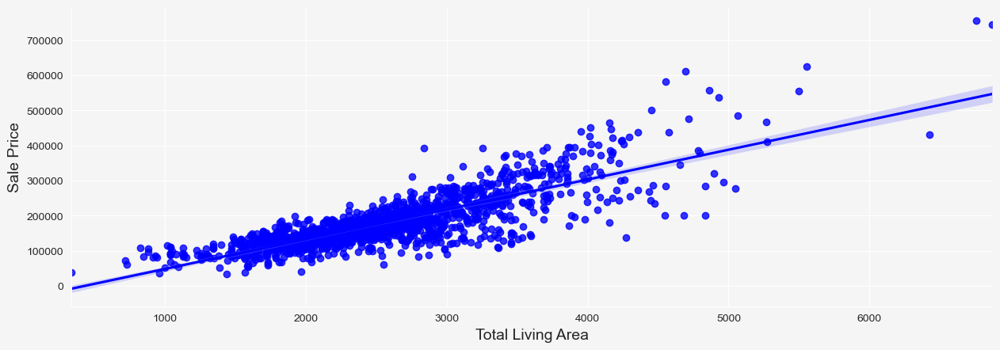

In [127]:
# create the total area var
plot_da = pd.concat([train_da.copy(),y],axis=1)
plot_da["TotalLivingArea"] = plot_da['GrLivArea'] + plot_da['TotalBsmtSF']
# visualization
coef = plot_da["TotalLivingArea"].corr(plot_da["SalePrice"])
print(f"Correlation Coefficient:{round(coef,3)}")
plot_scatter(plot_da,"TotalLivingArea","Total Living Area")

The variable is better than just one GrLivArea or TotalBsmtSF. I will include the variable in model and exclude GrLivArea and TotalBsmtSF.

In [128]:
# now let's create the variable in full data
full_data['TotalLivArea'] = full_data['GrLivArea'] + full_data['TotalBsmtSF']
# then drop the two variables
full_data.drop(["GrLivArea","TotalBsmtSF"],axis=1,inplace=True)

###  IsRemodel

Now we create a variable to indicate whether the house experienced any renovation.

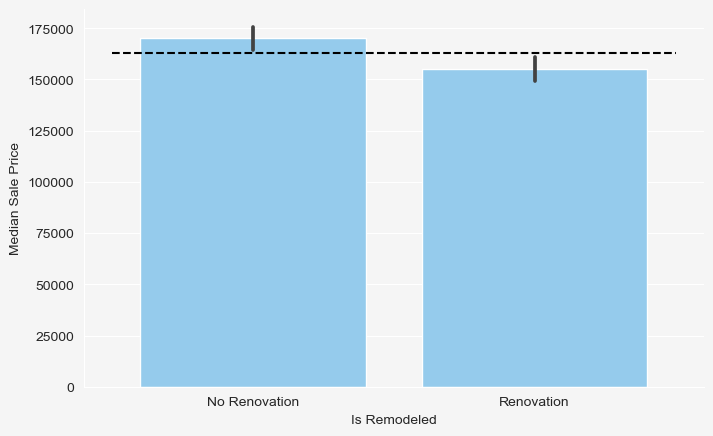

In [129]:
# create variable IsRemod
plot_da['IsRemod'] = (plot_da["YearBuilt"] != plot_da["YearRemodAdd"]).astype('int')

# compute median price for all houses
mean_house_price = plot_da["SalePrice"].median()

# visualize
sns.set_style('darkgrid')
fig,ax = plt.subplots(1,1,figsize=(8,5),dpi=100,facecolor="whitesmoke")
sns.barplot(data=plot_da,x='IsRemod',y="SalePrice",color='lightskyblue',estimator=np.median)
ax.hlines(y=mean_house_price,xmin=-0.5,xmax=1.5,colors="black",linewidth=1.5,linestyles="dashed")
ax.set_xlabel("Is Remodeled")
ax.set_ylabel("Median Sale Price")
ax.set_facecolor("whitesmoke")
ax.set_xticklabels(["No Renovation",'Renovation'])
for spine in ["top","right"]:
        ax.spines[spine].set_visible(False)
plt.show()

**Interpretation:**

- Renovated houses are less valuaed than houses without renovation. 
- The non-overlapped error bars of the two bars indicate that there is significant difference between the sale prices of renovated houses and old houses.

In [130]:
# Now create the variable in full data
full_data['Is_Remod'] = (full_data["YearBuilt"] != full_data["YearRemodAdd"]).astype('int')

##### Is New?

There are also a number of houses whose year of selling equal to the year of construction, meaning that the house is completely new when being sold to people. **My hunch is that these completely new houses should priced higher.**

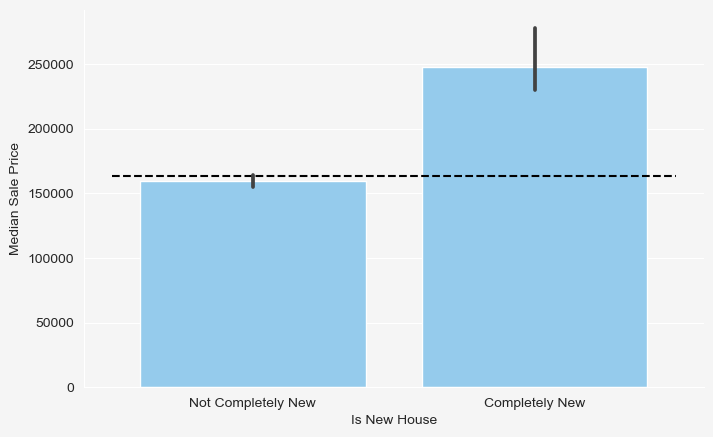

In [131]:
# create IsNew variable for verification of my assumption
plot_da["IsNew"] = (plot_da.YrSold == plot_da.YearBuilt).astype("int")

# visualize
sns.set_style('darkgrid')
fig,ax = plt.subplots(1,1,figsize=(8,5),dpi=100,facecolor="whitesmoke")
sns.barplot(data=plot_da,x='IsNew',y="SalePrice",color='lightskyblue',estimator=np.median)
ax.hlines(y=mean_house_price,xmin=-0.5,xmax=1.5,colors="black",linewidth=1.5,linestyles="dashed")
ax.set_xlabel("Is New House")
ax.set_ylabel("Median Sale Price")
ax.set_facecolor("whitesmoke")
ax.set_xticklabels(["Not Completely New","Completely New"])
for spine in ["top","right"]:
        ax.spines[spine].set_visible(False)
plt.show()

**Intrepretation:**

We can obtain the same insights as what we have seen in IsRemodel. Just as we expect, the new houses has much more higher median prices than houses that are not completely new.

In [132]:
full_data["IsNew"] = (full_data.YrSold == full_data.YearBuilt).astype("int")

### Age

Given the common sense that people make purchase decision based on the newest time of renovation, I decided to use `YearRemodAdd` to determine the age of houses.

Correlation Coefficient:-0.51


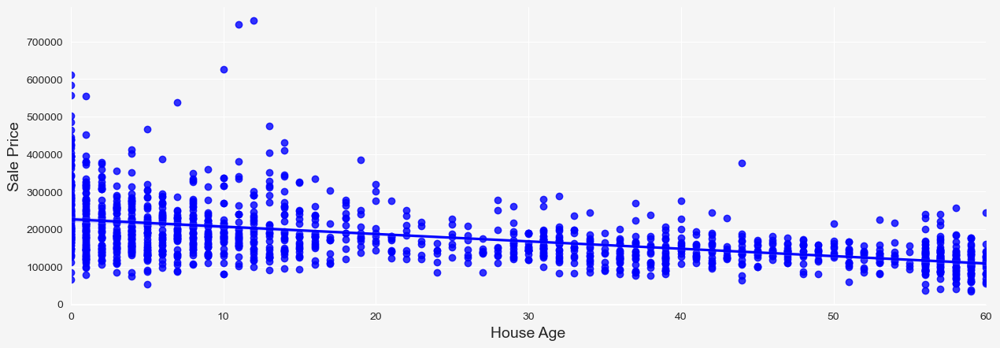

In [133]:
# create the age variable
plot_da["house_age"] = plot_da["YrSold"] - plot_da["YearRemodAdd"]
coef = plot_da["house_age"].corr(plot_da["SalePrice"])
print(f"Correlation Coefficient:{round(coef,3)}")
plot_scatter(plot_da,"house_age","House Age")

In [134]:
full_data["house_age"]  =  full_data["YrSold"] - full_data["YearRemodAdd"]

### Total Bath Rooms

As expected, houses with greater age has lower price.

In [135]:
# combine bath variables
plot_da["TotalBathRooms"] = plot_da.BsmtFullBath +  plot_da.BsmtHalfBath*0.5+ \
plot_da.FullBath + plot_da.HalfBath*0.5

In [136]:
# check the correlation coefficient with sale price.
print(f"Correlation with Sale Price: {plot_da.TotalBathRooms.corr(y).round(4)}")

Correlation with Sale Price: 0.6359


The relationship is much more stronger now than when I did not combine them. So I will include the combined variable.

In [137]:
# create the variable
full_data["TotalBathRooms"] = full_data.BsmtFullBath +  full_data.BsmtHalfBath*0.5+ \
full_data.FullBath + full_data.HalfBath*0.5

# drop the four variables
bath_vars = ["BsmtFullBath","BsmtHalfBath","FullBath","HalfBath"]
full_data.drop(bath_vars,axis=1,inplace=True)

## Handle Categorical Variables

In the section, I will convert categorical variables with ordinality into ordinal variables.

### Oridnal Encoding

Now define a function used for transforming categorical variables with ordinality into ordinal variables.

In [138]:
from sklearn.preprocessing import OrdinalEncoder

def ordinal_encoding(df,col,cat_list):
    """convert text categorical variable into ordinal variable"""
    # lot shape
    lot_arr = np.array(df[col]).reshape(-1,1)
    ordinal_encoder = OrdinalEncoder(categories=[cat_list])
    ordinal_encoder.fit(lot_arr)
    
    return ordinal_encoder.transform(lot_arr)

**LotShape**

In [139]:
full_data["LotShape"] = ordinal_encoding(full_data,"LotShape",["Reg",'IR1',"IR2","IR3"])

**Land Shape**

In [140]:
full_data["LandSlope"] = ordinal_encoding(full_data,"LandSlope",["Gtl","Mod","Sev"])

**Geographical Variables**

In [141]:
# street
full_data["Street"] = ordinal_encoding(full_data,"Street",["Grvl","Pave"])
# PavedDriveway
full_data["PavedDrive"] = ordinal_encoding(full_data,"PavedDrive",["N","P","Y"])

**Basement Variables**

- BsmtQual
- BsmtExoposure
- BsmtCond

In [142]:
bsmt_vars = ["BsmtQual","BsmtExposure","BsmtCond"]
bsmt_cat_lists = [["None","Po","Fa","TA","Gd","Ex"],["None","No","Mn","Av","Gd"],["None","Po","Fa","TA","Gd","Ex"]]

for i in range(len(bsmt_vars)):
    var = bsmt_vars[i]
    var_list = bsmt_cat_lists[i]
    full_data[var] = ordinal_encoding(full_data,var,var_list)

**House Heating & Air**

In [143]:
house_vars = ['HeatingQC',"CentralAir"]
house_var_lists = [["Po","Fa","TA","Gd","Ex"],["Y","N"]]

for i in range(len(house_vars)):
    var = house_vars[i]
    var_list = house_var_lists[i]
    full_data[var] = ordinal_encoding(full_data,var,var_list)

**Garage Variables**

- GarageFinish
- GarageQual
- GarageCond

In [144]:
garage_vars = ['GarageFinish',"GarageQual","GarageCond"]
garage_var_lists = [["None","Unf","RFn","Fin"],["None","Po","Fa","TA","Gd","Ex"],["None","Po","Fa","TA","Gd","Ex"]]

for i in range(len(garage_vars)):
    var = garage_vars[i]
    var_list = garage_var_lists[i]
    full_data[var] = ordinal_encoding(full_data,var,var_list)

**Pool Quality**

In [145]:
full_data["PoolQC"] = ordinal_encoding(full_data,"PoolQC",["None","Fa","TA","Gd","Ex"])

**Kitchen Qual**

In [146]:
full_data["KitchenQual"] = ordinal_encoding(full_data,"KitchenQual",["Po","Fa","TA","Gd","Ex"])

**FireplaceQual**

In [147]:
full_data["FireplaceQu"] = ordinal_encoding(full_data,"FireplaceQu",["None","Po","Fa","TA","Gd","Ex"])

**External Variables**

- External Quality
- External Condition

In [148]:
# ordinally encode ExternalQual
full_data["ExterQual"] = ordinal_encoding(full_data,"ExterQual",["Po","Fa","TA","Gd","Ex"])

# ordinally encode ExternalCond
full_data["ExterCond"] = ordinal_encoding(full_data,"ExterCond",["Po","Fa","TA","Gd","Ex"])

**Functional**

In [149]:
cats = ["Sal","Sev","Maj2","Maj1","Mod","Min2","Min1","Typ"]
full_data["Functional"] = ordinal_encoding(full_data,"Functional",cats)

### OntHot Encoding
I will perform onehot encoding algorithm on categorical variables that did not show any ordinality. Also, I will drop one hot variables that do not have enough observations.

Based on the insights in EDA, I will delete `Utilities` because the variable does not have sufficient variance. I will also delete `YrSold` because housing price does now show great variation across years.

In [150]:
full_data.drop(["Utilities","YrSold"],axis=1,inplace=True)

In [151]:
# define a function to check the number of each category for all ordinal variables
def get_cat_dist(data,row,col,cat_cols):
    
    i = 0
    fig,axes = plt.subplots(row,col,figsize=(25,25),dpi=100,facecolor="whitesmoke")
    for r in range(row):
        for c in range(col):
            try:
                temp = data[cat_cols[i]].value_counts().reset_index().rename(columns={'index':cat_cols[i],cat_cols[i]:"Frequency"})
                # Iterrating over the bars one-by-one
                plots = sns.barplot(data=temp,x=cat_cols[i],y="Frequency",color='lightskyblue',ax=axes[r,c])
                for bar in plots.patches:
                    plots.annotate(format(bar.get_height(), '.0f'),
                                   (bar.get_x() + bar.get_width() / 2,
                                    bar.get_height()), ha='center', va='center',
                                   size=12, xytext=(0, 8),
                                   textcoords='offset points')
                text_title = cat_cols[i]
                axes[r,c].set_facecolor("whitesmoke")
                axes[r,c].set_title(text_title,fontsize=10,weight="bold",pad=-12,y=1)
                axes[r,c].set_xlabel("")
                axes[r,c].set_ylabel("Frequency")
                for spine in ["right","top"]:
                    axes[r,c].spines[spine].set_visible(False)
                    # rotate the x ticks labels when there are more than 10 categories
                if data[cat_cols[i]].nunique()>=10:
                    axes[r,c].set_xticklabels(plots.get_xticklabels(),rotation=45)
                i += 1
            except IndexError:
                pass

    # delete all surplus subplots that do not include any graphs
    if row*col > len(cat_cols):
        total_plot_num = row*col
        plot_num = total_plot_num-len(cat_cols)
        for i in reversed(list(range(plot_num))):
            axes[row-1,col-i-1].set_visible(False)
    
    plt.show()

In [152]:
# get the different types of colmns
object_cols,numerical_cols,discrete_cols,continuous_cols = get_columns(train_da)

# construct the categorical columns
# since neighborhood has too many categories, so I will separately transform it
# here I delete it from the list
ordinal_cols = ["LotShape","LandSlope","Street","PavedDrive","BsmtQual","BsmtExposure","BsmtCond",
               'HeatingQC',"CentralAir",'GarageFinish',"GarageQual","GarageCond","PoolQC","KitchenQual",
               "FireplaceQu","ExterQual","ExterCond","Functional"]
neigh = ["Neighborhood","Utilities"]
# remove oridnal cosl
onehot_cols = [col for col in object_cols if col not in ordinal_cols+neigh]
onehot_cols = onehot_cols + ["MSSubClass","BedroomAbvGr","MoSold"]

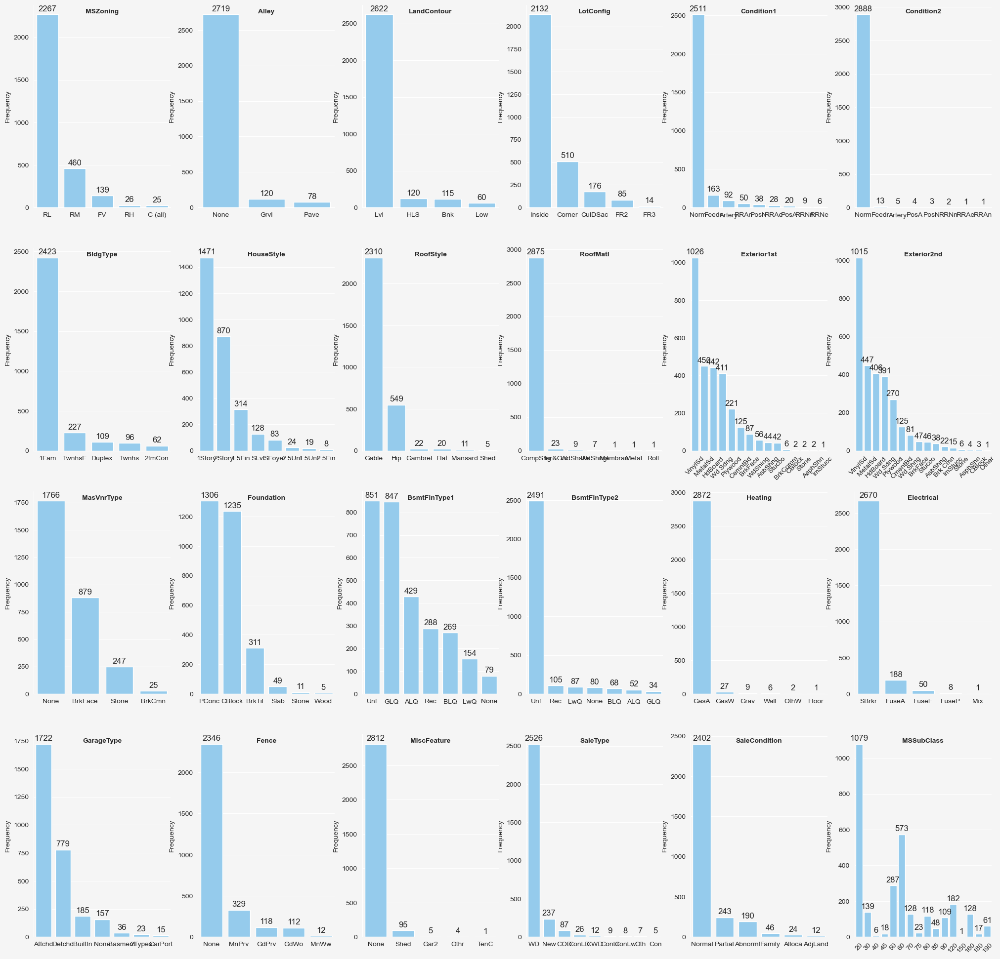

In [153]:
get_cat_dist(full_data,4,6,onehot_cols)

**Interpretation:**

A huge number of categories do not have enough observations. I will write a function to drop them after converting these variables into dummy variables.

In [154]:
# convert variables into dummy variables
full_data_onehot = pd.get_dummies(full_data,columns=onehot_cols)
# filter these onehot vars 
onehot_df = full_data_onehot.iloc[:,51:]

In [155]:
# examine the sample size of these variables
frequency_ser = onehot_df.apply(lambda col:col.sum()).sort_values(ascending=False)
mark = frequency_ser<10
# filter out these onehot variable with small sample
small_sample_onehot = frequency_ser[mark].index
# delete them from full data
full_data_onehot_drop = full_data_onehot.drop(small_sample_onehot,axis=1)

In [156]:
print(full_data_onehot.shape)
print(full_data_onehot_drop.shape)

(2917, 245)
(2917, 203)


### Binninng

Neighborhood has 25 categories. It is not appropriate to directly convert it into dummy variables. So I want to conduct binning on it.

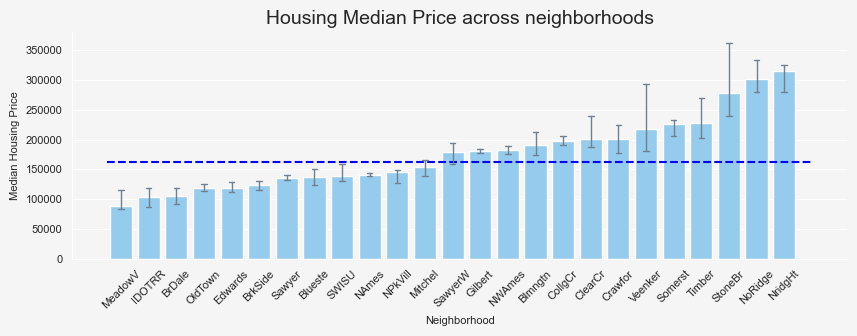

In [157]:
fig,ax = plt.subplots(1,1,figsize=(10,3),dpi=100,facecolor="whitesmoke")
Neigh_da = plot_da.groupby("Neighborhood").agg({"SalePrice":np.median}).reset_index().sort_values(by="SalePrice",ascending=True)
sns.barplot(data=plot_da,x="Neighborhood",y='SalePrice',estimator=np.median,
            order=Neigh_da.Neighborhood,capsize=.2,color="lightskyblue",errcolor="slategrey",errwidth=1,ax=ax)
ax.hlines(y=mean_house_price,xmin=-0.5,xmax=len(Neigh_da),colors="blue",linewidth=1.5,linestyles="dashed")
ax.set_xlabel("Neighborhood",fontsize=8)
ax.set_ylabel("Median Housing Price",fontsize=8)
ax.set_facecolor("whitesmoke")
ax.set_title("Housing Median Price across neighborhoods",fontsize=14)
for spine in ["top","right"]:
    ax.spines[spine].set_visible(False)
plt.tick_params(labelsize=8)
plt.xticks(rotation=45)
plt.show()

**Interpretation:**

- I will convert categories whose median price is below the blue line as 0
- `SawyerW`, `Gilbert`, `NWAmes`, `Blmngtn`, `CollgCr`, `ClearCr`, `Crawfor`, `Veenker`, `Somerst`, and `Timber`  will classified into to the same group. I will assign 1 to the group.
- The last three categories will be collected into one group.

In [158]:
first_group = Neigh_da.Neighborhood.iloc[:12].tolist()
second_group = Neigh_da.Neighborhood.iloc[12:22].tolist()
third_group = Neigh_da.Neighborhood.iloc[-3:].tolist()

def assign_numbers(x):
    if x in first_group:
        return 0
    elif x in second_group:
        return 1
    else:
        return 2

full_data_onehot_drop["Neighborhood"] = full_data_onehot_drop.Neighborhood.apply(lambda x:assign_numbers(x))

## Handle Numbers

In EDA, I found a number of variables whose values span several orders of magnitude. In order to deal with the variablew with the heavy-tailed distribution, *log transform* should be used. It compresses the longer tail of the high end of the distribution into a shorter tail, and expands low end of the distribution inot a longer head.

Now to fully examine the assumptions of linear models, I will check numerical variables in terms of *Normality*, *Homoscedasticity*, *Linearity*, and *Correlation of Error Terms*.

- **Normality**. Linear models assume that residuals of model should be normally distributed. Q-Q plot is an useful tool of checking this.
- **Linearity**. The linear regression model assumes that there is a straight-line relation- ship between the predictors and the response. If the true relationship is far from linear, then virtually all of the conclusions that we draw from the fit are suspect. In addition, the prediction accuracy of the model can be significantly reduced. Residual plots are a useful graphical tool for identifying non-linearity.
- **Homoscedasticity.** The assumption means that the residuals have constant variance at each level of X. If the variances of the error terms may increase with the value of the response. One can identify non-constant variances in the errors, or heteroscedasticity, from the presence of a funnel shape in the residual plot.
- **Correlation of Error Terms.** The next assumption of linear regression is that the residuals are independent. This is mostly relevant when working with time series data. Ideally, we don’t want there to be a pattern among consecutive residuals. For example, residuals shouldn’t steadily grow larger as time goes on. I do not plan examine this assumption.

### Normality

I will use the hisograms and Q-Q plot to examine the assumption.

In [159]:
temp = full_data_onehot_drop.iloc[:,:51]
continuous_vars = [col for col in temp.columns if temp[col].nunique()>20]

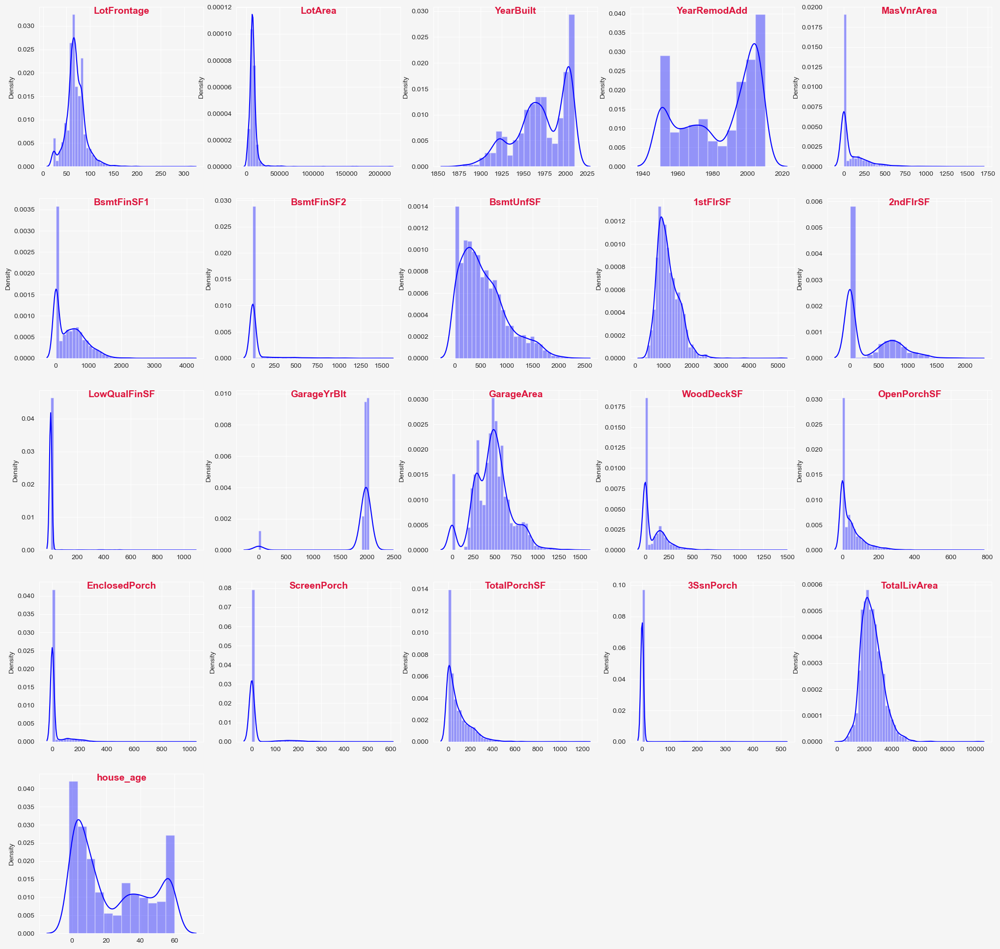

In [160]:
check_dist(5,5,full_data_onehot_drop,continuous_vars,"blue",False,15)

**Interpretation:**

`LotFrontage`, `LotArea`, `MasVnrArea`, `BsmtFinSF1`, `BsmtFinSF2`, `BmstUnfSF`, `1stFlrSF`, `2ndFlrSF`, `LowQualFinSF`, `GarageArea`, `TotalPorchSF`, `TotalLivArea`, `house_age` all show skewed distribution.

**Note: I do not list WoodDeckSF, OpenPorchSF, EclosedPorch, and ScreenPorch because they can be represented by TotalPorchSF.**

Now let's try to use *Log Transform* to transform these variables.

In [161]:
# defind the log_transform function
from scipy import stats

def log_transform(df,col):
    """Perform Log Transformation dataset"""
    
    col_bc = np.log(df[col]+1)
    return col_bc

In [162]:
for_plot = full_data_onehot_drop.copy()
log_cols = ["LotFrontage","LotArea","YearBuilt","YearRemodAdd","MasVnrArea","BsmtUnfSF","BsmtFinSF1","BsmtFinSF2","1stFlrSF","2ndFlrSF",
           "LowQualFinSF","GarageArea","TotalPorchSF","TotalLivArea"]
new_log_cols = []
for col in log_cols:
    newcol = "Log_" + col
    new_log_cols.append(newcol)
    for_plot[newcol] = log_transform(for_plot,col)

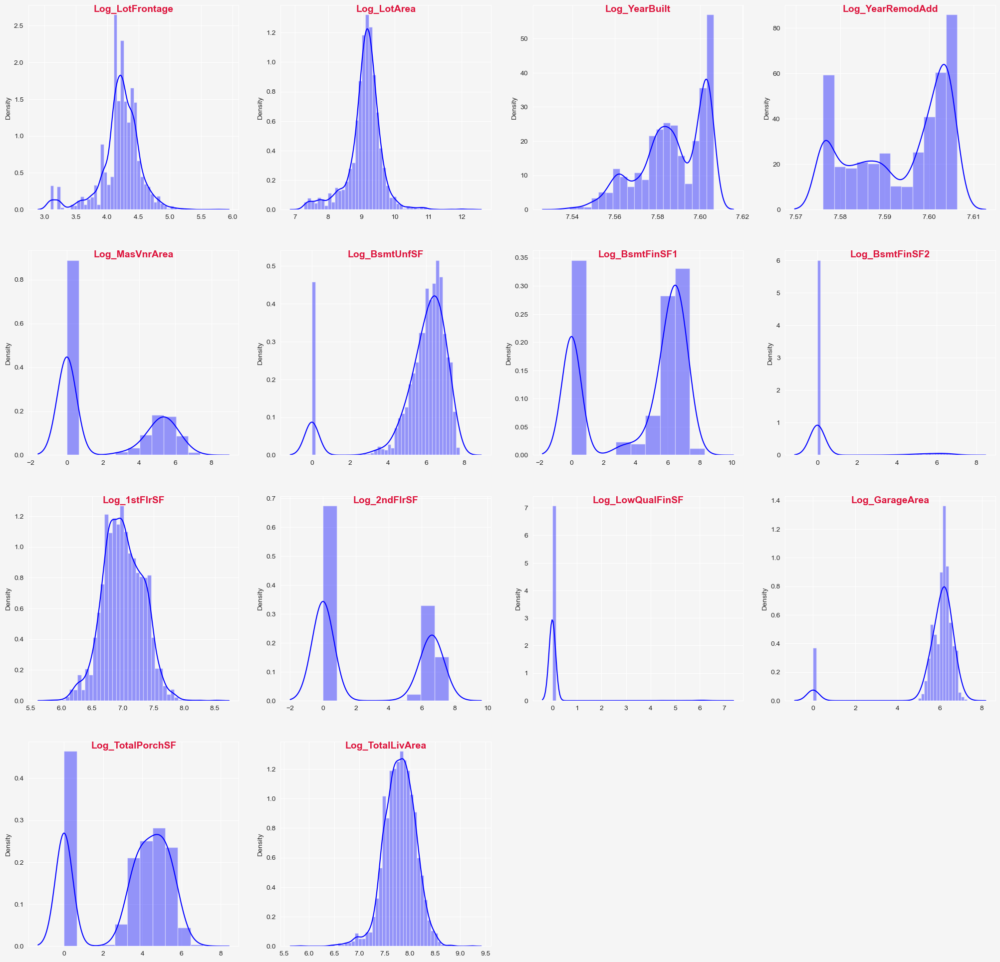

In [163]:
check_dist(4,4,for_plot,new_log_cols,"blue",False,10)

**Interpretation:**

Other than BsmtFinSF2 and LowQualFinSF, other variables can be appropriately transformed so that they can meet with the assumption of normality. Now I will use boxcox, a more powerful transformation algorithm, to adjust the distribution of the two severely skewed variables. 

In addition, the shape of Year variables does not change. So I just leave them unchanged.

In [164]:
# since boxcox only supprt for int variable, so we need to change the data type
for_plot["BsmtFinSF2"] = for_plot["BsmtFinSF2"].astype("int")
for_plot["LowQualFinSF"] = for_plot["LowQualFinSF"].astype("int")

In [165]:
# conduct boxcox transformation
# note: boxbox only support for positive number, so here I add 1
bsmt_bc,param = stats.boxcox(for_plot["BsmtFinSF2"]+1)
for_plot["bc_BsmtFinSF2"] = bsmt_bc

# perform the same transformation on lowqualfinsf
qual_bc,param = stats.boxcox(for_plot["LowQualFinSF"].astype("int")+1)
for_plot["bc_LowQualFinSF"] = qual_bc

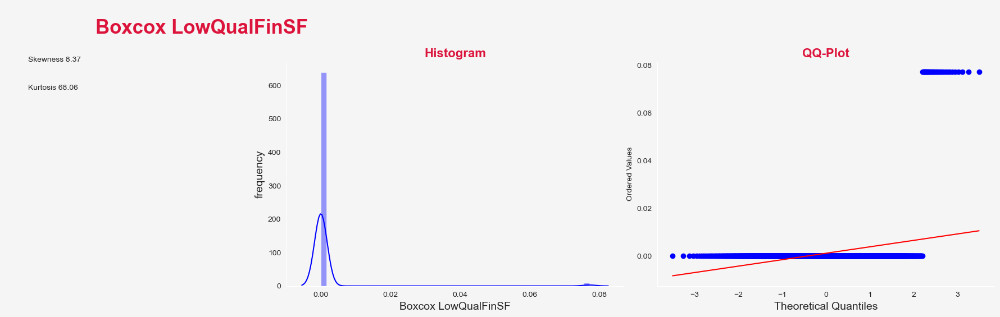

In [166]:
check_normality(for_plot,"bc_LowQualFinSF","Boxcox LowQualFinSF",color="blue")

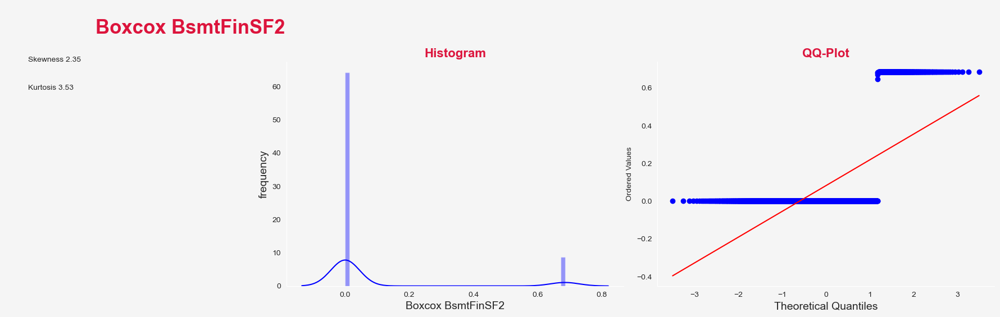

In [167]:
check_normality(for_plot,"bc_BsmtFinSF2","Boxcox BsmtFinSF2",color="blue")

In [168]:
full_data_onehot_drop[["BsmtFinSF2","LowQualFinSF"]].apply(lambda col:(col==0).sum())

BsmtFinSF2      2569
LowQualFinSF    2877
dtype: int64

**Interpretation:**

Since most of values of the two variables are 0, so they still have severe skewness and show bimodal distribution. I will consider deleting the two variables.

In [169]:
# now perform log transform in full data
full_data_onehot_normal = full_data_onehot_drop.copy()
log_cols = ["LotFrontage","LotArea","MasVnrArea","BsmtUnfSF","BsmtFinSF1","1stFlrSF",
           "GarageArea","TotalPorchSF","TotalLivArea"]
new_log_cols = []
for col in log_cols:
    newcol =  "Log_" + col
    new_log_cols.append(newcol)
    full_data_onehot_normal[newcol] = log_transform(full_data_onehot_normal,col)
    full_data_onehot_normal.drop(col,axis=1,inplace=True)

In [170]:
# conduct boxcox transformation
# note: boxbox only support for positive number, so here I add 1
bsmt_bc,param = stats.boxcox(full_data_onehot_normal["BsmtFinSF2"].astype("int")+1)
full_data_onehot_normal["bc_BsmtFinSF2"] = bsmt_bc

# perform the same transformation on lowqualfinsf
qual_bc,param = stats.boxcox(full_data_onehot_normal["LowQualFinSF"].astype("int")+1)
full_data_onehot_normal["bc_LowQualFinSF"] = qual_bc

### Linearity & Homoscedasticity

In [171]:
# filter out the continuous columns from plot_da, which is created for plotting with Sale Price 
temp_cols = [col for col in plot_da.columns if col in continuous_vars]
porch_cols = ["OpenPorchSF","EnclosedPorch","3SsnPorch","ScreenPorch"]
# remove porch cols because we have TotalPorch
temp_cols = [col for col in temp_cols if col not in porch_cols]

In [172]:
# write function to visualize the distribution of variables
def examine_linear_homo(row,col,data,cols,y,color,figsize=25):
    fig,axes = plt.subplots(row,col,figsize=(25,25),dpi=100,facecolor="whitesmoke")
    i = 0

    for r in range(row):
        for c in range(col):
            try:
                sns.residplot(data=data,x=cols[i],y=y,lowess=True,ax=axes[r,c],color=color)
                text_title = cols[i]
                i += 1
                axes[r,c].set_facecolor("whitesmoke")
                axes[r,c].set_title(text_title,fontsize=14,weight="bold")
            except IndexError:
                pass

    # delete all surplus subplots that do not include any graphs
    if row*col > len(cols):
        total_plot_num = row*col
        plot_num = total_plot_num-len(cols)
        for i in reversed(list(range(plot_num))):
            axes[row-1,col-i-1].set_visible(False)
            
    plt.show()

In [173]:
# add the lg_saleprice variable
plot_da = pd.concat([plot_da,lg_y],axis=1)

First, Let's see the residual plots of each predictor vursus SalePrice.

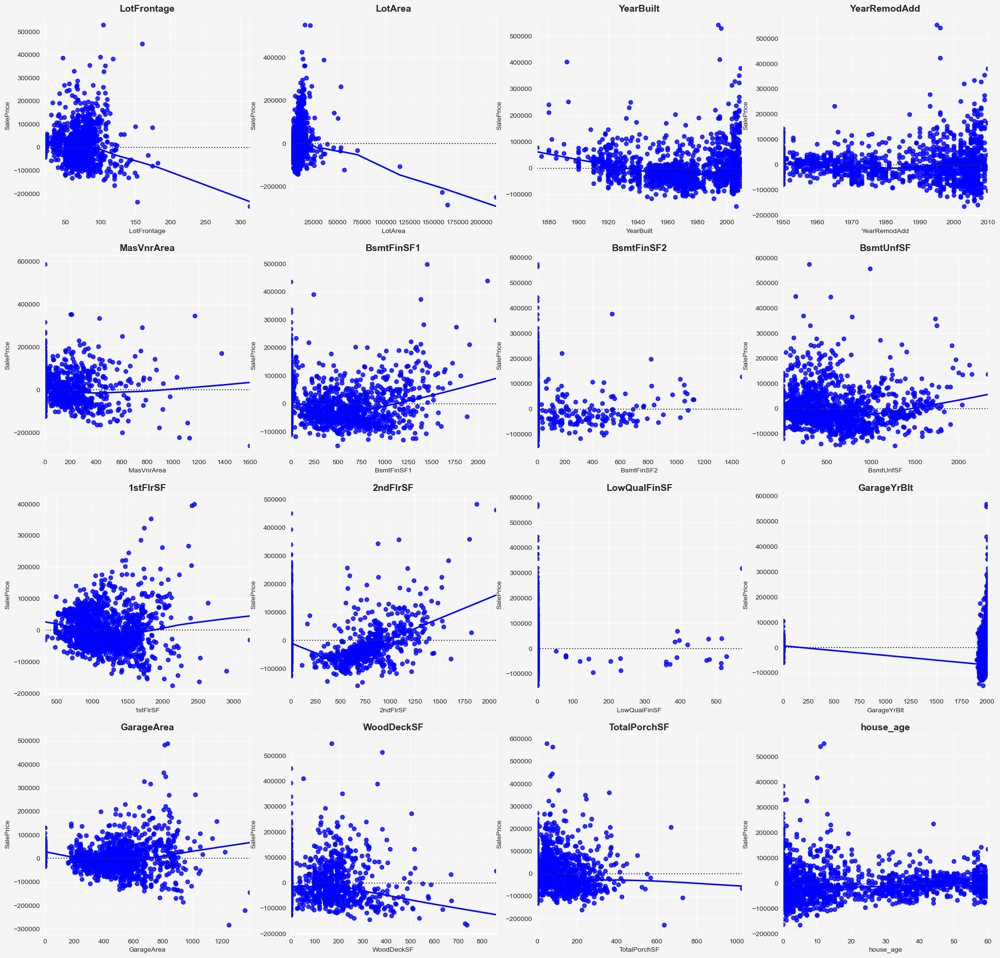

In [174]:
examine_linear_homo(4,4,plot_da,temp_cols,"SalePrice","blue",25)

**Interpretation:**

- The fitted blue line in `2ndFlrSF` displays a U-shape, which provides a strong indicaton of non-linearity in the data. We can see the same pattern in `YearBuild`. **A simple solution to address this non-linear associations is to use the non-linear predictors of $\log{X}, \sqrt{X}, or X^2$, or we can use weighted regression.** (This type of regression assigns a weight to each data point based on the variance of its fitted value. Essentially, this gives small weights to data points that have higher variances, which shrinks their squared residuals. When the proper weights are used, this can eliminate the problem of heteroscedasticity.)
- The variance of error terms increase with the fitted value of `YearBuilt`. Graphically, the residuals display a funnel shape, which indicates heteroscedasticity. The same issue can also be identified in `MasVnrArea`, `1stFlrSF`, `2ndFlrSF`, `GarageArea`, and `TotalPorchSF`. **We can use concave function to transform the response variable, resulting in the great amount of shrinkage of large responses. Hence the heteroscedasticity can be reduced.**

First, let's address the linearity issue. We can examine the change in residuals after **raising a power of 2 to the two variables showing non-linearity.**

In [175]:
temp = plot_da.copy()
temp_cols = ["YearBuilt","2ndFlrSF"]
squared_cols = []
for col in temp_cols:
    squared_col = col+"_squared"
    squared_cols.append(squared_col)
    temp[squared_col] = temp[col]**2

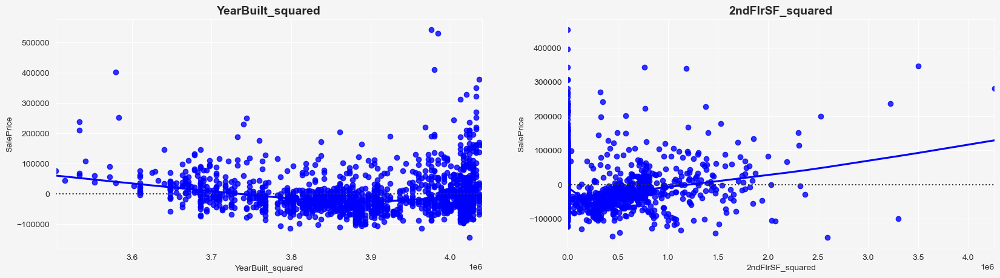

In [176]:
fig,axes = plt.subplots(1,2,figsize=(20,5),dpi=100,facecolor="whitesmoke")
for i in range(2):
    sns.residplot(data=temp,x=squared_cols[i],y="SalePrice",lowess=True,ax=axes[i],color="blue")
    text_title = squared_cols[i]
    axes[i].set_facecolor("whitesmoke")
    axes[i].set_title(text_title,fontsize=14,weight="bold")
plt.show()

**Interpretation:**

After the power transformation, there is little pattern in the residuals of `YearBuilt` and `2ndFlrSF`. If we cannot spot any discerniable pattern, the residuals should have linearity.

Now I will perform log transform on response variable, hoping that the residulas can be constant across fitted value.

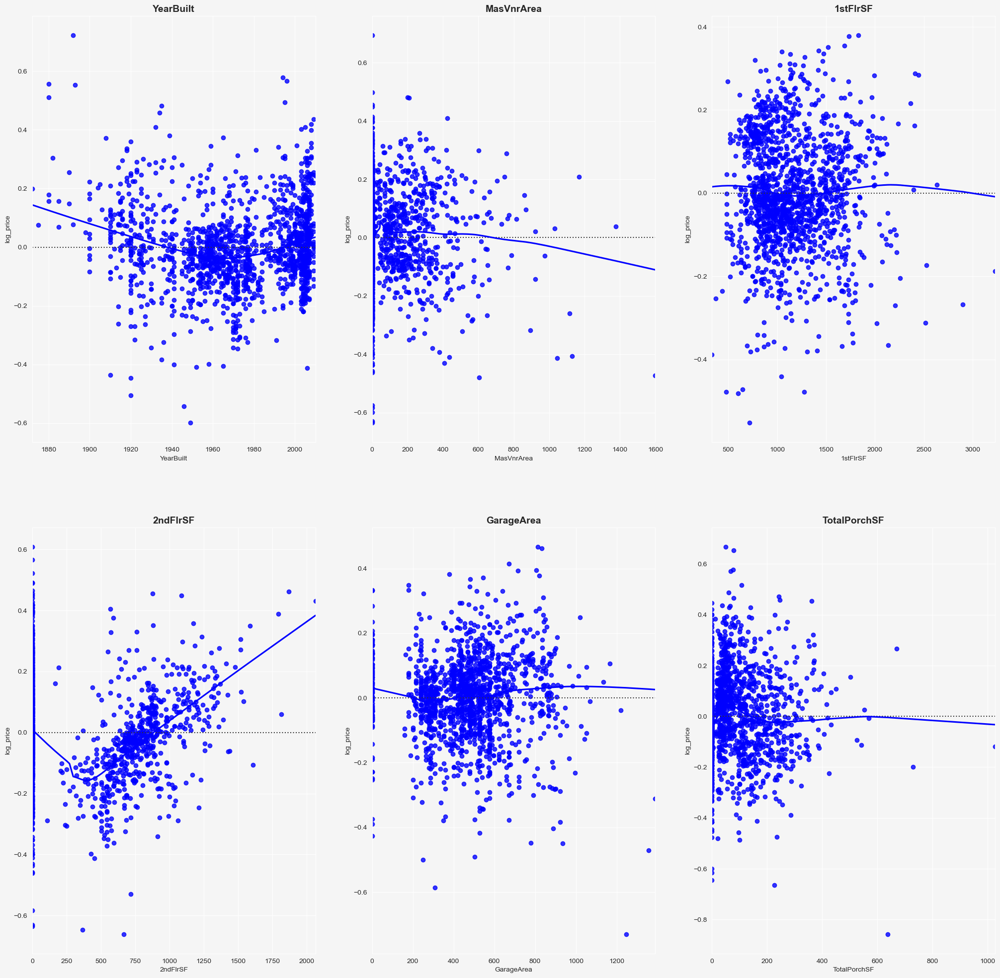

In [177]:
temp["log_price"] = np.log10(temp["SalePrice"])
temp_cols1 = ["YearBuilt","MasVnrArea","1stFlrSF","2ndFlrSF","GarageArea","TotalPorchSF"]
examine_linear_homo(2,3,temp,temp_cols1,"log_price","blue",5)

**Interpretation:**

After log transforming the response variable, the residuals do not get spread out when fitted values become larger, although `2ndFlrSF` displays non-linear association.

Now let me perform both transformations on `2ndFlrSF`.

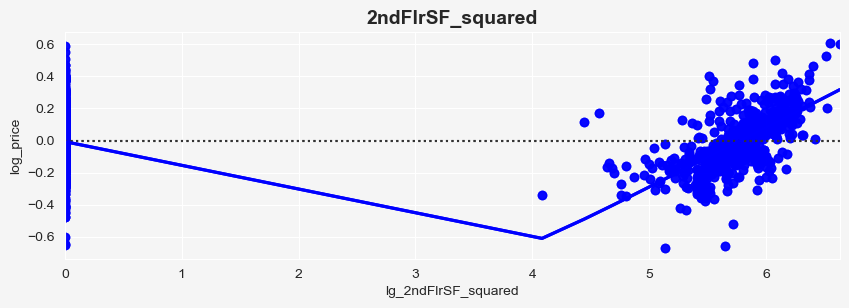

In [178]:
temp["lg_2ndFlrSF_squared"] = np.log10(temp["2ndFlrSF_squared"]+1)
fig,axes = plt.subplots(1,1,figsize=(10,3),dpi=100,facecolor="whitesmoke")
for i in range(2):
    sns.residplot(data=temp,x="lg_2ndFlrSF_squared",y="log_price",lowess=True,ax=axes,color="blue")
    text_title = "2ndFlrSF_squared"
    axes.set_facecolor("whitesmoke")
    axes.set_title(text_title,fontsize=14,weight="bold")
plt.show()

To avoid the issue of bimodal distribution, I will not perform log transformation on the variable.

$\color{crimson}{\bf{\text{Summary:}}}$

I will raise the power of 2 to `YearBuilt` and `2ndFlrSF` to get rid of non-linear associations. Also, I will log transform `SalePrice` to deal with the issue of non-constant variance. 

In [179]:
full_data_onehot_clean = full_data_onehot_normal.copy()
columns_needed_trans = ["YearBuilt","2ndFlrSF"]
squared_cols = []
for col in columns_needed_trans:
    squared_col = col+"_squared"
    squared_cols.append(squared_col)
    full_data_onehot_clean[squared_col] = full_data_onehot_clean[col]**2
    full_data_onehot_clean.drop(col,axis=1,inplace=True)

**Interpretation:**

- After log transformation/boxcox transformation, some variables how approximately normal distribution
- There are some variables with bimodal distribution. Let's use Gaussian Mixture Modeling to add the cluster number for them.

### Gaussian Mixture Modeling

I find that a number of variables show bimodal or multimodal distribution. Therefore, I want to use Gaussian Mixture Model to create clusters numbers for these variables to represent their clusters. But whether the features can be good to performance depends on cross validation.

In [180]:
def get_gmm_class(df,col,n):
    """Get the Gaussian Mixture Model Class"""
    
    from sklearn.mixture import GaussianMixture 
    
    gmm = GaussianMixture(n_components=n,random_state=42)
    gmm.fit(np.array(df[col]).reshape(-1, 1))
    gmm_cluster = gmm.predict(np.array(df[col]).reshape(-1, 1))
    
    return gmm_cluster

In [181]:
# create gaussian mixture class
full_data_onehot_clean["gmm_MasVnrArea"] = get_gmm_class(full_data_onehot_clean,"Log_MasVnrArea",2)
full_data_onehot_clean["gmm_BsmtFinSF2"] = get_gmm_class(full_data_onehot_clean,"bc_BsmtFinSF2",2)
full_data_onehot_clean["gmm_GarageArea"] = get_gmm_class(full_data_onehot_clean,"Log_GarageArea",2)
full_data_onehot_clean["gmm_BsmtUnfSF"] = get_gmm_class(full_data_onehot_clean,"Log_BsmtUnfSF",2)
full_data_onehot_clean["gmm_BsmtFinSF1"] = get_gmm_class(full_data_onehot_clean,"Log_BsmtFinSF1",2)
full_data_onehot_clean["gmm_TotalPorchSF"] = get_gmm_class(full_data_onehot_clean,"Log_TotalPorchSF",2)

## Feature Selection

Since there are a number of variables correlated with each other, which means collinearity exists, I need to exclude some less important variables.

In [182]:
#let's drop the variables that are used for feature extraction
porch_cols = ["WoodDeckSF","OpenPorchSF","EnclosedPorch","ScreenPorch","3SsnPorch"]
full_data_onehot_clean.drop(porch_cols,axis=1,inplace=True)
#plot_da.drop(porch_cols,axis=1,inplace=True)

In [183]:
train_da_engineered = full_data_onehot_clean.iloc[:1458,:]
lg_SalePrice = lg_y.reset_index().drop("index",axis=1).lg_SalePrice
train_da_engineered = pd.concat([train_da_engineered,lg_SalePrice],axis=1)
test_da_engineered = full_data_onehot_clean.iloc[1458:,:]

In [184]:
for_selection = pd.concat([train_da_engineered.iloc[:,:35],train_da_engineered["lg_SalePrice"]],axis=1)
# check the data structure
for_selection.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1458 entries, 0 to 1457
Data columns (total 36 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   YearRemodAdd    1458 non-null   Int64  
 1   BsmtFinSF2      1458 non-null   Float64
 2   LowQualFinSF    1458 non-null   Int64  
 3   GarageYrBlt     1458 non-null   Int64  
 4   Street          1458 non-null   float64
 5   LotShape        1458 non-null   float64
 6   LandSlope       1458 non-null   float64
 7   Neighborhood    1458 non-null   int64  
 8   ExterQual       1458 non-null   float64
 9   ExterCond       1458 non-null   float64
 10  BsmtQual        1458 non-null   float64
 11  BsmtCond        1458 non-null   float64
 12  BsmtExposure    1458 non-null   float64
 13  HeatingQC       1458 non-null   float64
 14  CentralAir      1458 non-null   float64
 15  KitchenQual     1458 non-null   float64
 16  Functional      1458 non-null   float64
 17  FireplaceQu     1458 non-null   f

In [185]:
# get continuous columns
continuous_cols = [col for col in train_da_engineered.columns if train_da_engineered[col].nunique()>20]
discrete_cols = [col for col in for_selection.columns if col not in continuous_cols]
selection_cols = continuous_cols + ["OverallQual","OverallCond","Is_Remod","HavePool","PoolArea","TotalBathRooms",
                                   "TotRmsAbvGrd","IsNew"]


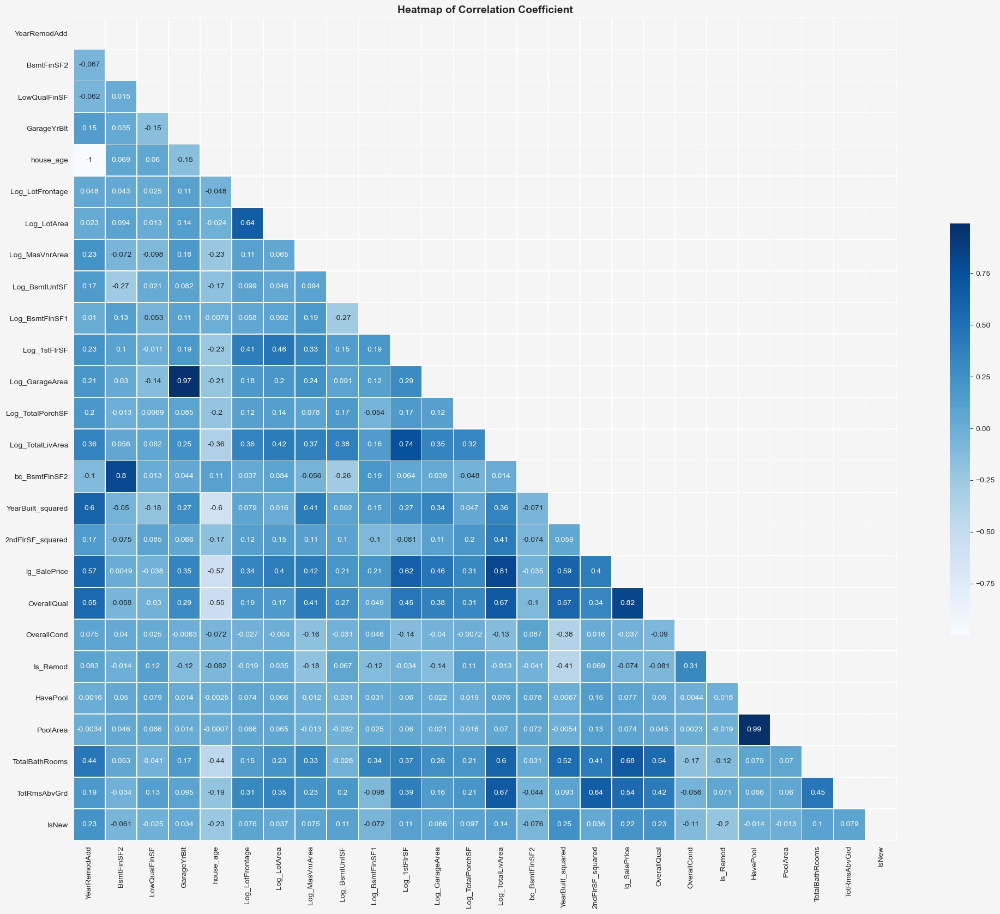

In [186]:
corr_plot(train_da_engineered,selection_cols)

**Interpretation:**

- `YearBuilt` and `YearRemodAdd` are relatively correlated with each other. Also `house_age` is determined by substracting the `YearRemodAdd` from `YrSold`, meaning they are perfectly correlated. In the case, I will drop `YearRemodAdd`.
- `BsmtFinSF2` and `LowQualFinSF` are barely correlated with target variable. So I also drop them.
- `HavePool` are derived from `PoolArea`. I will drop the latter because it is less correlated with the response variable.
- `GarageYrBuilt` is strongly correlated with `Log_GarageArea`. I will drop `GarageYrBuilt` based on the same principle.

In [187]:
train_da_engineered.columns[train_da_engineered.columns.str.contains("gmm_")]

Index(['gmm_MasVnrArea', 'gmm_BsmtFinSF2', 'gmm_GarageArea', 'gmm_BsmtUnfSF',
       'gmm_BsmtFinSF1', 'gmm_TotalPorchSF'],
      dtype='object')

In [188]:
cols_dx = ["YearRemodAdd","LowQualFinSF","bc_LowQualFinSF","TotRmsAbvGrd","bc_LowQualFinSF","BsmtFinSF2","bc_BsmtFinSF2",
           "gmm_BsmtFinSF2","PoolArea","GarageYrBlt","Log_BsmtFinSF1"]
train_da_engineered_dp = train_da_engineered.drop(cols_dx,axis=1)
test_da_engineered_dp = test_da_engineered.drop(cols_dx,axis=1)

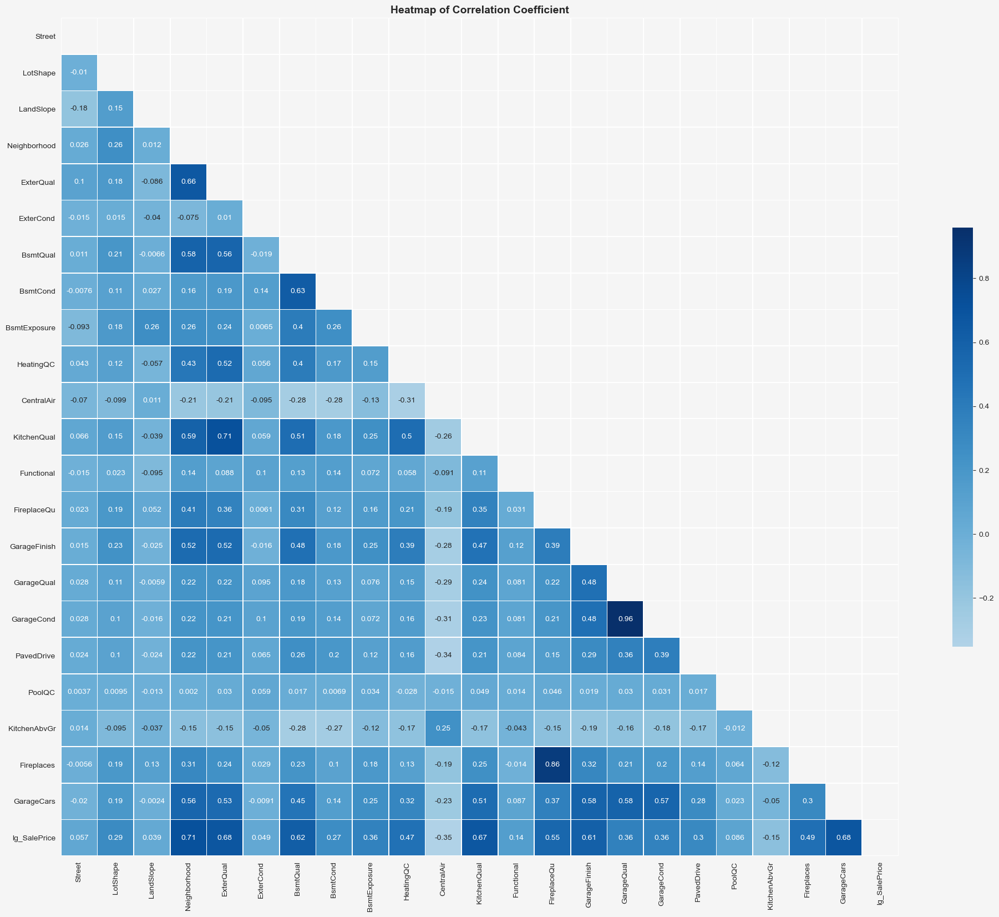

In [189]:
selection_cols1 = [col for col in for_selection.columns if col not in selection_cols] + ["lg_SalePrice"]
corr_plot(train_da_engineered,selection_cols1)

In [190]:
cols_dx1 = ["Fireplaces","GarageCond"]
train_da_selected = train_da_engineered_dp.drop(cols_dx1,axis=1)
test_da_selected = test_da_engineered_dp.drop(cols_dx1,axis=1)

In [191]:
print(train_da_selected.shape)
print(test_da_selected.shape)

(1458, 195)
(1459, 194)


# Model Selection

Before data modeling, we can eaisly find that existing variables are not on the same scale. Models that are the smooth functions of the input, such as linear regression or logistic regression, are affected by the scale of the input. To change the scales of features, I will conduct **robust feature scaling.**

In [192]:
from sklearn.model_selection import train_test_split

X = train_da_selected.drop("lg_SalePrice",axis=1)
y = train_da_selected["lg_SalePrice"]

# split data into train set and test set
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.25,random_state=42)
print(X_train.shape,X_test.shape,y_train.shape,y_test.shape)

X_train_full = X_train.copy()
X_test_full = X_test.copy()

(1093, 194) (365, 194) (1093,) (365,)


In [193]:
unit_cols = X_train_full.dtypes[X_train_full.dtypes == "uint8"].index
X_train_full[unit_cols] = X_train_full[unit_cols].astype("int")
X_test_full[unit_cols] = X_test_full[unit_cols].astype("int")
test_da_selected[unit_cols] = test_da_selected[unit_cols].astype("int")
cols_ = ["OverallQual","OverallCond","KitchenAbvGr","GarageCars","HavePool","house_age","TotalBathRooms",
 "Log_LotFrontage","Log_GarageArea","Log_MasVnrArea","Log_BsmtUnfSF","Log_TotalLivArea","YearBuilt_squared","2ndFlrSF_squared"]
for col in cols_:
    X_train_full[col] = X_train_full[col].astype("float")
    X_test_full[col] = X_test_full[col].astype("float")
    test_da_selected[col] = test_da_selected[col].astype("float")
    

## Data Modelling

In [202]:
from sklearn.preprocessing import RobustScaler
from sklearn.pipeline import make_pipeline,Pipeline
from sklearn.linear_model import Lasso, ElasticNet
from sklearn.model_selection import cross_val_score,cross_val_predict, KFold
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
import xgboost as xgb

seed = 42
lasso = make_pipeline(RobustScaler(),Lasso(normalize=False,random_state=seed,max_iter=10000))
Enet = make_pipeline(RobustScaler(),ElasticNet(normalize=False,random_state=seed,max_iter=10000))
forest = RandomForestRegressor(random_state=seed,max_features="sqrt")
gbrt = GradientBoostingRegressor(random_state=seed,max_features="sqrt")
xgb_rg = xgb.XGBRegressor(random_state=seed)
models = [
    ("lasso",lasso),
    ("ElasticNet",elastic_net),
    ("Random Forest",forest),
    ("GradientBoosting",gbrt),
    ("XGBoost",xgb_rg)
]

In [195]:
def get_scores(model,x,y,scoring="neg_mean_squared_error",n_folds=10):
    """display a set of statistics for model"""    
    kf = KFold(n_folds, shuffle=True, random_state=seed).get_n_splits(x.values)
    scores = -cross_val_score(model,x,y,scoring="neg_mean_squared_error",cv=kf)
    return scores

In [196]:
def get_scores_frame(models,x,y,n_folds):
    names = []
    results = []
    for name,model in models:
        scores = get_scores(model,x,y,n_folds)
        names.append(name)
        results.append(scores)

    # wrap results into dataframe
    scores_df = pd.DataFrame(results).T
    scores_df.columns = names
    
    return scores_df

scores = get_scores_frame(models,X_train_full,y_train,n_folds=10)

In [197]:
scores.apply(lambda x:x.mean())

lasso              0.159280
ElasticNet         0.157930
Random Forest      0.020043
GradientBoosting   0.016459
XGBoost            0.017776
dtype: float64

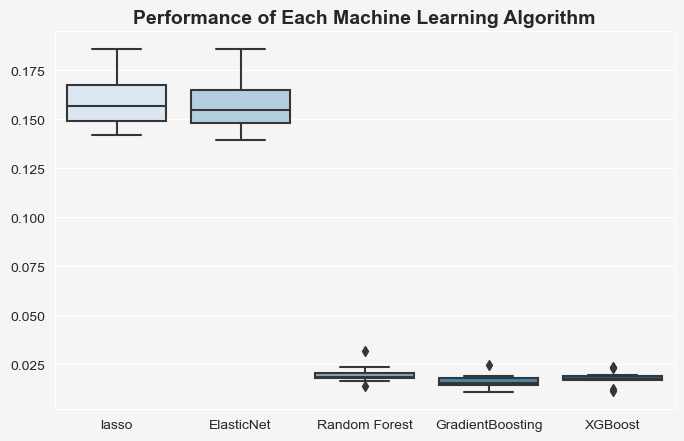

In [198]:
# visualize the scores of each model
fig,ax = plt.subplots(1,1,figsize=(8,5),dpi=100,facecolor="whitesmoke")
sns.boxplot(data=scores,ax=ax,palette="Blues")
ax.set_xticklabels(scores.columns)
ax.set_facecolor("whitesmoke")
ax.set_title("Performance of Each Machine Learning Algorithm",fontsize=14,weight="bold")
plt.show()

Let's see the feature importance of each variable in Random Forest

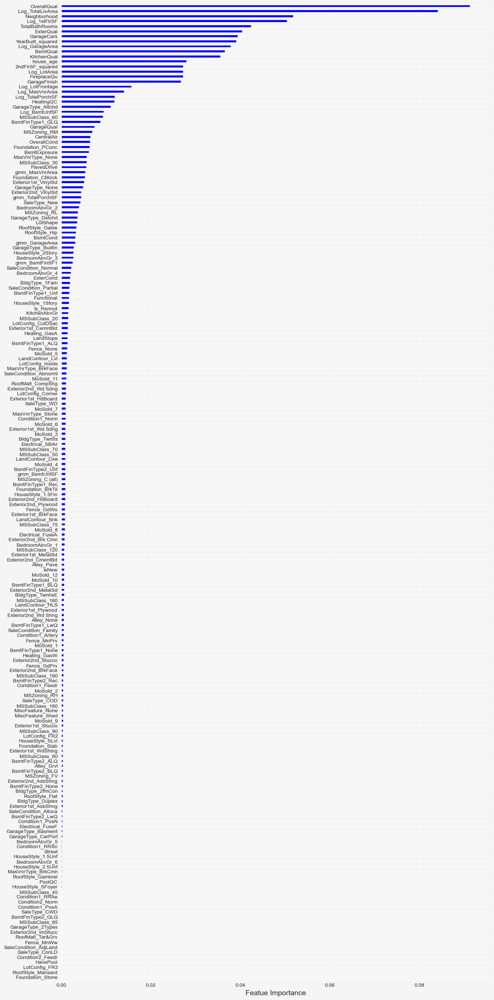

In [415]:
forest.fit(X_train_full,y_train)
fig,ax = plt.subplots(1,1,figsize=(15,35),dpi=100,facecolor="whitesmoke")
featureImportance_ser = pd.Series(forest.feature_importances_,index=X_train_full.columns).sort_values(ascending=True)
featureImportance_ser.plot(kind="barh",ax=ax,color="Blue")
ax.set_xlabel("Featue Importance",fontsize=14)
ax.set_facecolor("whitesmoke")
for spine in ["right","top"]:
    ax.spines[spine].set_visible(False)
plt.tick_params(labelsize=10)
plt.show()

In [201]:
def cross_validation_eval(model,x,y,IsTrain=True):
    scores =cross_val_score(model,x,y,cv=10,scoring="neg_mean_squared_error")
    rmse_scores = np.sqrt(-scores)
    if IsTrain:
        print("Train Set RMSE: ")
        print("----------------------------")
        print("Mean RMSE: {0}".format(round(rmse_scores.mean(),6)))
        print("STD RMSE: {0}".format(round(rmse_scores.std(),6)))
    else:
        print("Test Set RMSE: ")
        print("----------------------------")
        print("Mean RMSE: {0}".format(round(rmse_scores.mean(),6)))
        print("STD RMSE: {0}".format(round(rmse_scores.std(),6)))

Now we examine the performance of models using test set.

In [203]:
cross_validation_eval(lasso,X_train_full,y_train,False)
cross_validation_eval(Enet,X_train_full,y_train,False)
cross_validation_eval(forest,X_train_full,y_train,False)
cross_validation_eval(gbrt,X_train_full,y_train,False)
cross_validation_eval(xgb_rg,X_train_full,y_train,False)

Test Set RMSE: 
----------------------------
Mean RMSE: 0.39875
STD RMSE: 0.016678
Test Set RMSE: 
----------------------------
Mean RMSE: 0.397019
STD RMSE: 0.017482
Test Set RMSE: 
----------------------------
Mean RMSE: 0.140731
STD RMSE: 0.015429
Test Set RMSE: 
----------------------------
Mean RMSE: 0.127589
STD RMSE: 0.01342
Test Set RMSE: 
----------------------------
Mean RMSE: 0.132562
STD RMSE: 0.014251


The test error is much higher than train error, indicating these models have very severe issue of overfitting. Our models perform well on only train set but very bad on new cases. So I need to regularize these models so as to reduce variance at the expense of bias so that models can make good prediction in the long run.

## Grid Search

Now I conduct grid search for all base models.

In [204]:
def display_grid_search_res(gs_result):
    cvres = gs_result.cv_results_
    mean_score_list = []
    params_list = []
    for mean_score, params in zip(cvres["mean_test_score"], cvres["params"]):
        mean_score_list.append(np.sqrt(-mean_score))
        params_list.append(params)

    gs_df = pd.DataFrame(mean_score_list,index=params_list).reset_index()
    gs_df.columns = ["param","mean_root_squared_error"]
    mark = gs_df["mean_root_squared_error"] ==  gs_df["mean_root_squared_error"].min()
    print(gs_df[mark].mean_root_squared_error.values)
    print(gs_df[mark].param.values)

In [205]:
def display_result(gs):
    print("Best Score".format(gs.best_score_))
    print("Best Estimator".format(gs.best_estimator_))

In [207]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

# Lasso Regression
grid_param_lasso = {'alpha': (np.logspace(-10, 10,100))}
grid_search_lasso = GridSearchCV(Lasso(normalize=True,random_state=42),grid_param_lasso,scoring="neg_mean_squared_error",cv=10,verbose=0)
lasso_result = grid_search_lasso.fit(X_train_full,y_train)

# Elastic Net
grid_param_elastic_net = {'alpha': (np.logspace(-10, 10,100)),"l1_ratio":np.arange(0,1,0.1)}
grid_search_elastic_net = GridSearchCV(ElasticNet(normalize=True,random_state=42),grid_param_elastic_net,scoring="neg_mean_squared_error",cv=10,verbose=0)
en_result = grid_search_elastic_net.fit(X_train_full,y_train)

Let's visualizae the results.

In [218]:
display_grid_search_res(lasso_result)
display_grid_search_res(en_result)

[0.1196607]
[{'alpha': 0.00011497569953977356}]
[0.1198394]
[{'alpha': 0.00011497569953977356, 'l1_ratio': 0.9}]


### Gradient Boosting Hyperparameter Tuning

In [ ]:
param_grid_gb = {
    "n_estimators":np.arange(100,1100,100),
    "max_features":[12],
    "max_depth":np.arange(1,12)
}
grid_search_gb = GridSearchCV(GradientBoostingRegressor(random_state=42),param_grid_gb,scoring="neg_mean_squared_error",cv=5,verbose=0)
gb_result = grid_search_gb.fit(X_train_full,y_train)

In [212]:
display_grid_search_res(gb_result)

[0.12131009]
[{'max_depth': 3, 'max_features': 12, 'n_estimators': 400}]


In [214]:
param_grid_gb1 = {
    "n_estimators":[400],
    "max_features":[12],
    "learning_rate":np.arange(0,1,0.01),
    "max_depth":[3],
    "min_samples_split":np.arange(2,11)
}

grid_search_gb1 = GridSearchCV(GradientBoostingRegressor(random_state=42),param_grid_gb1,scoring="neg_mean_squared_error",cv=5,verbose=0)
gb_result1 = grid_search_gb1.fit(X_train_full,y_train)

In [215]:
display_grid_search_res(gb_result1)

[0.11869291]
[{'learning_rate': 0.07, 'max_depth': 3, 'max_features': 12, 'min_samples_split': 8, 'n_estimators': 400}]


### XGBoost Hyperparameter Tuning

- `max_depth` is the maximum number of nodes allowed from the root to the farthest leaf of a tree. Deeper trees can model more complex relationships by adding more nodes, but as we go deeper, splits become less relevant and are sometimes only due to noise, causing the model to overfit.
- `min_child_weight` is the minimum weight (or number of samples if all samples have a weight of 1) required in order to create a new node in the tree. A smaller min_child_weight allows the algorithm to create children that correspond to fewer samples, thus allowing for more complex trees, but again, more likely to overfit.
- `eta`, which means learning rate, can shrink the feature weights to make the boosting process more conservative.
- ``

First we create Dmatrices

In [220]:
import xgboost as xgb
dtrain = xgb.DMatrix(X_train_full, label=y_train)
dtest = xgb.DMatrix(X_test_full, label=y_test)

The result shows that the prediction is, on average,1.37 off the actual sale price of a house. 

In [221]:
params = {
    'max_depth':6,
    'min_child_weight': 1,
    'eta':.3,
    'subsample': 1,
    'colsample_bytree': 1,
    'objective':'reg:linear',
}

In [222]:
num_boost_round = 999
cv_results = xgb.cv(
    params,
    dtrain,
    num_boost_round=num_boost_round,
    seed=42,
    nfold=5,
    metrics={'mae'},
    early_stopping_rounds=10
)
cv_results["test-mae-mean"].min()

[14:49:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c09

0.0944594

Now let's tune other parameters. I first define ranges for `max_depth` and `min_child_weight`. And I will use cross validation to find the optimal combination.

In [223]:
min_mae = float("Inf")
gridsearch_params = [
    (max_depth, min_child_weight)
    for max_depth in range(1,12)
    for min_child_weight in range(1,10)
]

for max_depth,min_child_weight in gridsearch_params:
    
    # update the parameters in params grid
    params["max_depth"] = max_depth
    params["min_child_weight"] = min_child_weight
    
    # run cv
    cv_results = xgb.cv(
        params,
        dtrain,
        num_boost_round=num_boost_round,
        seed=42,
        nfold=5,
        metrics={'mae'},
        early_stopping_rounds=10
    )
    
    # Update best MAE
    mean_mae = cv_results['test-mae-mean'].min()
    boost_rounds = cv_results['test-mae-mean'].argmin()
    print("\tMAE {} for {} rounds".format(mean_mae, boost_rounds))
    if mean_mae < min_mae:
        min_mae = mean_mae
        best_params = (max_depth,min_child_weight)
        
print("Best params: {}, {}, MAE: {}".format(best_params[0], best_params[1], min_mae))

[14:49:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:09] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c09

	MAE 0.085855 for 341 rounds
[14:49:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:20] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:20] WARNING: /opt/concourse/worker/volumes/live/7a2b

	MAE 0.0860408 for 77 rounds
[14:49:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:25] WARNING: /opt/concourse/worker/volumes/live/7a2b

	MAE 0.0878518 for 80 rounds
[14:49:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:31] WARNING: /opt/concourse/worker/volumes/live/7a2b

	MAE 0.08879200000000001 for 52 rounds
[14:49:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:35] WARNING: /opt/concourse/worker/volumes

	MAE 0.09168480000000001 for 45 rounds
[14:49:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:39] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:39] WARNING: /opt/concourse/worker/volumes

	MAE 0.093729 for 30 rounds
[14:49:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:44] WARNING: /opt/concourse/worker/volumes/live/7a2b9

	MAE 0.09265680000000001 for 30 rounds
[14:49:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:49] WARNING: /opt/concourse/worker/volumes

	MAE 0.0938842 for 34 rounds
[14:49:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:54] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:49:54] WARNING: /opt/concourse/worker/volumes/live/7a2b

	MAE 0.09342360000000001 for 38 rounds
[14:50:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:50:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:50:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:50:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:50:00] WARNING: /opt/concourse/worker/volumes

	MAE 0.092839 for 37 rounds
[14:50:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:50:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:50:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:50:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:50:06] WARNING: /opt/concourse/worker/volumes/live/7a2b9

	MAE 0.09401040000000001 for 33 rounds
[14:50:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:50:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:50:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:50:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:50:12] WARNING: /opt/concourse/worker/volumes

	MAE 0.09531279999999999 for 34 rounds
[14:50:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:50:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:50:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:50:18] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:50:18] WARNING: /opt/concourse/worker/volumes

	MAE 0.09720520000000002 for 37 rounds
[14:50:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:50:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:50:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:50:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[14:50:27] WARNING: /opt/concourse/worker/volumes

Based on the result, we update the value of the two parameters.

In [225]:
# based 
params["max_depth"] = 2
params["min_child_weight"] = 7

**Adjust Parameters `subsample` and `colsample_bytree`**

Those parameters control the sampling of the dataset that is done at each boosting round.
Instead of using the whole training set every time, we can build a tree on slightly different data at each step, which makes it less likely to overfit to a single sample or feature.

- `Subsample` refers to the ratio of the training instances. Setting it to 0.5 means that XGBoost would randomly sample half of the training data prior to growing trees. and this will prevent overfitting. Subsampling will occur once in every boosting iteration.(range: (0,1])
- `colsample_bytree` corresponds to the fraction of features (the columns) to use. By default it is set to 1 meaning that we will use all features.


In [226]:
min_mae = float("Inf")
gridsearch_params = [
    (subsample, colsample)
    for subsample in [i/10. for i in range(1,11)]
    for colsample in [i/10. for i in range(1,11)]
]


for subsample,colsample in gridsearch_params:
    
    # update the parameters in params grid
    params["subsample"] = subsample
    params["colsample_bytree"] = colsample
    
    # run cv
    cv_results = xgb.cv(
        params,
        dtrain,
        num_boost_round=num_boost_round,
        seed=42,
        nfold=5,
        metrics={'mae'},
        early_stopping_rounds=10
    )
    
    # Update best MAE
    mean_mae = cv_results['test-mae-mean'].min()
    boost_rounds = cv_results['test-mae-mean'].argmin()
    print("\tMAE {} for {} rounds".format(mean_mae, boost_rounds))
    if mean_mae < min_mae:
        min_mae = mean_mae
        best_params = (subsample,colsample)
        
print("Best params: {}, {}, MAE: {}".format(best_params[0], best_params[1], min_mae))

[15:39:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:39:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:39:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:39:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:39:58] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c09

[15:40:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:00] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c09

	MAE 0.10340200000000002 for 45 rounds
[15:40:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:03] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:03] WARNING: /opt/concourse/worker/volumes

	MAE 0.0990918 for 77 rounds
[15:40:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:05] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:05] WARNING: /opt/concourse/worker/volumes/live/7a2b

	MAE 0.0983604 for 70 rounds
[15:40:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:08] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:08] WARNING: /opt/concourse/worker/volumes/live/7a2b

	MAE 0.0928926 for 61 rounds
[15:40:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:11] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:11] WARNING: /opt/concourse/worker/volumes/live/7a2b

	MAE 0.0951364 for 79 rounds
[15:40:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:14] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:14] WARNING: /opt/concourse/worker/volumes/live/7a2b

	MAE 0.0917278 for 83 rounds
[15:40:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:17] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:17] WARNING: /opt/concourse/worker/volumes/live/7a2b

	MAE 0.091934 for 70 rounds
[15:40:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9

	MAE 0.08751060000000001 for 96 rounds
[15:40:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:25] WARNING: /opt/concourse/worker/volumes

	MAE 0.08950739999999999 for 96 rounds
[15:40:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:28] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:28] WARNING: /opt/concourse/worker/volumes

	MAE 0.08746400000000001 for 89 rounds
[15:40:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:32] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:32] WARNING: /opt/concourse/worker/volumes

	MAE 0.08671419999999999 for 93 rounds
[15:40:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:35] WARNING: /opt/concourse/worker/volumes

	MAE 0.09052600000000001 for 124 rounds
[15:40:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:40] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:40:40] WARNING: /opt/concourse/worker/volume

	MAE 0.08523359999999999 for 90 rounds
Best params: 1.0, 1.0, MAE: 0.08523359999999999


In [227]:
# update the two parameters
params["subsample"] = 1
params["colsample_bytree"] = 1

The result shows that we just keep the original value of the two parameters. Now let's tune the value of learning rate `eta`.

`eta` controls the learning rate. It can shrink the feature weights to make the boosting process more conservative. Lower learning rate can make our model more robust to overfitting and thus we need more rounds of boosting to find the optimal value.

In [229]:
import time
# This can take some time…
min_mae = float("Inf")
best_params = None
start_time = time.time()

for eta in np.arange(0,1,0.01):
    print("CV with eta={}".format(eta))
    # We update our parameters
    params['eta'] = eta
    # Run and time CV
    cv_results = xgb.cv(
        params,
        dtrain,
        num_boost_round=num_boost_round,
        seed=42,
        nfold=5,
        metrics=['mae'],
        early_stopping_rounds=10)
    
    # Update best score
    mean_mae = cv_results['test-mae-mean'].min()
    boost_rounds = cv_results['test-mae-mean'].argmin()
    print("\tMAE {} for {} rounds\n".format(mean_mae, boost_rounds))
    if mean_mae < min_mae:
        min_mae = mean_mae
        best_params = eta
end_time = time.time()
print(end_time - start_time)
print("Best params: {}, MAE: {}".format(best_params, min_mae))

CV with eta=0.0
[15:44:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:44:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:44:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:44:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:44:25] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451

	MAE 0.08276399999999999 for 381 rounds

CV with eta=0.07
[15:44:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:44:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:44:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:44:50] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:44:50] WARNING: /opt/conco

	MAE 0.084431 for 163 rounds

CV with eta=0.14
[15:45:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:01] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:01] WARNING: /opt/concourse/worker

	MAE 0.0856682 for 128 rounds

CV with eta=0.21
[15:45:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:07] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:07] WARNING: /opt/concourse/worke

	MAE 0.08677019999999999 for 104 rounds

CV with eta=0.28
[15:45:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:12] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:12] WARNING: /opt/conco

	MAE 0.088513 for 66 rounds

CV with eta=0.35000000000000003
[15:45:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:15] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:15] WARNING: /opt/co

	MAE 0.0900184 for 70 rounds

CV with eta=0.42
[15:45:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:19] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:19] WARNING: /opt/concourse/worker

	MAE 0.09248540000000001 for 93 rounds

CV with eta=0.49
[15:45:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:23] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:23] WARNING: /opt/concou

	MAE 0.09555539999999998 for 71 rounds

CV with eta=0.56
[15:45:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:27] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:27] WARNING: /opt/concou

	MAE 0.09993239999999999 for 75 rounds

CV with eta=0.63
[15:45:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:31] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:31] WARNING: /opt/concou

	MAE 0.10300659999999999 for 41 rounds

CV with eta=0.7000000000000001
[15:45:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:35] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:35] WARNIN

	MAE 0.10875660000000001 for 41 rounds

CV with eta=0.77
[15:45:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:38] WARNING: /opt/concou

	MAE 0.10528059999999999 for 43 rounds

CV with eta=0.84
[15:45:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:42] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:42] WARNING: /opt/concou

	MAE 0.10972200000000001 for 47 rounds

CV with eta=0.91
[15:45:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:45] WARNING: /opt/concou

	MAE 0.11532040000000002 for 36 rounds

CV with eta=0.98
[15:45:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:45:48] WARNING: /opt/concou

In [230]:
params["eta"] = 0.07
params

{'max_depth': 2,
 'min_child_weight': 7,
 'eta': 0.07,
 'subsample': 1,
 'colsample_bytree': 1,
 'objective': 'reg:linear'}

I have completed the grid search of all models. Now I will train these models using the best parameters. Here I exclude random forest because of its poor performance.

In [231]:
# lasso regression
lasso = make_pipeline(RobustScaler(),Lasso(alpha=0.00011497569953977356,normalize=False,random_state=seed,max_iter=10000))
enet = make_pipeline(RobustScaler(),ElasticNet(alpha=0.00011497569953977356,l1_ratio=0.9,normalize=False,random_state=seed,max_iter=10000))
gb = GradientBoostingRegressor(learning_rate=0.07,max_depth=3,max_features=12,min_samples_split=8,n_estimators=400)
XG_reg = xgb.XGBRegressor(max_depth=2,min_child_weight=7,eta=0.07,subsample=1,colsample_bytree=1,objective="reg:linear",random_state=seed)

In [232]:
lasso.fit(X_train_full,y_train)
enet.fit(X_train_full,y_train)
gb.fit(X_train_full,y_train)
XG_reg.fit(X_train_full,y_train)

[15:49:26] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, eta=0.07, gamma=0,
             gpu_id=-1, importance_type='gain', interaction_constraints='',
             learning_rate=0.0700000003, max_delta_step=0, max_depth=2,
             min_child_weight=7, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=8, num_parallel_tree=1,
             objective='reg:linear', random_state=42, reg_alpha=0, reg_lambda=1,
             scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

**Lasso Regression**

In [233]:
cross_validation_eval(lasso,X_train_full,y_train,True)
cross_validation_eval(lasso,X_test_full,y_test,False)

Train Set RMSE: 
----------------------------
Mean RMSE: 0.119896
STD RMSE: 0.013267
Test Set RMSE: 
----------------------------
Mean RMSE: 0.14154
STD RMSE: 0.034469


**Elastic Net**

In [235]:
cross_validation_eval(enet,X_train_full,y_train)
cross_validation_eval(enet,X_test_full,y_test,False)

Train Set RMSE: 
----------------------------
Mean RMSE: 0.120211
STD RMSE: 0.013282
Test Set RMSE: 
----------------------------
Mean RMSE: 0.143267
STD RMSE: 0.034233


**Gradient Boosting**

In [236]:
cross_validation_eval(gb,X_train_full,y_train,True)
cross_validation_eval(gb,X_test_full,y_test,False)

Train Set RMSE: 
----------------------------
Mean RMSE: 0.118903
STD RMSE: 0.01343
Test Set RMSE: 
----------------------------
Mean RMSE: 0.127619
STD RMSE: 0.032732


**XGBoost**

In [237]:
cross_validation_eval(XG_reg,X_train_full,y_train)
cross_validation_eval(XG_reg,X_test_full,y_test,False)

[15:51:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:51:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:51:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:51:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[15:51:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c09

$\color{crimson}{\text{We still suffer from overfitting.}}$ So I will impose more severe penalty on models

In [ ]:
lasso = make_pipeline(RobustScaler(),Lasso(alpha=0.0006,normalize=False,random_state=seed,max_iter=10000))
cross_validation_eval(lasso,X_train_full,y_train,True)
cross_validation_eval(lasso,X_test_full,y_test,False)

In [291]:
enet = make_pipeline(RobustScaler(),ElasticNet(alpha=0.00231,l1_ratio=0.2,normalize=False,random_state=seed,max_iter=10000))
cross_validation_eval(enet,X_train_full,y_train,True)
cross_validation_eval(enet,X_test_full,y_test,False)

Train Set RMSE: 
----------------------------
Mean RMSE: 0.117861
STD RMSE: 0.014964
Test Set RMSE: 
----------------------------
Mean RMSE: 0.117613
STD RMSE: 0.026797


In [293]:
param_grid_gb2 = {
    "n_estimators":[120],
    "max_depth":[2],
    "min_samples_split":np.arange(4,11),
    "min_samples_leaf":np.arange(3,50,2),
}

grid_search_gb2 = GridSearchCV(GradientBoostingRegressor(max_features="sqrt",random_state=42),param_grid_gb2,scoring="neg_mean_squared_error",cv=3,verbose=0)
gb_result2 = grid_search_gb2.fit(X_train_full,y_train)

In [295]:
display_grid_search_res(gb_result2)

[0.13309365 0.13309365 0.13309365 0.13309365 0.13309365 0.13309365
 0.13309365]
[{'max_depth': 2, 'min_samples_leaf': 7, 'min_samples_split': 4, 'n_estimators': 120}
 {'max_depth': 2, 'min_samples_leaf': 7, 'min_samples_split': 5, 'n_estimators': 120}
 {'max_depth': 2, 'min_samples_leaf': 7, 'min_samples_split': 6, 'n_estimators': 120}
 {'max_depth': 2, 'min_samples_leaf': 7, 'min_samples_split': 7, 'n_estimators': 120}
 {'max_depth': 2, 'min_samples_leaf': 7, 'min_samples_split': 8, 'n_estimators': 120}
 {'max_depth': 2, 'min_samples_leaf': 7, 'min_samples_split': 9, 'n_estimators': 120}
 {'max_depth': 2, 'min_samples_leaf': 7, 'min_samples_split': 10, 'n_estimators': 120}]


Now let's confirm the value of `max_depth` and `n_estimators`.

In [296]:
param_grid_gb3 = {
    "n_estimators":np.arange(10,500,10),
    "max_depth":np.arange(2,5),
    "min_samples_split":np.arange(4,11),
    "min_samples_leaf":[7],
}

grid_search_gb3 = GridSearchCV(GradientBoostingRegressor(max_features="sqrt",random_state=42),param_grid_gb3,scoring="neg_mean_squared_error",cv=3,verbose=0)
gb_result3 = grid_search_gb3.fit(X_train_full,y_train)

In [297]:
display_grid_search_res(gb_result3)

[0.1254797 0.1254797 0.1254797 0.1254797 0.1254797 0.1254797 0.1254797]
[{'max_depth': 4, 'min_samples_leaf': 7, 'min_samples_split': 4, 'n_estimators': 220}
 {'max_depth': 4, 'min_samples_leaf': 7, 'min_samples_split': 5, 'n_estimators': 220}
 {'max_depth': 4, 'min_samples_leaf': 7, 'min_samples_split': 6, 'n_estimators': 220}
 {'max_depth': 4, 'min_samples_leaf': 7, 'min_samples_split': 7, 'n_estimators': 220}
 {'max_depth': 4, 'min_samples_leaf': 7, 'min_samples_split': 8, 'n_estimators': 220}
 {'max_depth': 4, 'min_samples_leaf': 7, 'min_samples_split': 9, 'n_estimators': 220}
 {'max_depth': 4, 'min_samples_leaf': 7, 'min_samples_split': 10, 'n_estimators': 220}]


Determine the value of learning rate.

In [ ]:
param_grid_gb4 = {

    "n_estimators":[220],
    "max_depth":[4],
    "min_samples_split":[10],
    "min_samples_leaf":[7],
    "learning_rate":np.arange(0,1,0.01)
}

grid_search_gb4 = GridSearchCV(GradientBoostingRegressor(max_features="sqrt",random_state=42),param_grid_gb4,scoring="neg_mean_squared_error",cv=3,verbose=0)
gb_result4 = grid_search_gb4.fit(X_train_full,y_train)

In [299]:
display_grid_search_res(gb_result4)

[0.12354376]
[{'learning_rate': 0.06, 'max_depth': 4, 'min_samples_leaf': 7, 'min_samples_split': 10, 'n_estimators': 220}]


In [377]:
param_grid_gb5 = {

    "n_estimators":np.arange(10,1000,10),
    "max_depth":[3],
    "min_samples_split":[11],
    "min_samples_leaf":[8],
    "learning_rate":[0.0541]
}

grid_search_gb5 = GridSearchCV(GradientBoostingRegressor(max_features="sqrt",random_state=42),param_grid_gb5,scoring="neg_mean_squared_error",cv=3,verbose=0)
gb_result5 = grid_search_gb5.fit(X_train_full,y_train)

In [378]:
display_grid_search_res(gb_result5)

[0.12315718]
[{'learning_rate': 0.0541, 'max_depth': 3, 'min_samples_leaf': 8, 'min_samples_split': 11, 'n_estimators': 710}]


In [379]:
gb = GradientBoostingRegressor(learning_rate=0.0541,max_depth=3,max_features="sqrt",min_samples_leaf=8,
                               min_samples_split=11,n_estimators=710,random_state=42)
cross_validation_eval(gb,X_train_full,y_train,True)
cross_validation_eval(gb,X_test_full,y_test,False)

Train Set RMSE: 
----------------------------
Mean RMSE: 0.120449
STD RMSE: 0.015549
Test Set RMSE: 
----------------------------
Mean RMSE: 0.126144
STD RMSE: 0.030405


Build models again.

In [380]:
lasso = make_pipeline(RobustScaler(),Lasso(alpha=0.0006,normalize=False,random_state=seed,max_iter=10000))
enet = make_pipeline(RobustScaler(),ElasticNet(alpha=0.00231,l1_ratio=0.2,normalize=False,random_state=seed,max_iter=10000))
gb = GradientBoostingRegressor(learning_rate=0.0541,max_depth=3,max_features="sqrt",min_samples_leaf=8,
                               min_samples_split=11,n_estimators=710,random_state=42)
XG_reg = xgb.XGBRegressor(max_depth=2,min_child_weight=7,eta=0.07,subsample=1,colsample_bytree=1,objective="reg:linear",random_state=seed)

In [381]:
cross_validation_eval(lasso,X_train_full,y_train,True)
cross_validation_eval(lasso,X_test_full,y_test,False)

Train Set RMSE: 
----------------------------
Mean RMSE: 0.118202
STD RMSE: 0.015121
Test Set RMSE: 
----------------------------
Mean RMSE: 0.118754
STD RMSE: 0.027762


In [382]:
cross_validation_eval(enet,X_train_full,y_train)
cross_validation_eval(enet,X_test_full,y_test,False)

Train Set RMSE: 
----------------------------
Mean RMSE: 0.117861
STD RMSE: 0.014964
Test Set RMSE: 
----------------------------
Mean RMSE: 0.117613
STD RMSE: 0.026797


In [383]:
cross_validation_eval(gb,X_train_full,y_train,True)
cross_validation_eval(gb,X_test_full,y_test,False)

Train Set RMSE: 
----------------------------
Mean RMSE: 0.120449
STD RMSE: 0.015549
Test Set RMSE: 
----------------------------
Mean RMSE: 0.126144
STD RMSE: 0.030405


In [384]:
cross_validation_eval(XG_reg,X_train_full,y_train)
cross_validation_eval(XG_reg,X_test_full,y_test,False)

[17:21:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[17:21:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[17:21:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[17:21:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[17:21:21] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c09

## Stacking Models

Stacking Models is based on a simple idea: instead of using trivial functions (such as hard voting) to aggregate the predictions of all predictors in an ensemble, why don’t we train a model to perform this aggregation? Figure 7-12 shows such an ensemble performing a regression task on a new instance. Each of the bottom three predictors predicts a different value (3.1, 2.7, and 2.9), and then the final predictor (called a blender, or a meta learner) takes these predictions as inputs and makes the final prediction (3.0).

<img src="https://img-blog.csdnimg.cn/20200324132420924.png?x-oss-process=image/watermark,type_ZmFuZ3poZW5naGVpdGk,shadow_10,text_aHR0cHM6Ly9ibG9nLmNzZG4ubmV0L0xpbmxpNTIyMzYyMjQy,size_16,color_FFFFFF,t_70" width="400">



We take the average of the four models: **Lasso, Elastic Net,Gradient Boosting, and XGBoost**

**Note: the following code is quoted from another author:[Seigne](https://www.kaggle.com/serigne/stacked-regressions-top-4-on-leaderboard#Modelling)**

In [385]:
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone

class AveragingModels(BaseEstimator, RegressorMixin, TransformerMixin):
    def __init__(self, models):
        self.models = models
        
    # we define clones of the original models to fit the data in
    def fit(self, X, y):
        self.models_ = [clone(x) for x in self.models]
        
        # Train cloned base models
        for model in self.models_:
            model.fit(X, y)

        return self
    
    #Now we do the predictions for cloned models and average them
    def predict(self, X):
        predictions = np.column_stack([
            model.predict(X) for model in self.models_
        ])
        return np.mean(predictions, axis=1)  

In [386]:
averaged_models = AveragingModels(models = (lasso,enet,gb,XG_reg))

cross_validation_eval(averaged_models,X_train_full,y_train,True)
cross_validation_eval(averaged_models,X_test_full,y_test,True)

[17:21:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[17:21:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[17:21:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[17:21:48] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[17:21:49] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c09

If we use the test error of XGBoost as the baseline, the test error of aggregated models decreases from 0.057413 to 0.05203, a reduction of 0.005.

**Enseming Stacked Models, Gradient Boosting, and XGBoost**

In [387]:
X_full_data = pd.concat([X_train_full,X_test_full])
y_full_data = pd.concat([y_train,y_test])

Train Models

In [402]:
averaged_models.fit(X_full_data,y_full_data)
gb.fit(X_full_data,y_full_data)
enet.fit(X_full_data,y_full_data)
XG_reg.fit(X_full_data,y_full_data)

[17:32:37] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[17:32:38] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, eta=0.07, gamma=0,
             gpu_id=-1, importance_type='gain', interaction_constraints='',
             learning_rate=0.0700000003, max_delta_step=0, max_depth=2,
             min_child_weight=7, missing=nan, monotone_constraints='()',
             n_estimators=100, n_jobs=8, num_parallel_tree=1,
             objective='reg:linear', random_state=42, reg_alpha=0, reg_lambda=1,
             scale_pos_weight=1, subsample=1, tree_method='exact',
             validate_parameters=1, verbosity=None)

Make Predictions

In [403]:
cross_validation_eval(averaged_models,X_full_data,y_full_data)
cross_validation_eval(gb,X_full_data,y_full_data)
cross_validation_eval(enet,X_full_data,y_full_data)
cross_validation_eval(XG_reg,X_full_data,y_full_data)

[17:32:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[17:32:45] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[17:32:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[17:32:46] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c0910f/volume/xgboost-split_1619728204606/work/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[17:32:47] WARNING: /opt/concourse/worker/volumes/live/7a2b9f41-3287-451b-6691-43e9a6c09

# Prediction

In [399]:
aggregated_pred = np.exp(averaged_models.predict(test_da_selected))
gb_pred = np.exp(gb.predict(test_da_selected))
Enet_pred = np.exp(enet.predict(test_da_selected))

In [412]:
final_pred = 0.5*aggregated_pred + 0.1*gb_pred + 0.4*Enet_pred

In [413]:
prediction_df = pd.DataFrame()
prediction_df["Id"] = list(range(1461,2920))
prediction_df["SalePrice"] = final_pred
prediction_df = prediction_df.set_index("Id")
prediction_df.to_csv("prediction_StackingModel_2021-12-27_version4.csv")